In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/res.mat',
                 'need_normalize': True,
                 'test_size': 0.3,
                 'use_part_of_data': 1.0},
 'exp_path': 'only_batches',
 'generator_params': {'a': 0.5, 'b': 1.0, 'f_X': 'math.sin', 'f_Y': 'math.cos'},
 'is_debug': False,
 'network_params': {'dtype': 'torch.float',
                    'hidden_size': 16,
                    'input_size': 64,
                    'num_layers': 2,
                    'output_dim': 3,
                    'per_element': True,
                    'retrospective_steps': 128},
 'to_generate_data': False,
 'train_params': {'auto_loss': True,
                  'aux_loss': {'part_of_max_for_const': 0.3,
                               'scaling_order': 5,
                               'steady_state_threshold': 0.001},
                  'batch_size': 1024,
                  'core_loss': {'part_of_max_for_

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-04_20:24:43.log]


## Init data loader and get appropriate part of data

using 1.0 of data
X normalized, norms: [14.99712541]
x shape (76924, 1)
x_normalized shaoe (76924, 1)


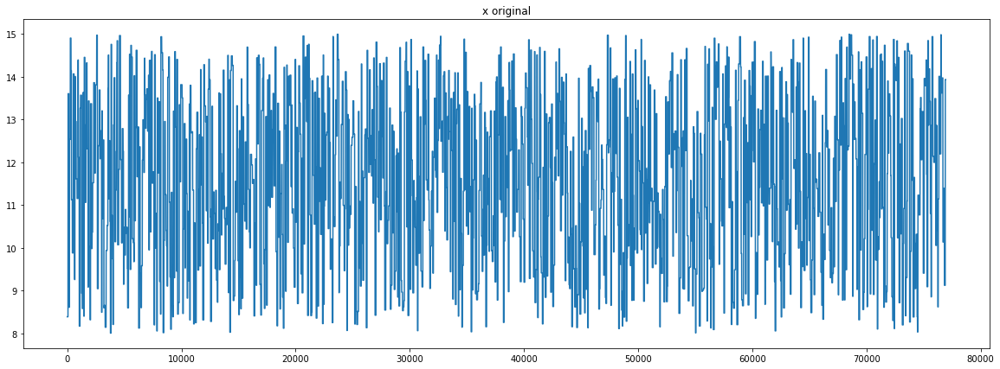

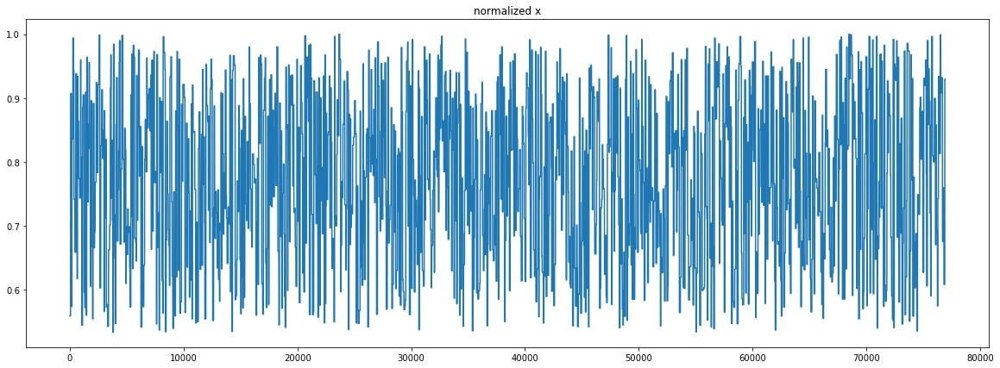

Y normalized, norms: [0.01499693]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (22951, 1)
Y_tensor torch.Size([22951, 1])
X_tensor torch.Size([128, 22949, 1])
X normalized, norms: [14.99712541]
x shape (76924, 1)
x_normalized shaoe (76924, 1)


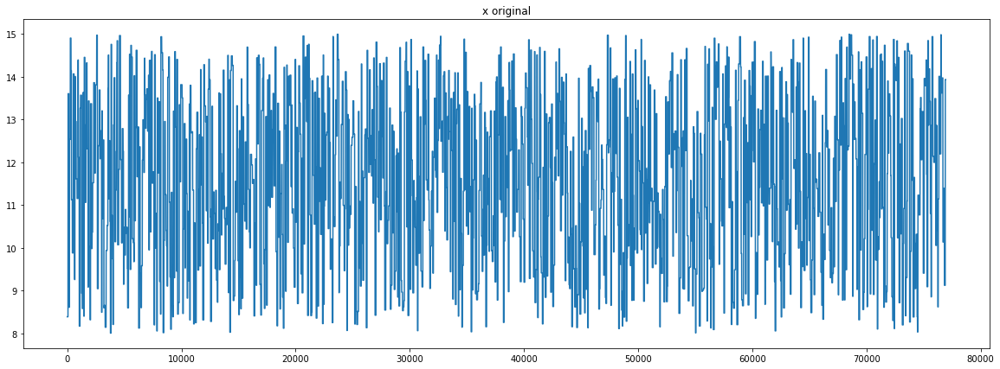

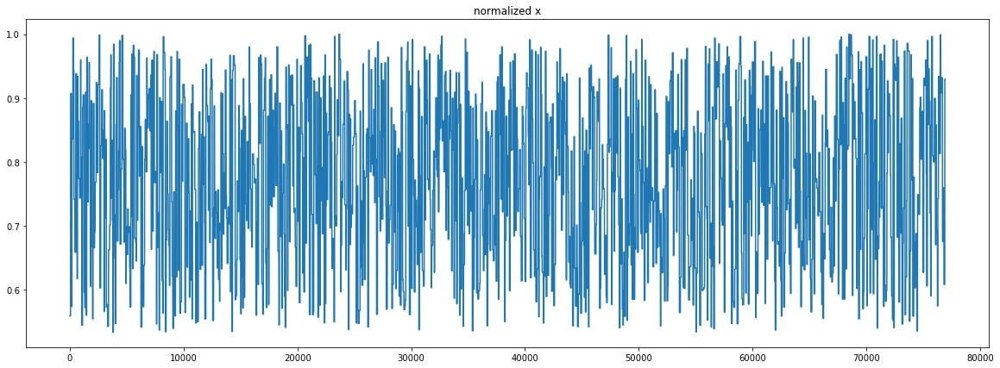

Y normalized, norms: [0.01499693]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53719, 1)
Y_tensor torch.Size([53719, 1])
X_tensor torch.Size([128, 53717, 1])
train set: [53719] batches
test set: [22951] batches
data_loading time 31.867052793502808 secs


In [4]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 128, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


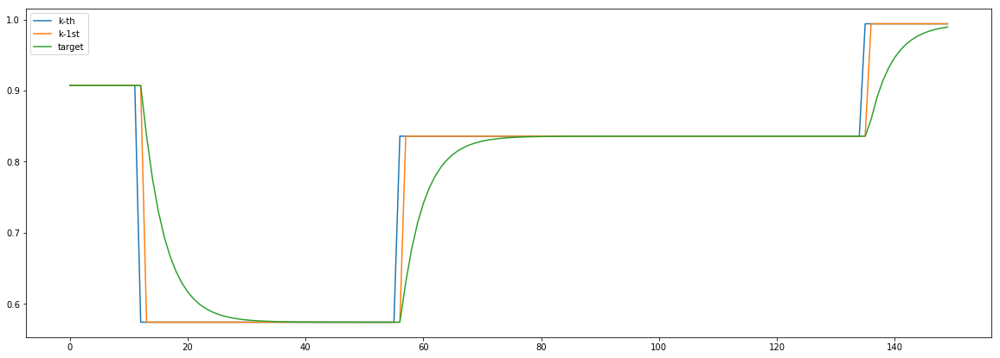

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 128, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


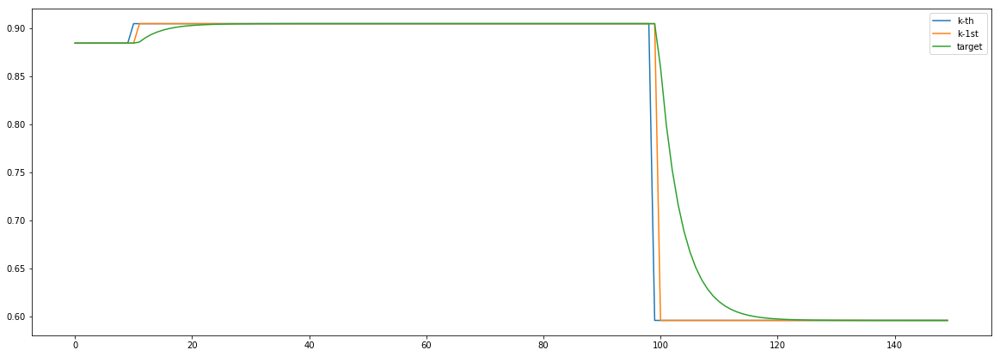

In [5]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

## Creating objects from imported files

In [6]:
from src.Model import LSTM
from src.Losses import myLoss, prognose_dy  # imports here for faster rerun and debug procedure

model = LSTM(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
             output_dim=p_net['output_dim'],
             num_layers=p_net['num_layers'])

loss_fn = myLoss

# if p_train['loss_fn'] == 'mse':  
#     loss_fn = torch.nn.MSELoss(reduction=p_train['reduction'])
# elif p_train['loss_fn'] == 'l1':  
#     loss_fn = torch.nn.L1Loss(reduction=p_train['reduction'])

p_optim = p_train['optimizer']
wd = p_optim['weight_decay']
lr = p_optim['learning_rate']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [3443.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [7]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

lstm.weight_ih_l0 		 torch.Size([64, 1])
lstm.weight_hh_l0 		 torch.Size([64, 16])
lstm.bias_ih_l0 		 torch.Size([64])
lstm.bias_hh_l0 		 torch.Size([64])
lstm.weight_ih_l1 		 torch.Size([64, 16])
lstm.weight_hh_l1 		 torch.Size([64, 16])
lstm.bias_ih_l1 		 torch.Size([64])
lstm.bias_hh_l1 		 torch.Size([64])
linear.weight 		 torch.Size([3, 16])
linear.bias 		 torch.Size([3])


In [8]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [9]:
logging.info("History INITIALIZED")

hist = {
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "const":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "const":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "const":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),            
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs)
}

In [10]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()

    y_pred = model(x_batch)
    losses = loss_fn(y_pred, y_batch, x_batch, config)
    main_loss, aux_loss, const_loss = losses
    main_loss -= main_loss
    aux_loss *= 1000
    losses = [main_loss * 0, aux_loss * 1000, const_loss]
#         print(f"losses before scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
    
    
    
    if backprop:
        max_loss = max(losses)
        combined_loss = sum(losses)

        optimizer.zero_grad()

        combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")

        optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    hist_part["aux"][iter_index] = aux_loss.item()
    hist_part["const"][iter_index] = const_loss.item()
    
    return y_pred

In [11]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_const = np.average(batches_hist["const"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["const"][t] = mean_const
    return mean_main, mean_aux, mean_const

In [12]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

In [13]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                            factor=p_sched['lr_drop'],
                             min_lr=10**p_sched['early_stop_order'],
                             verbose=True)
print("LR scheduler set_uped")
scheduler.state_dict()

LR scheduler set_uped


{'factor': 0.3,
 'min_lrs': [1e-07],
 'patience': 2,
 'verbose': True,
 'cooldown': 3,
 'cooldown_counter': 0,
 'mode': 'min',
 'threshold': 0.005,
 'threshold_mode': 'rel',
 'best': inf,
 'num_bad_epochs': 0,
 'mode_worse': inf,
 'eps': 1e-08,
 'last_epoch': -1}

## Train model


aux preds: 0.8567484021186829 0.3284637928009033
main loss 0.0
aux loss 69795.98568444069
const loss 0.11071385798725085
combined loss 69796.09639829867 


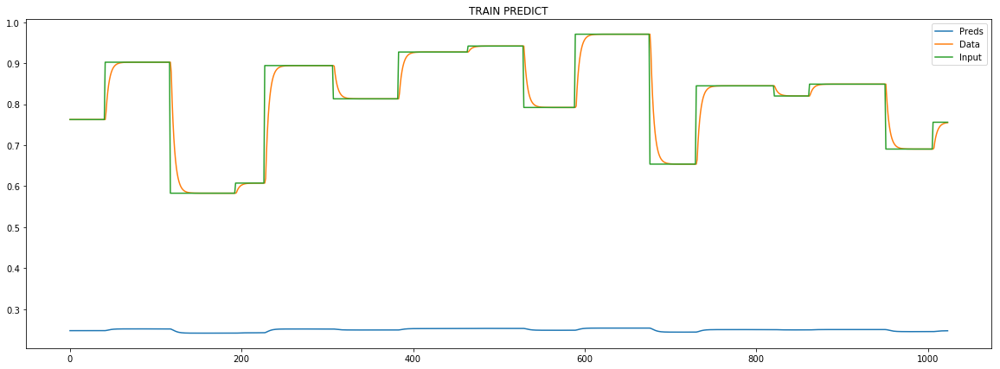

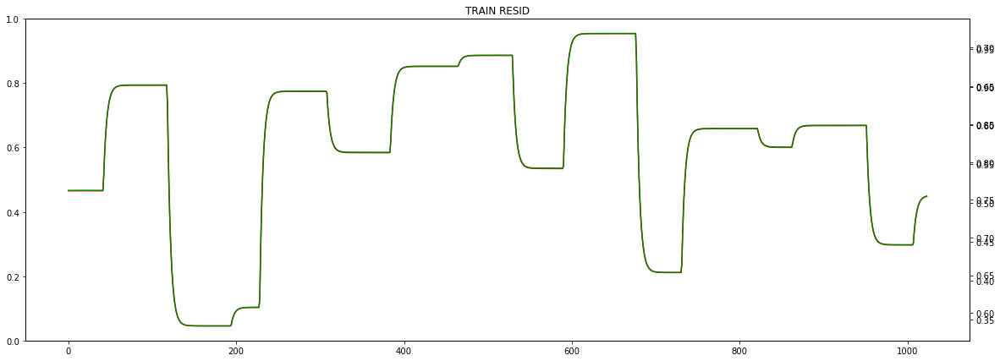

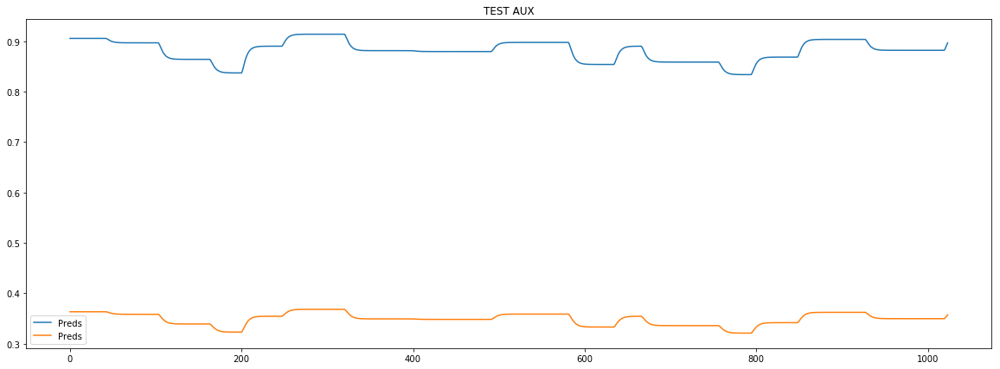

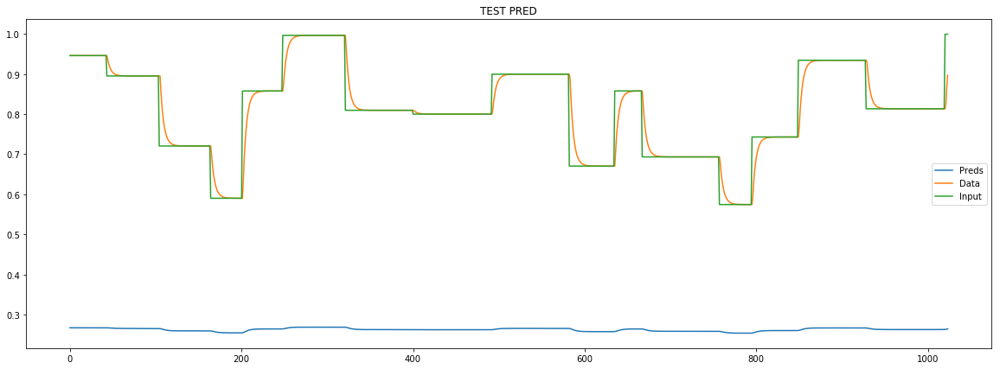

Epoch [0] 
     train_loss[69796.09639829867] 
     eval_train[21614.888229886503] 
     eval_test[22160.056082579224]



aux preds: 1.5919482707977295 1.0002946853637695
main loss 0.0
aux loss 4222.517453120305
const loss 0.5438502068416431
combined loss 4223.061303327147 


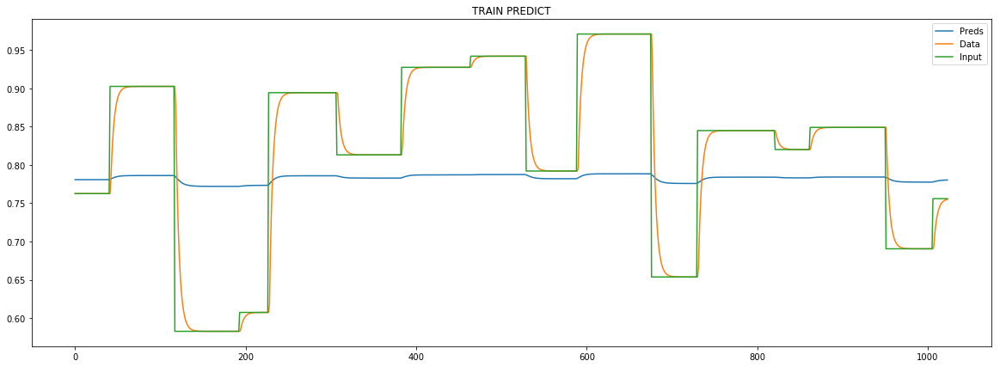

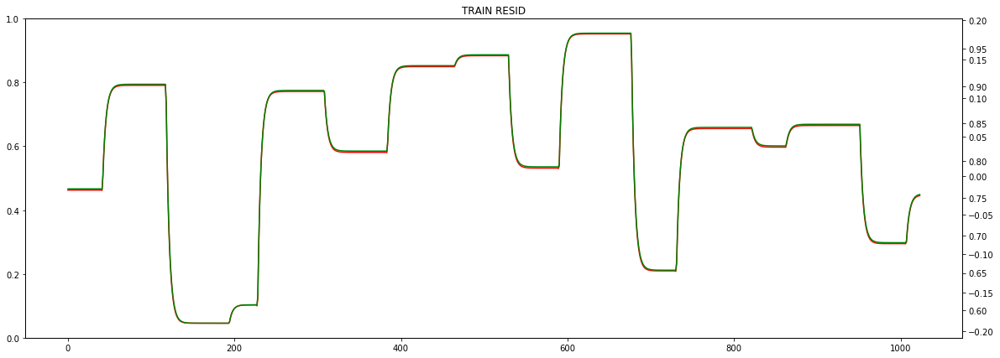

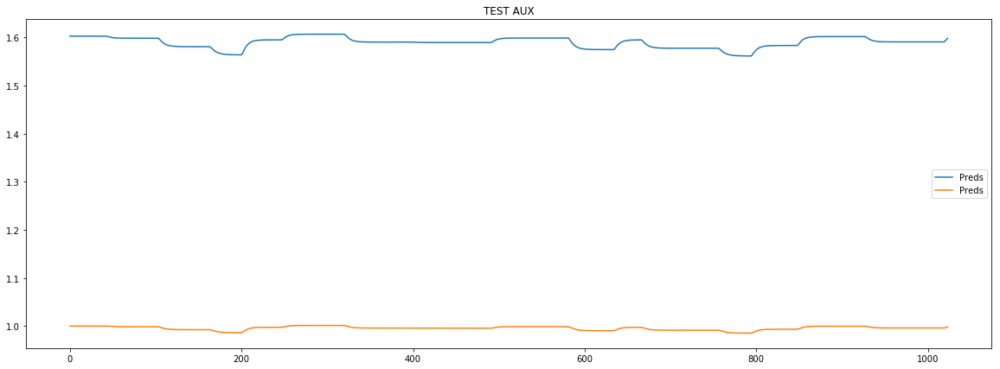

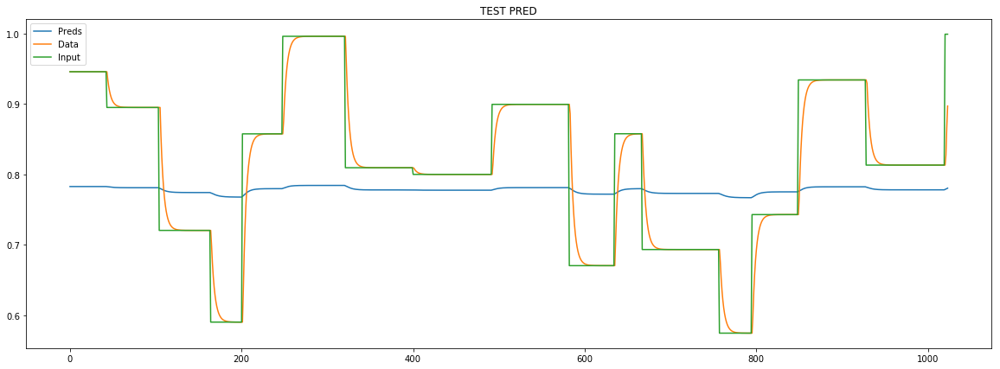

Epoch [1] 
     train_loss[4223.061303327147] 
     eval_train[952.4756964215866] 
     eval_test[1033.7446681592953]



aux preds: 1.5779318809509277 0.9945093989372253
main loss 0.0
aux loss 956.2218868549054
const loss 0.21926040317003542
combined loss 956.4411472580754 


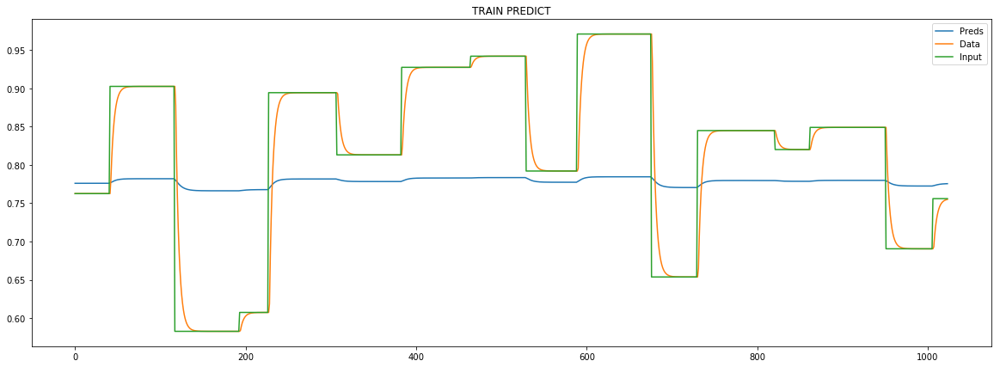

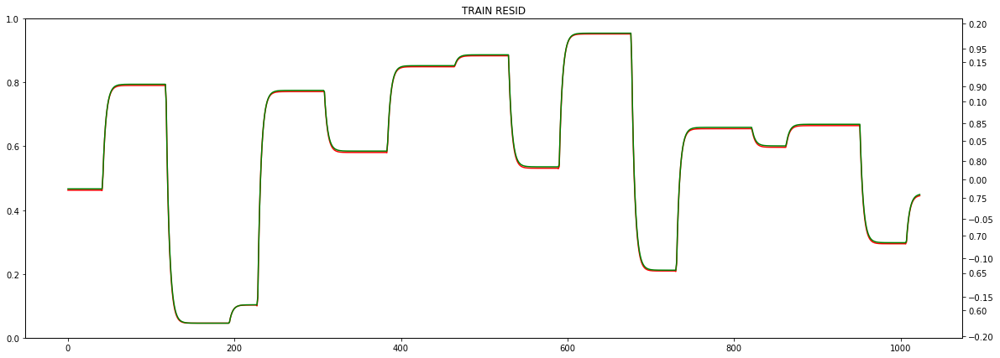

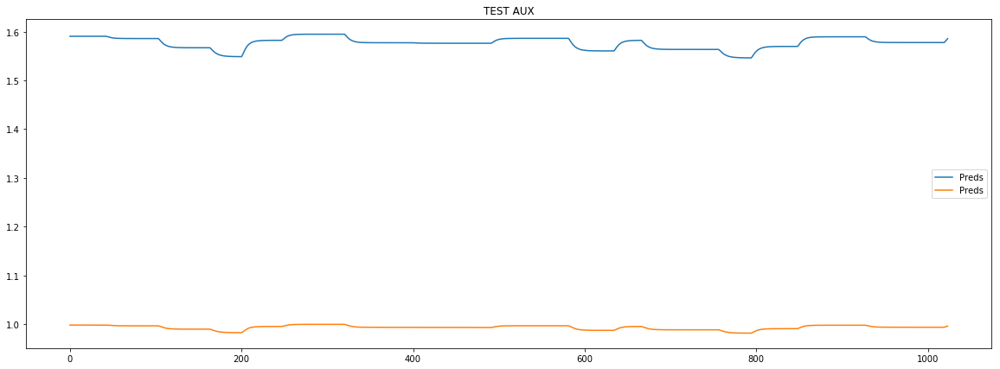

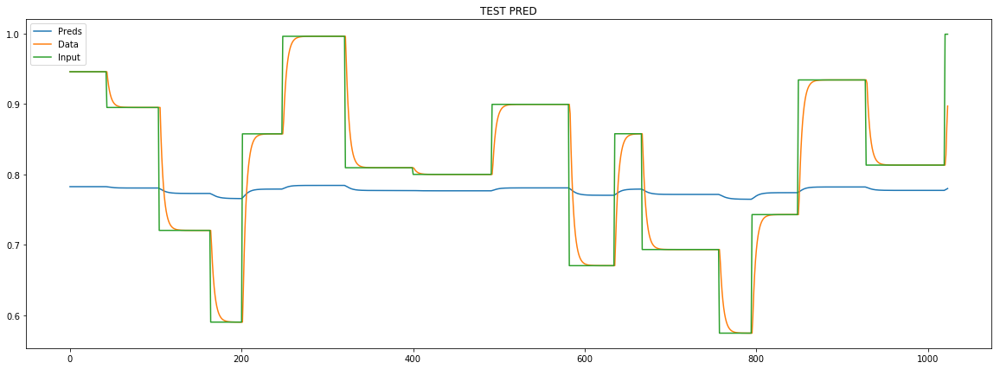

Epoch [2] 
     train_loss[956.4411472580754] 
     eval_train[948.3232316485104] 
     eval_test[1029.8027542714367]



aux preds: 1.5574631690979004 0.9915890097618103
main loss 0.0
aux loss 946.2795838576096
const loss 0.26473292823021227
combined loss 946.5443167858398 


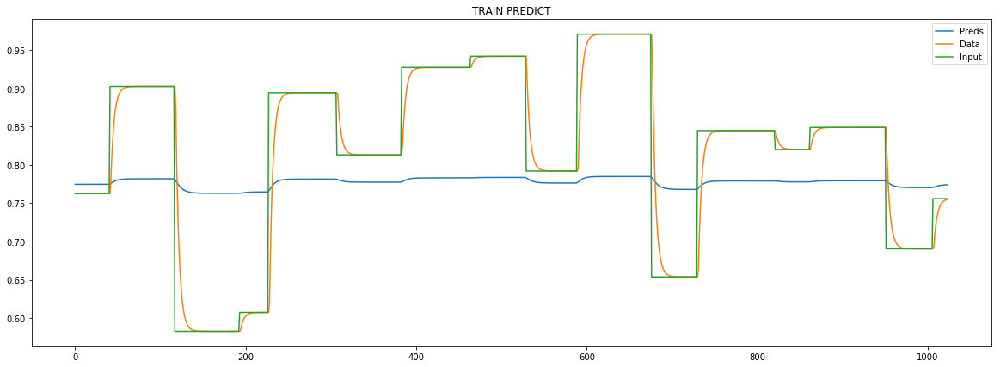

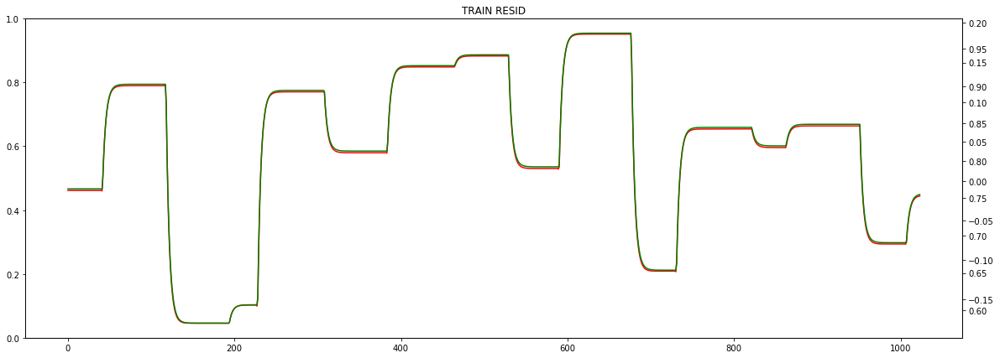

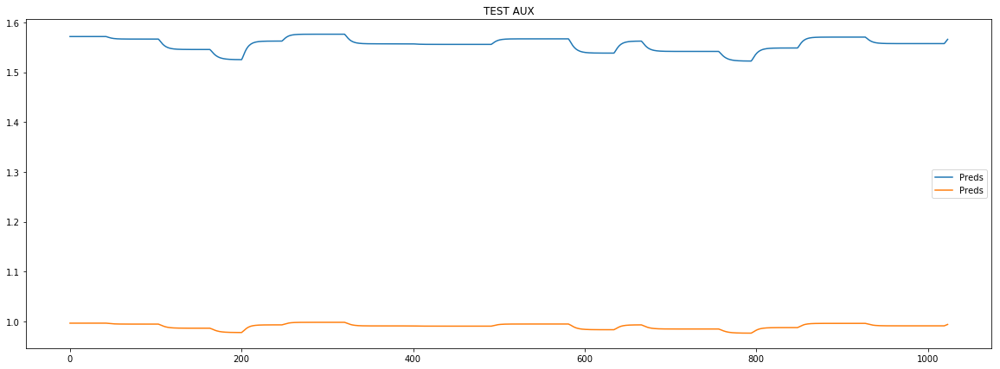

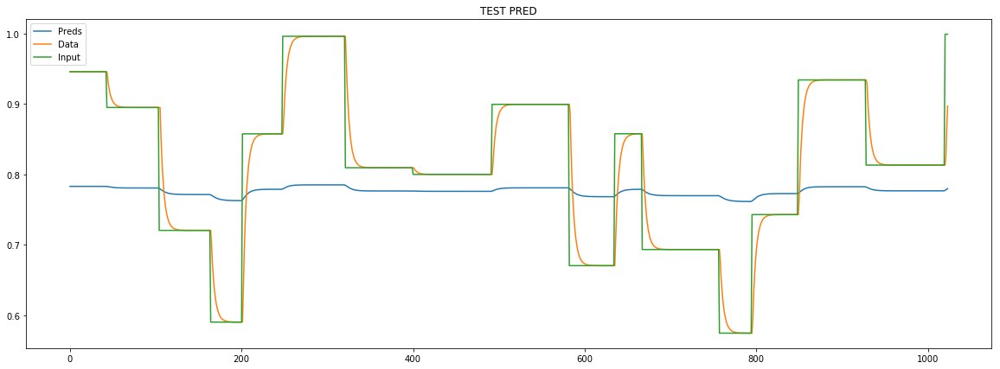

Epoch [3] 
     train_loss[946.5443167858398] 
     eval_train[941.4888268841] 
     eval_test[1023.1224964254282]



aux preds: 1.5350068807601929 0.9891675710678101
main loss 0.0
aux loss 938.102047259991
const loss 0.3402131176911868
combined loss 938.4422603776821 


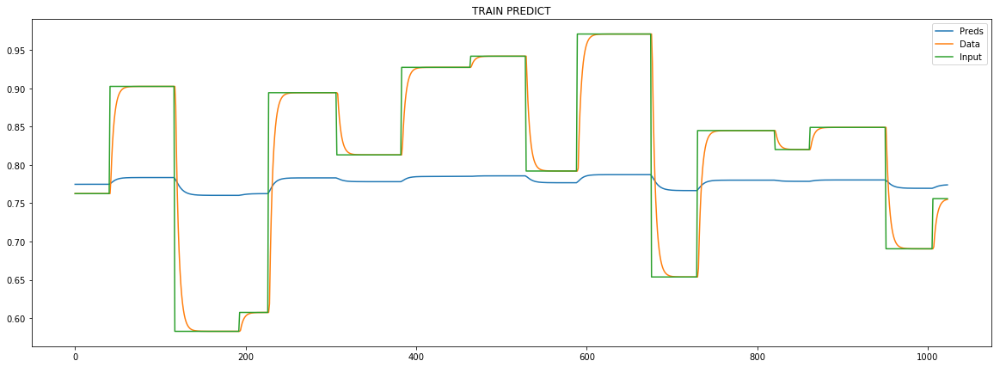

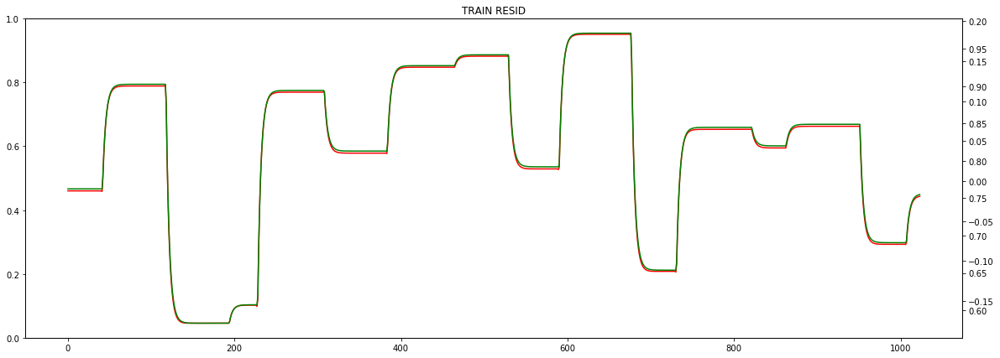

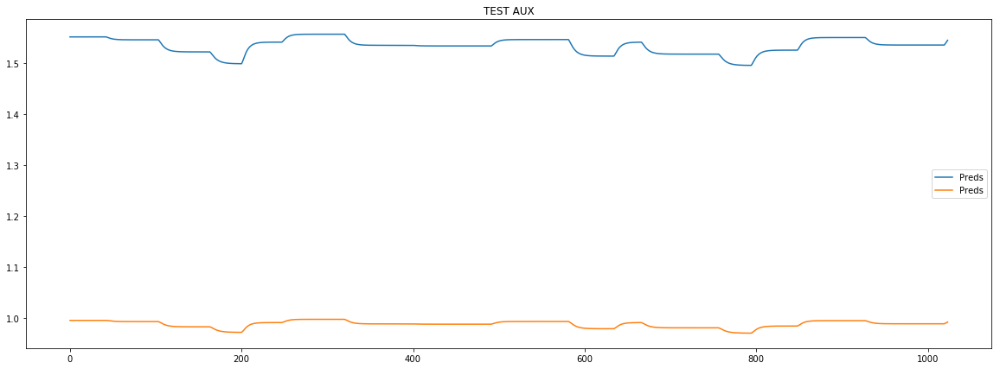

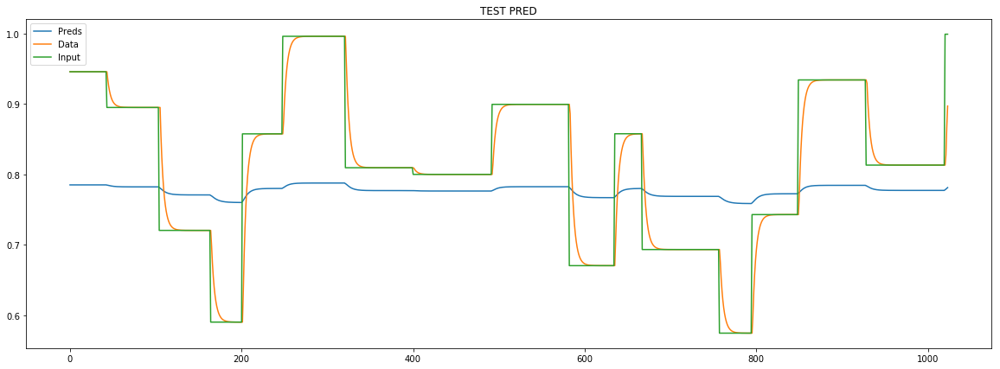

loss rate [0.014711505975898986]
Epoch [4] 
     train_loss[938.4422603776821] 
     eval_train[932.3234946575875] 
     eval_test[1013.7534519664266]



aux preds: 1.5108071565628052 0.9863008856773376
main loss 0.0
aux loss 926.9123951838567
const loss 0.45981792704417157
combined loss 927.3722131109008 


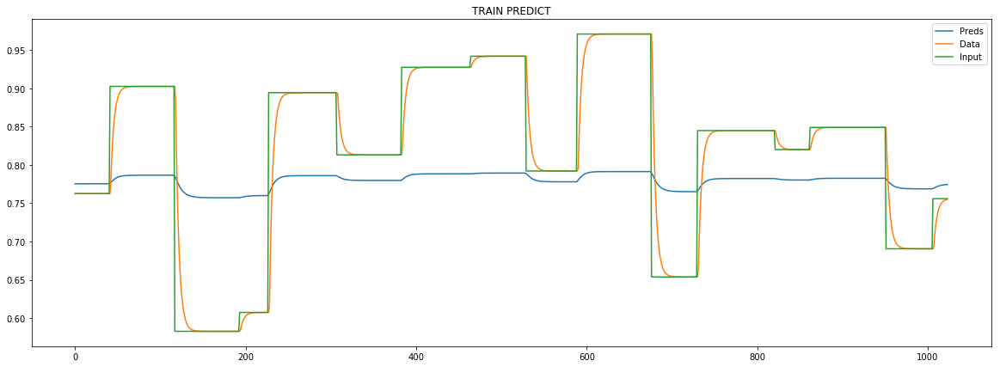

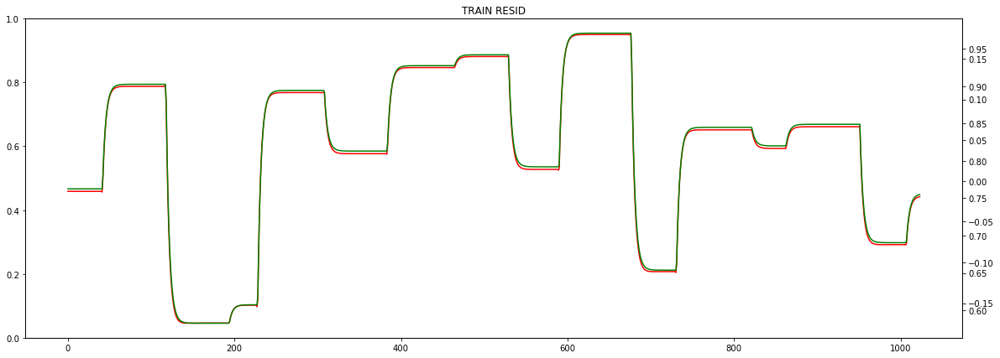

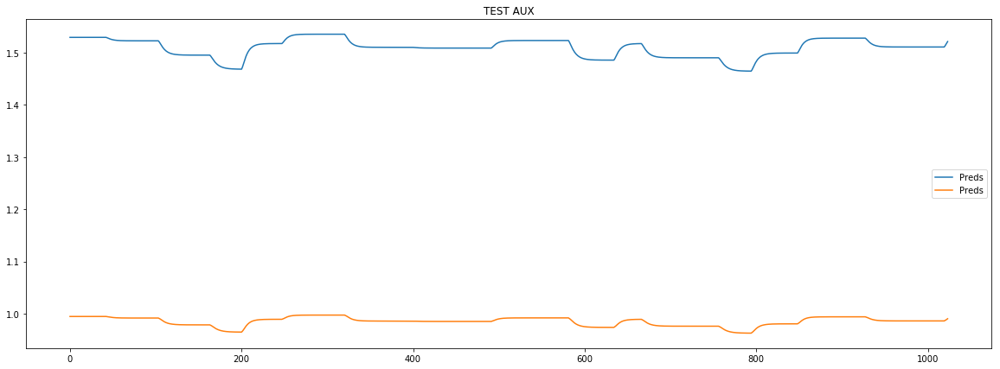

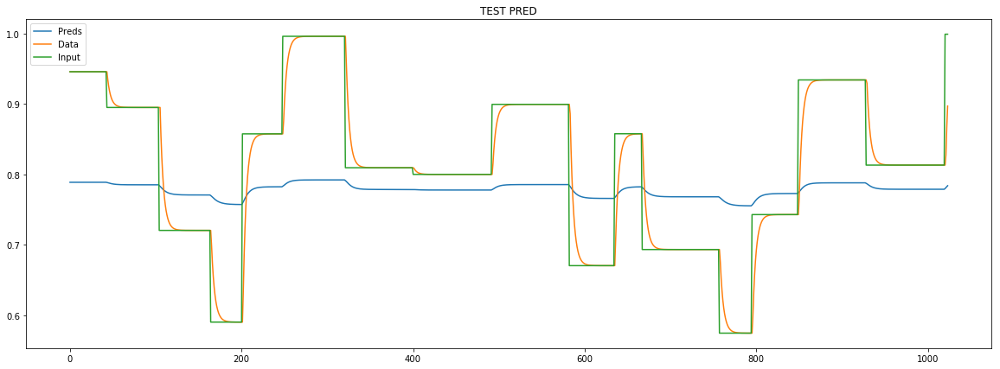

loss rate [0.02110888298517799]
Epoch [5] 
     train_loss[927.3722131109008] 
     eval_train[919.7789803700377] 
     eval_test[1000.648180258545]



aux preds: 1.4854950904846191 0.982867419719696
main loss 0.0
aux loss 911.2304241473859
const loss 0.6520136606234771
combined loss 911.8824378080093 


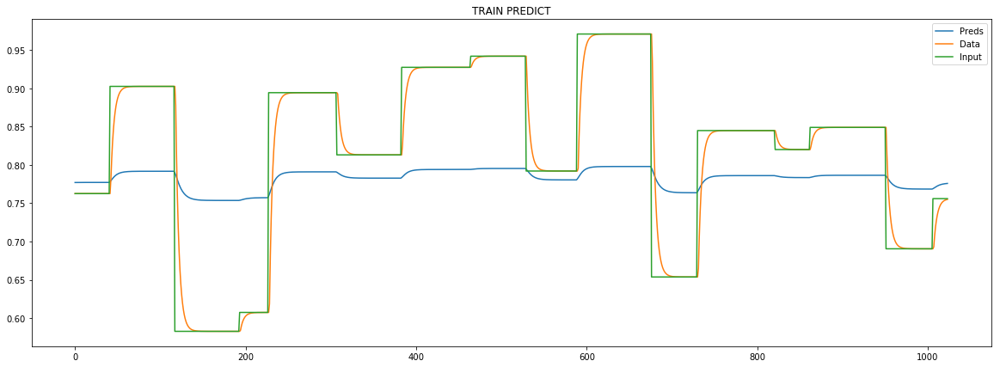

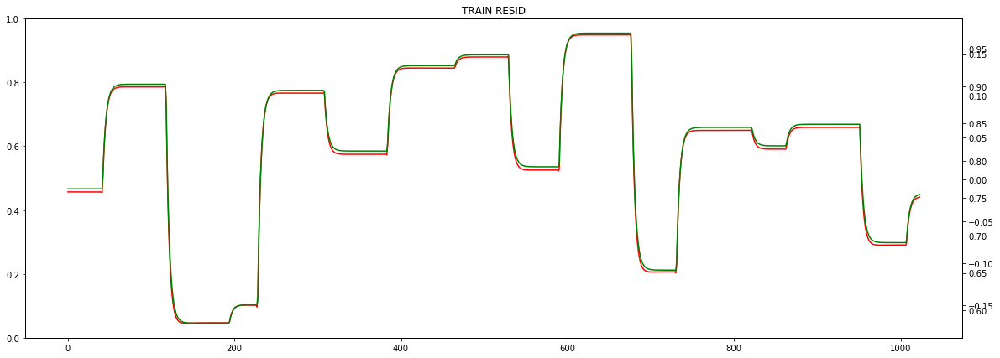

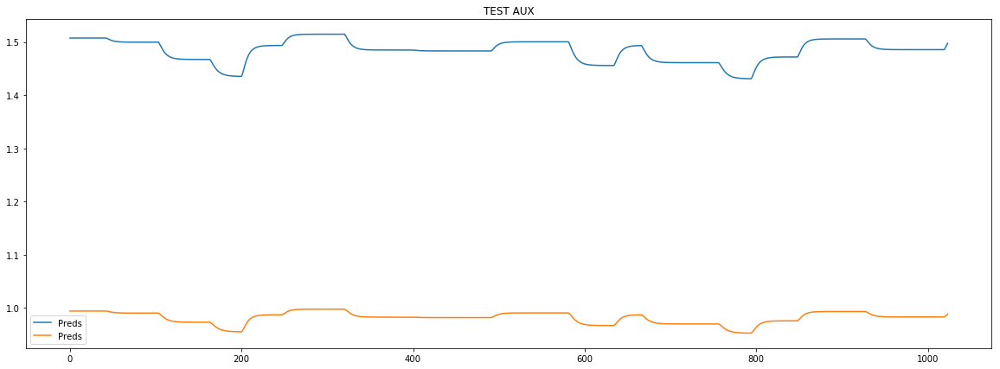

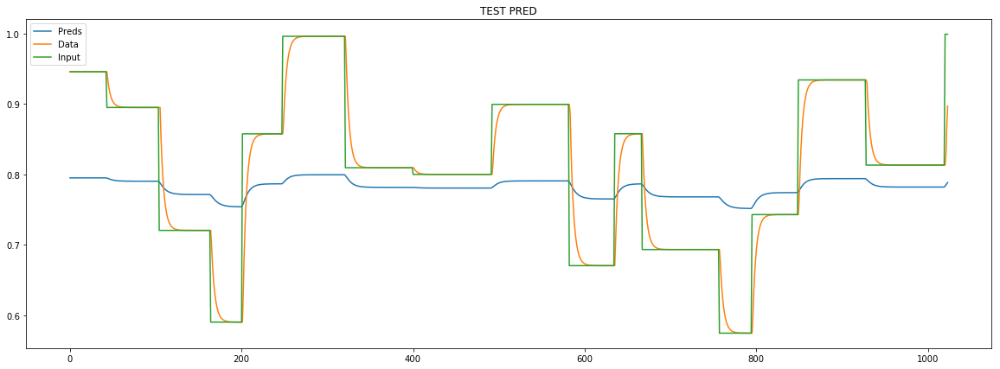

loss rate [0.030632346464480542]
Epoch [6] 
     train_loss[911.8824378080093] 
     eval_train[901.8140550250044] 
     eval_test[981.4925457157872]



aux preds: 1.460106372833252 0.9786293506622314
main loss 0.0
aux loss 887.793572645921
const loss 0.9789605427246827
combined loss 888.7725331886458 


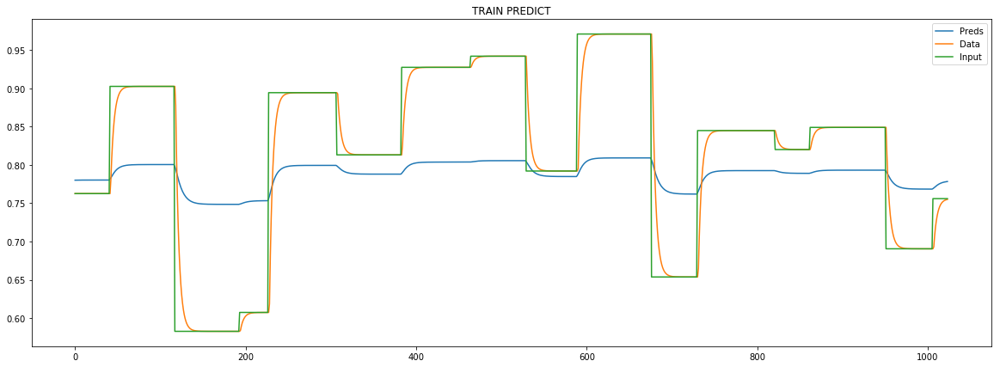

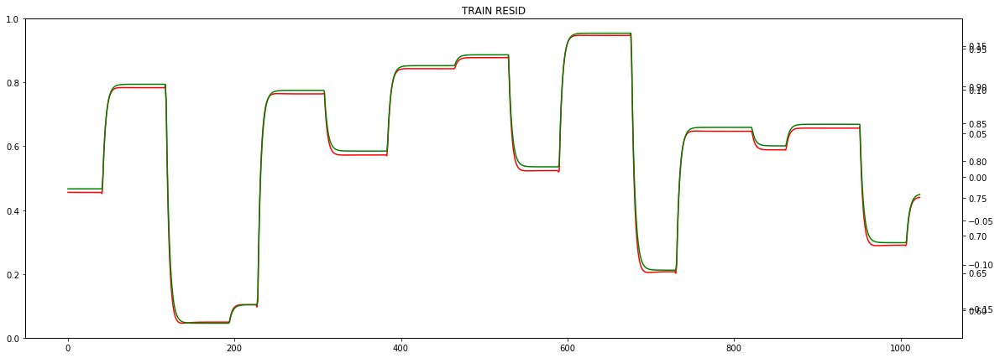

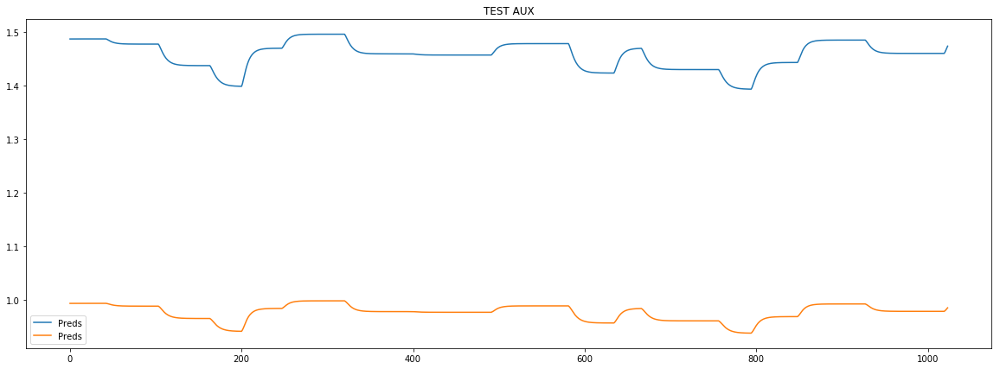

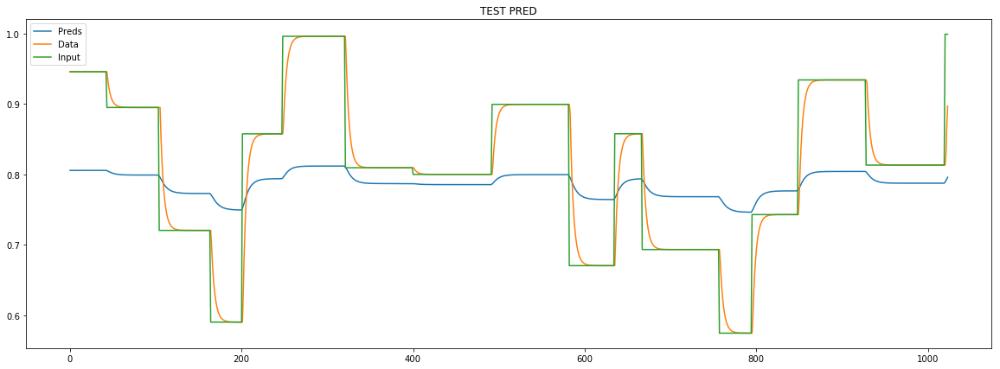

loss rate [0.048237645381237204]
Epoch [7] 
     train_loss[888.7725331886458] 
     eval_train[873.2523721571152] 
     eval_test[950.4597656618464]



aux preds: 1.438193678855896 0.9732785820960999
main loss 0.0
aux loss 845.45020705003
const loss 1.6536918362745872
combined loss 847.1038988863046 


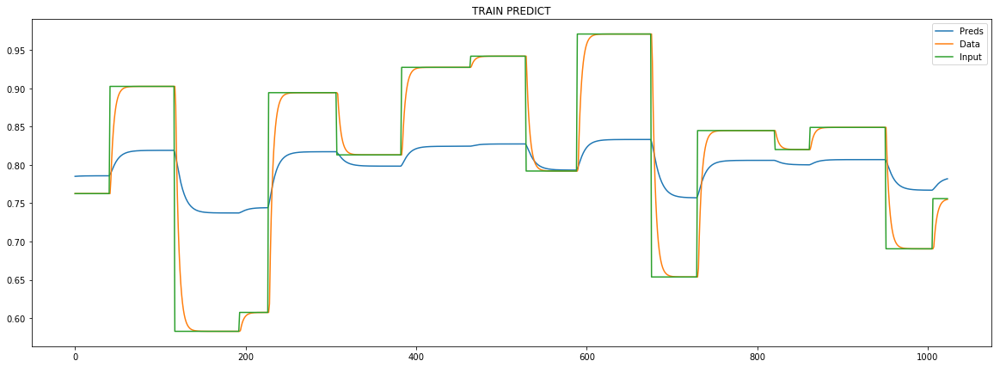

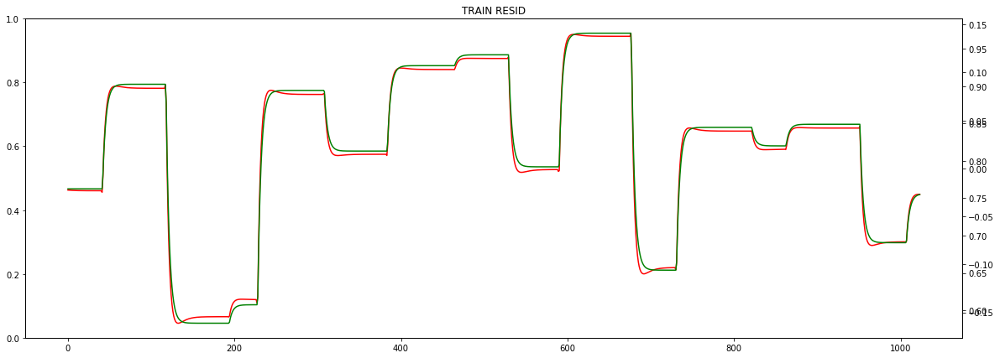

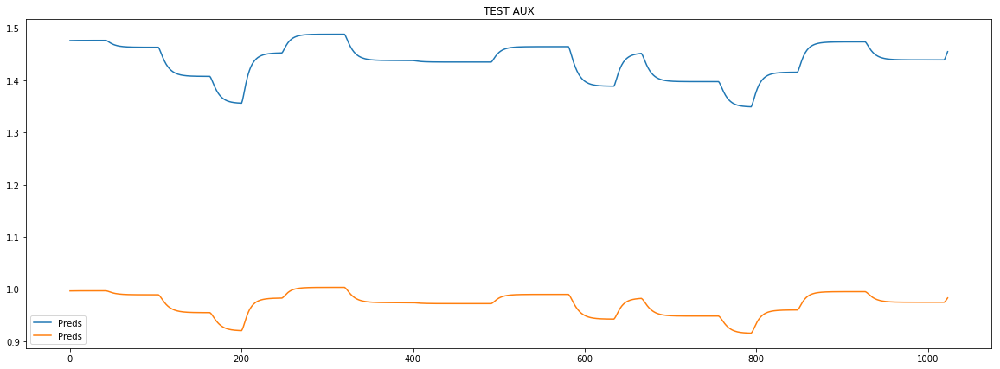

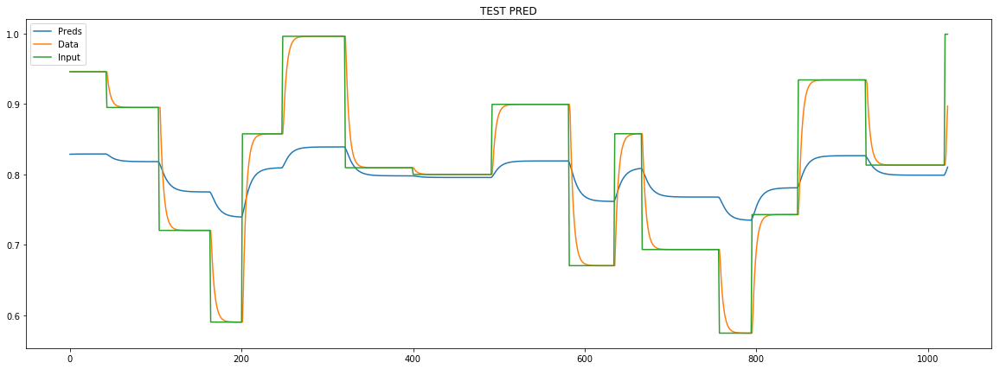

loss rate [0.09752234539086657]
Epoch [8] 
     train_loss[847.1038988863046] 
     eval_train[811.5251099994549] 
     eval_test[882.2021378658035]



aux preds: 1.4539119005203247 0.9940143823623657
main loss 0.0
aux loss 712.5110520582932
const loss 4.996804980131296
combined loss 717.5078570384245 


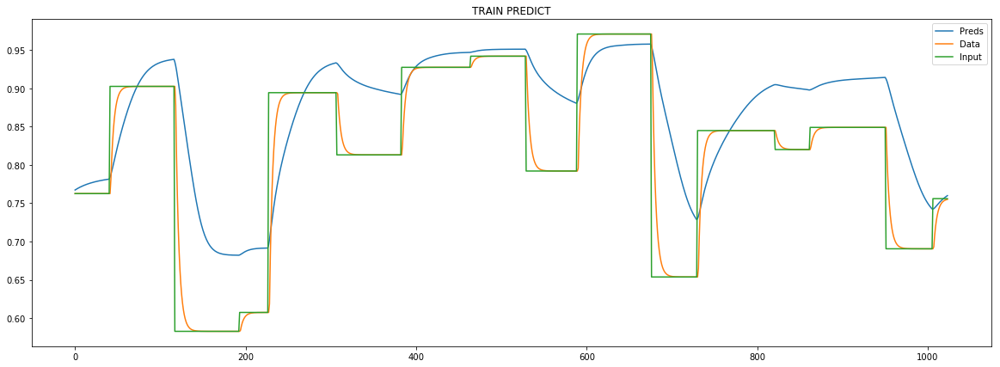

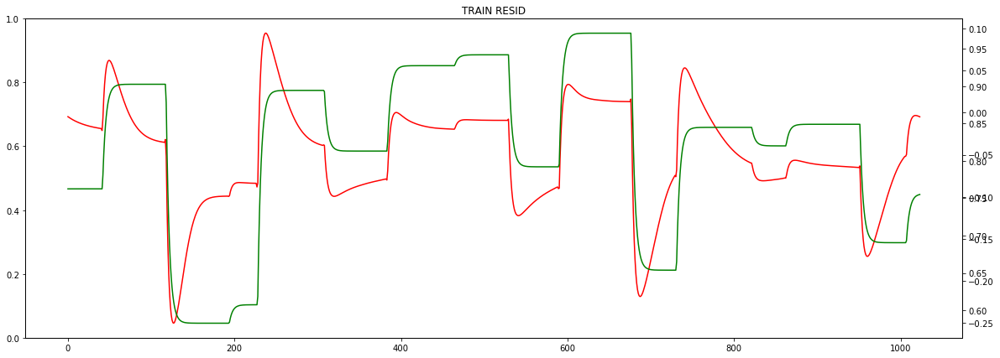

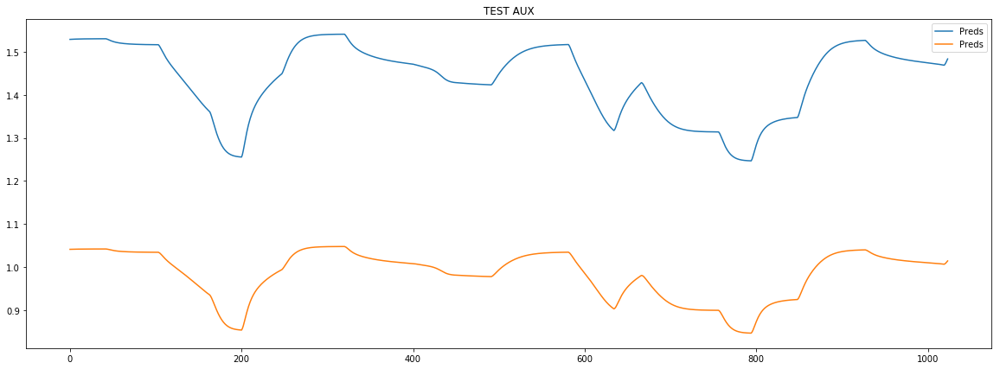

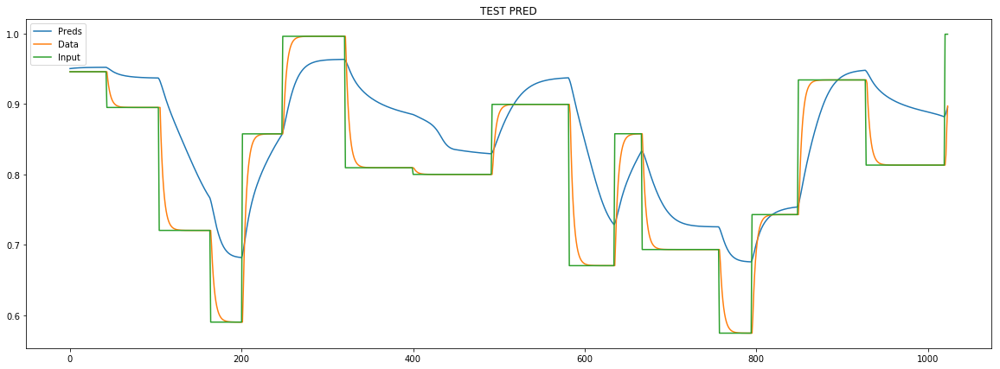

loss rate [0.33873418146987444]
Epoch [9] 
     train_loss[717.5078570384245] 
     eval_train[576.2731578441766] 
     eval_test[620.301381783052]



aux preds: 1.4053972959518433 0.9882738590240479
main loss 0.0
aux loss 539.1515940152682
const loss 14.077861254031841
combined loss 553.2294552693 


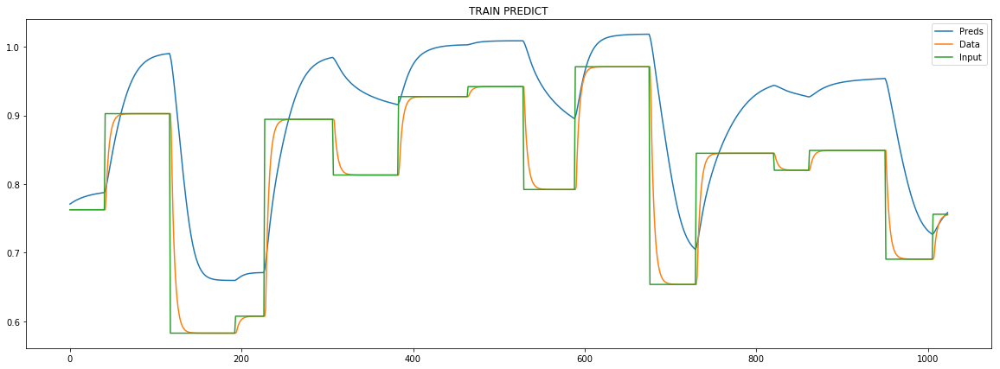

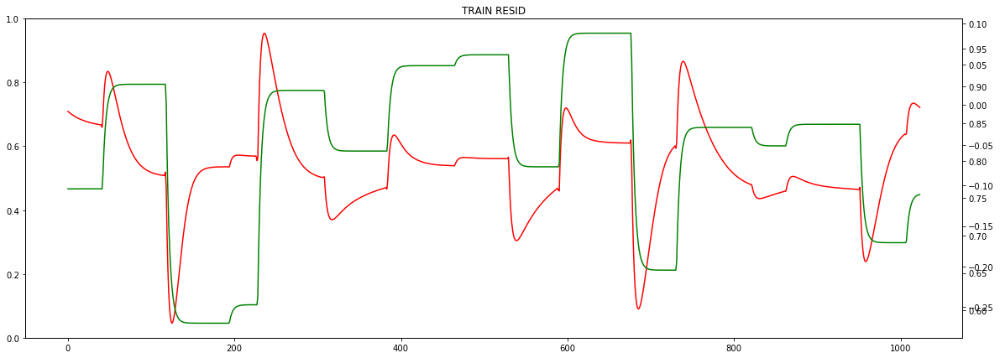

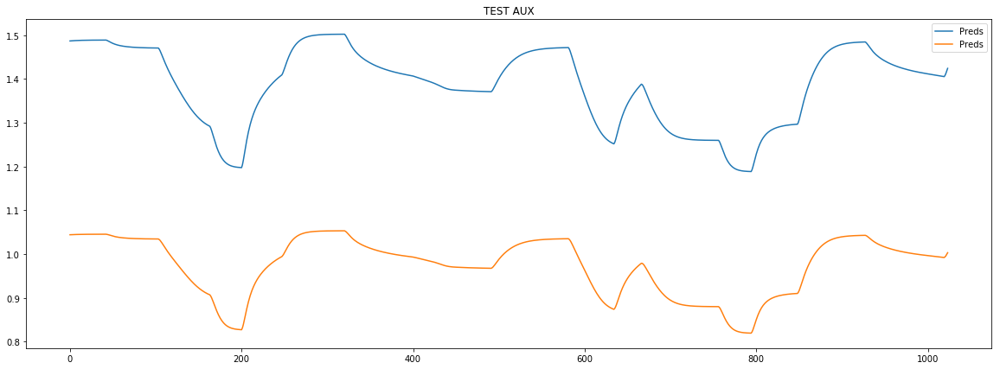

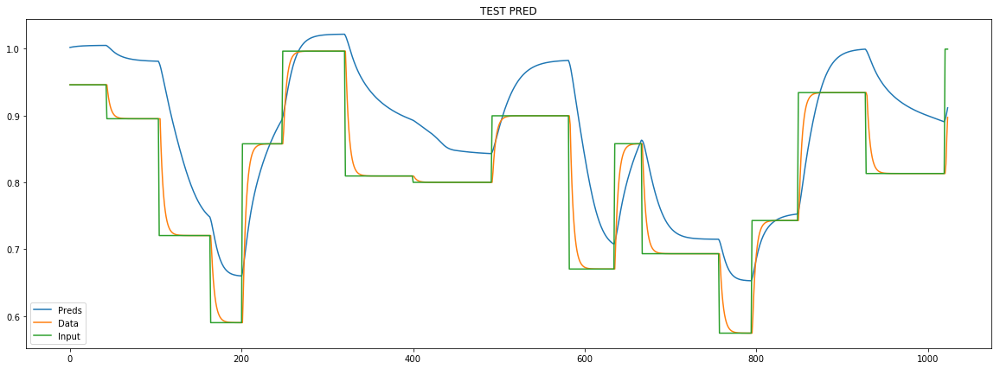

loss rate [0.3508394871645897]
Epoch [10] 
     train_loss[553.2294552693] 
     eval_train[493.2689057680277] 
     eval_test[530.7889680862427]



aux preds: 1.3599929809570312 0.9842702150344849
main loss 0.0
aux loss 466.88293427687427
const loss 15.202122321495644
combined loss 482.08505659836993 


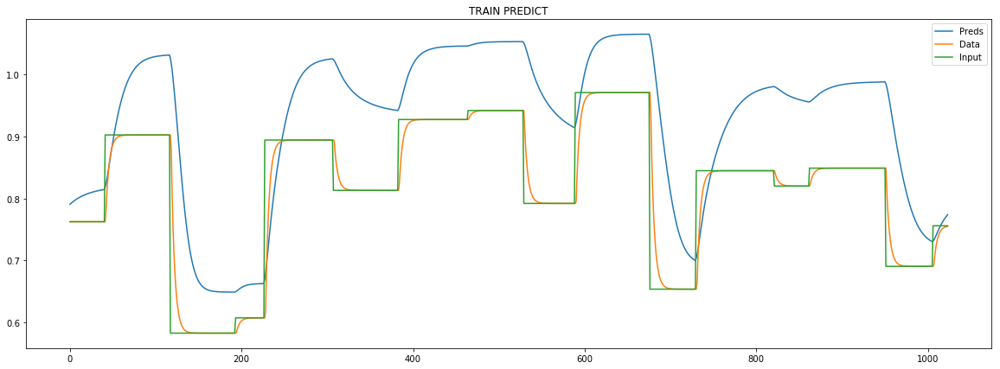

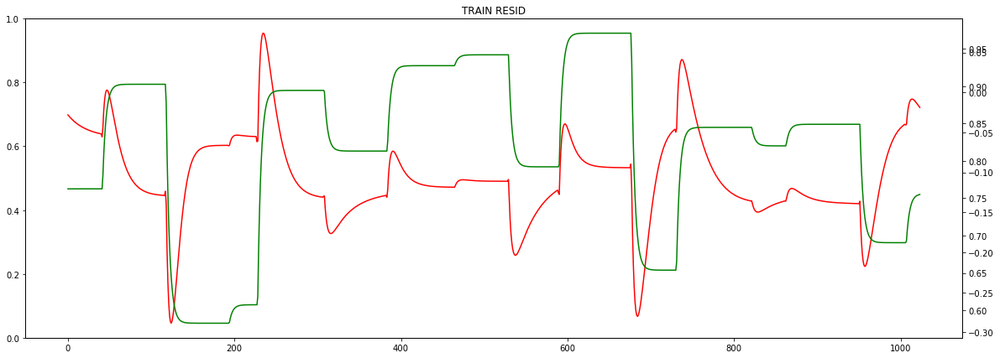

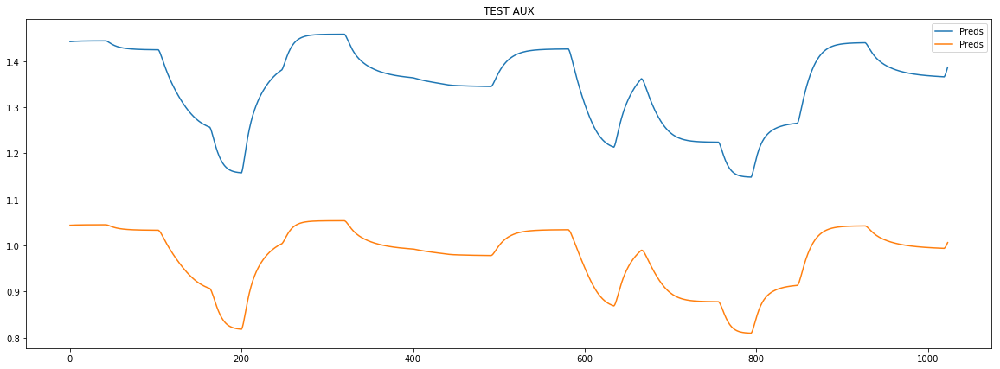

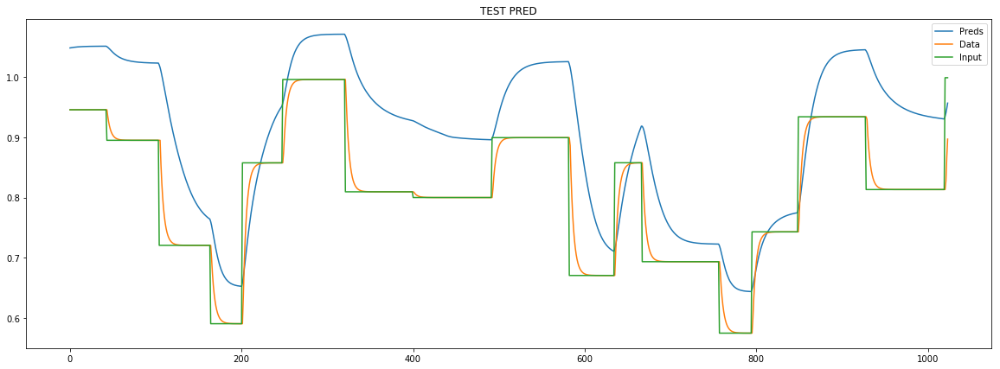

loss rate [0.2706097014107328]
Epoch [11] 
     train_loss[482.08505659836993] 
     eval_train[460.79639781438385] 
     eval_test[494.35460491613907]



aux preds: 1.3077096939086914 0.968662440776825
main loss 0.0
aux loss 422.08129354623645
const loss 14.375564721914438
combined loss 436.4568582681509 


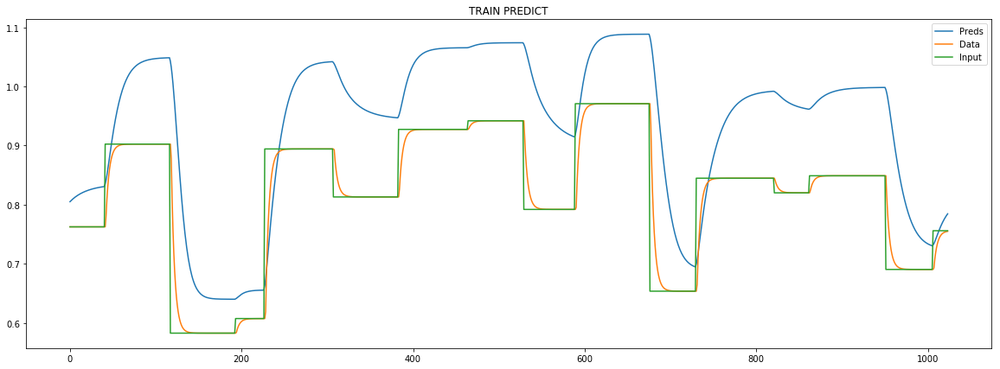

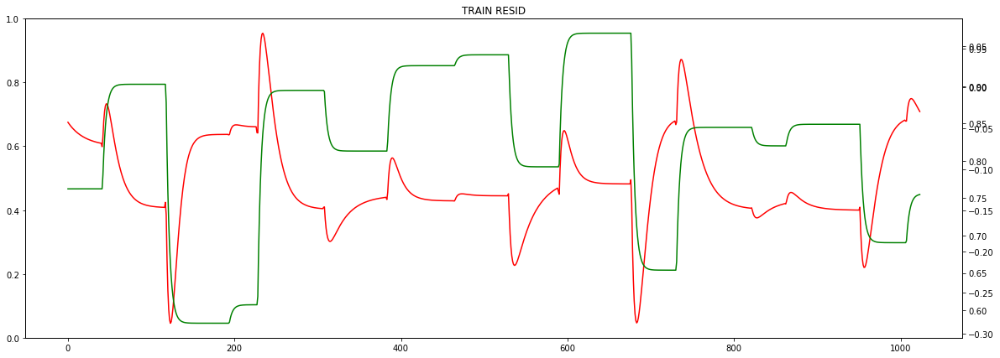

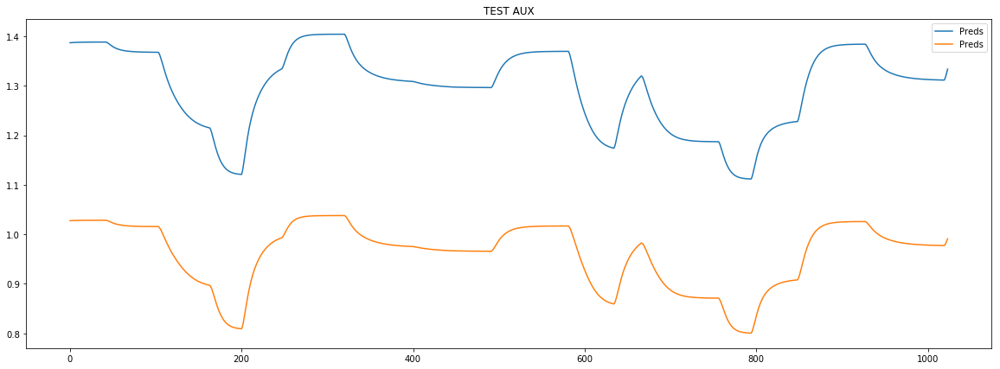

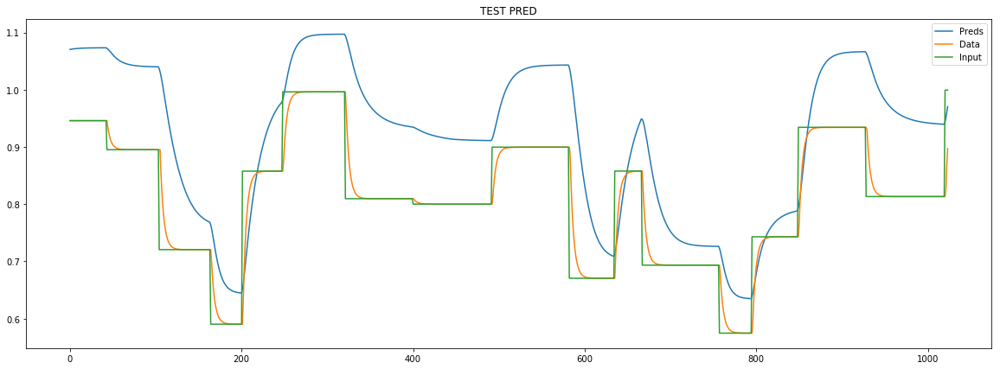

loss rate [0.1734937609481192]
Epoch [12] 
     train_loss[436.4568582681509] 
     eval_train[422.42307864702667] 
     eval_test[453.323507048867]



aux preds: 1.256526231765747 0.952076256275177
main loss 0.0
aux loss 389.6770263084999
const loss 12.624341377845177
combined loss 402.30136768634503 


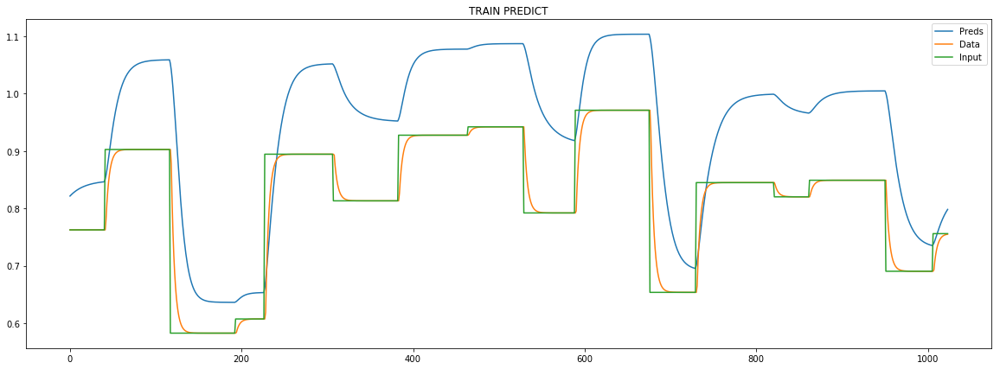

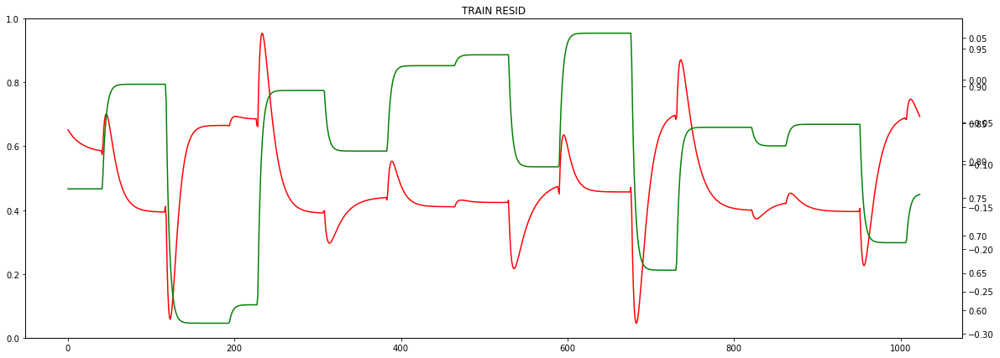

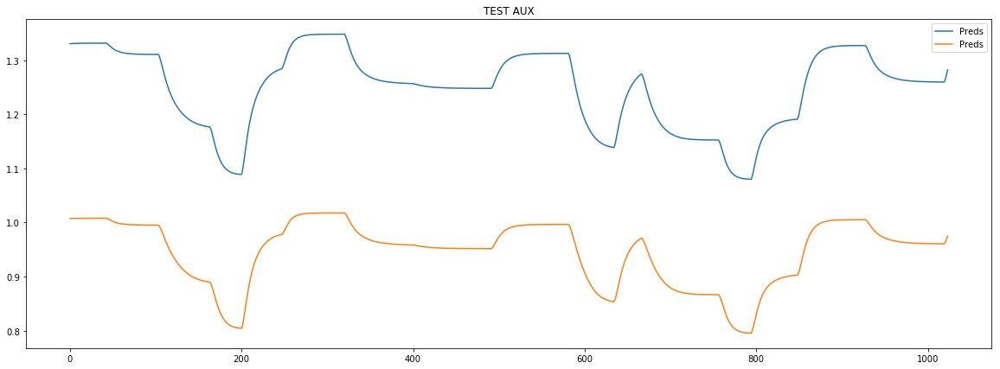

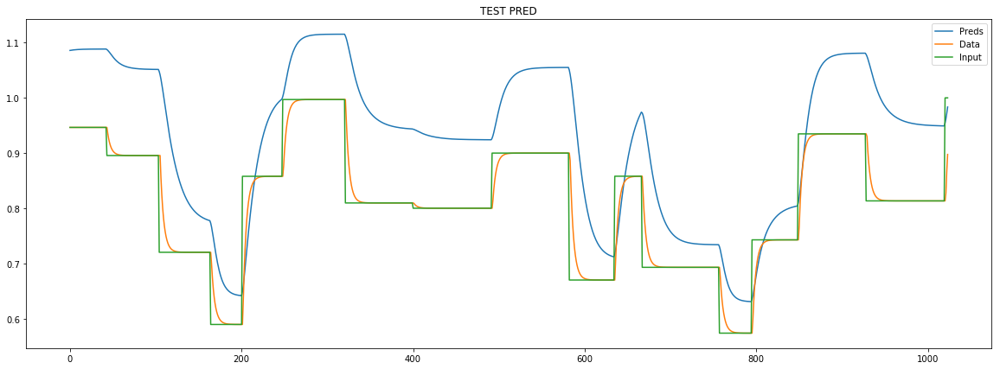

loss rate [0.14934155854712727]
Epoch [13] 
     train_loss[402.30136768634503] 
     eval_train[390.735272526741] 
     eval_test[419.22350068525833]



aux preds: 1.206544280052185 0.9355162978172302
main loss 0.0
aux loss 362.74932406498834
const loss 10.512172845693735
combined loss 373.26149691068207 


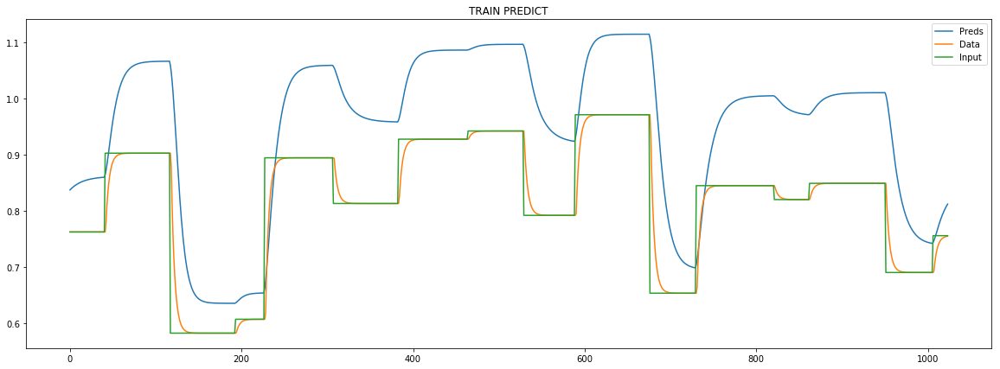

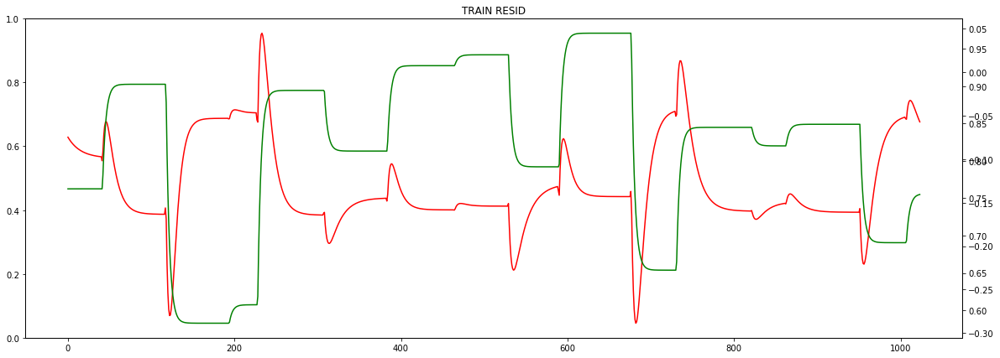

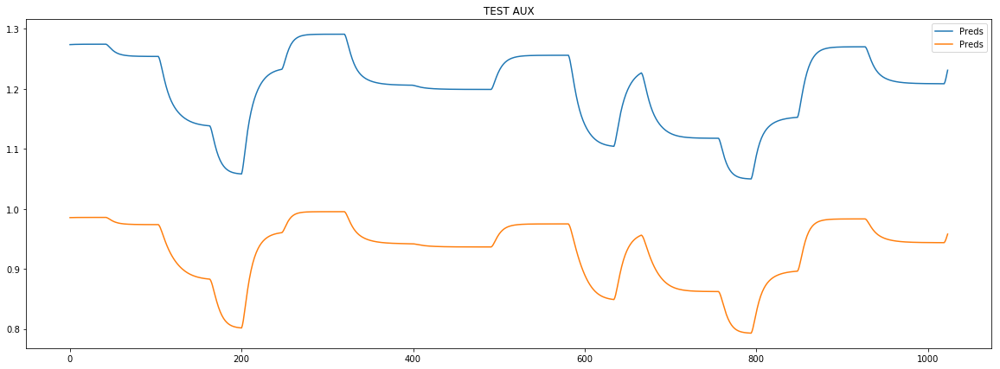

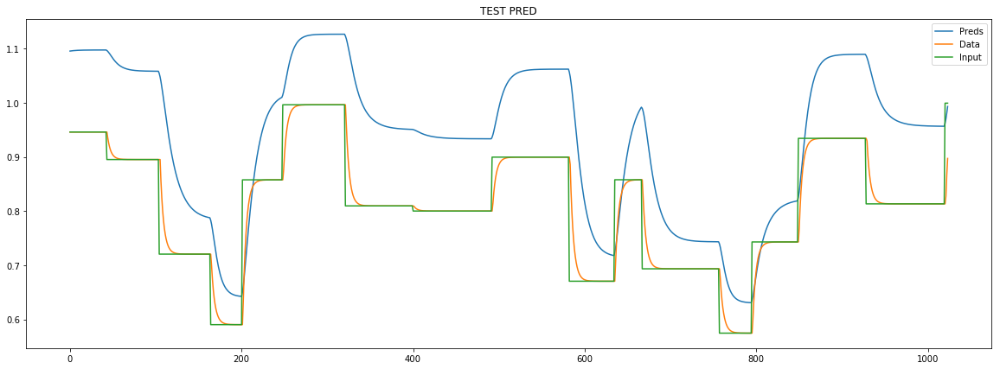

loss rate [0.15003329906382235]
Epoch [14] 
     train_loss[373.26149691068207] 
     eval_train[360.98020852529083] 
     eval_test[387.2736180695621]



aux preds: 1.1577154397964478 0.9197958111763
main loss 0.0
aux loss 338.03356390732984
const loss 8.415760242022001
combined loss 346.4493241493518 


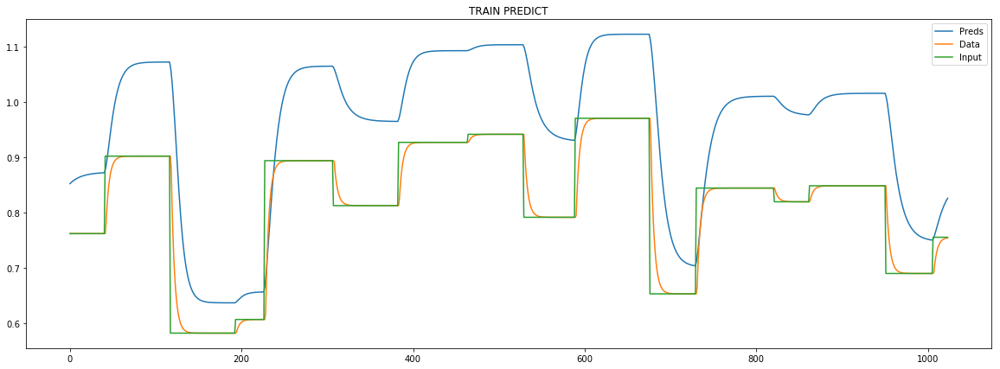

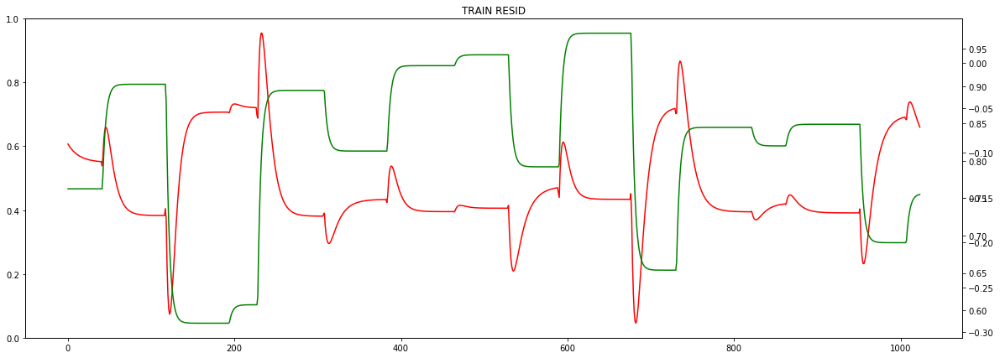

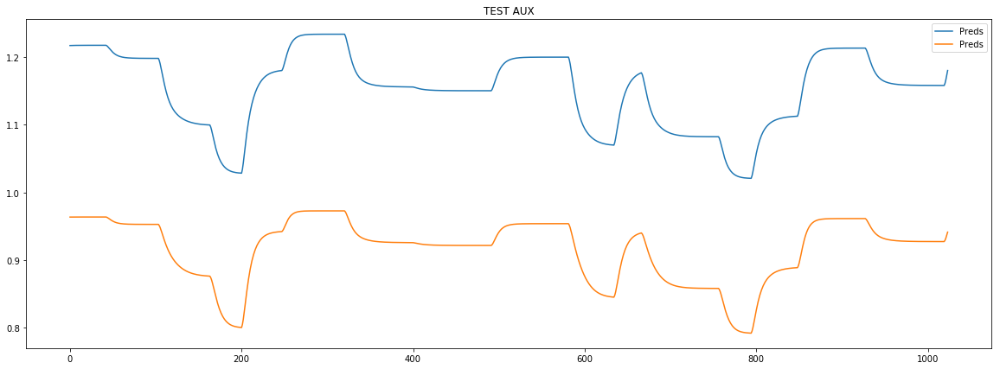

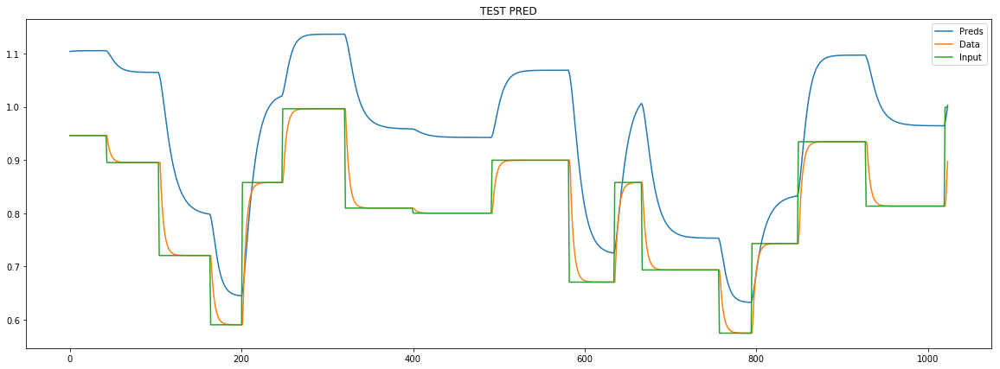

loss rate [0.14818246629013598]
Epoch [15] 
     train_loss[346.4493241493518] 
     eval_train[333.42782908219556] 
     eval_test[357.7124327963049]



aux preds: 1.1097593307495117 0.9053230881690979
main loss 0.0
aux loss 314.5624575981727
const loss 6.509887484403757
combined loss 321.0723450825765 


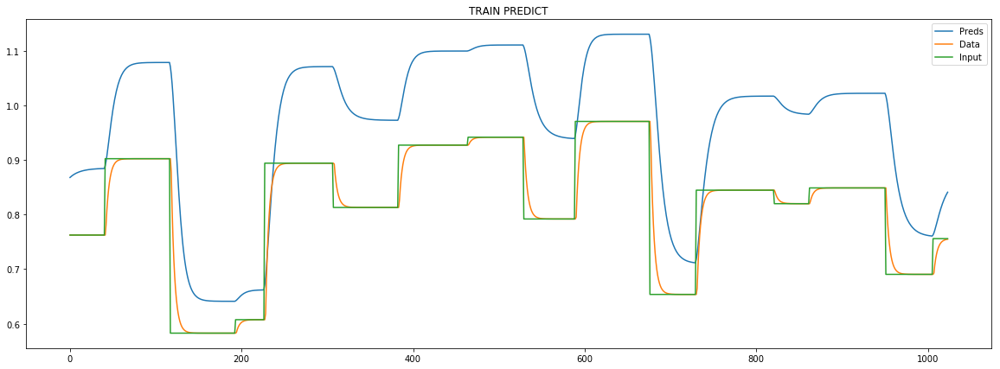

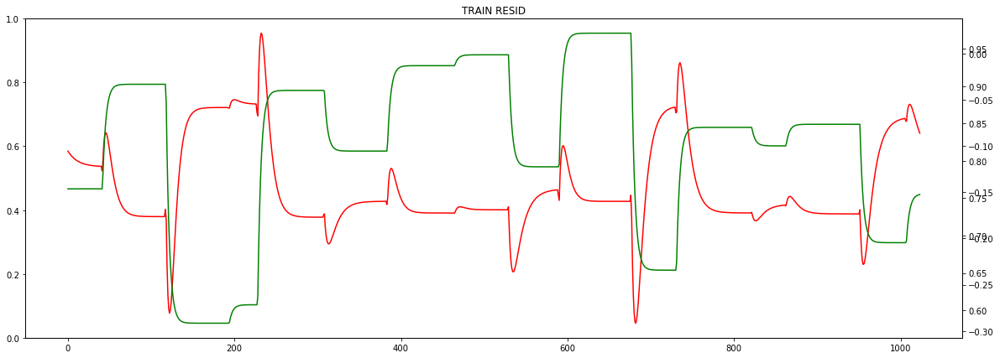

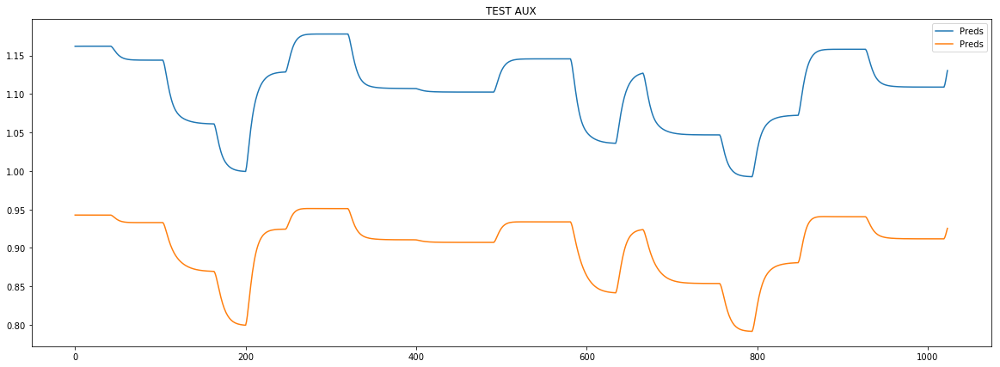

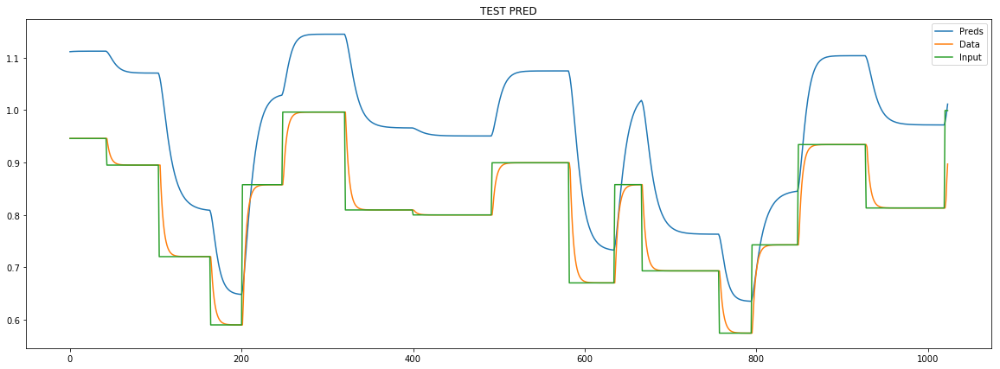

loss rate [0.14850080310578595]
Epoch [16] 
     train_loss[321.0723450825765] 
     eval_train[308.0065798300963] 
     eval_test[330.44116605411875]



aux preds: 1.0622273683547974 0.8921079635620117
main loss 0.0
aux loss 292.0486843402569
const loss 4.865778537896963
combined loss 296.91446287815387 


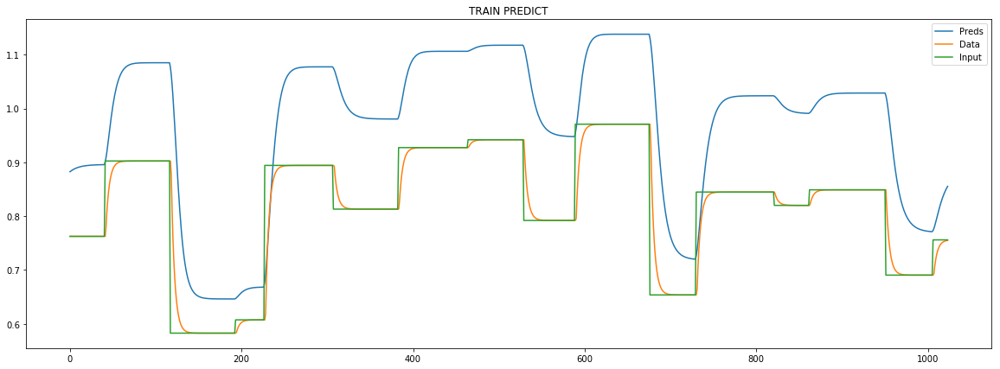

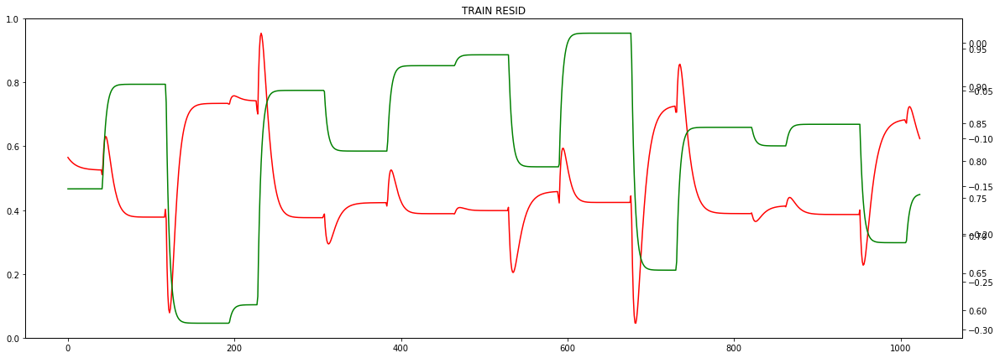

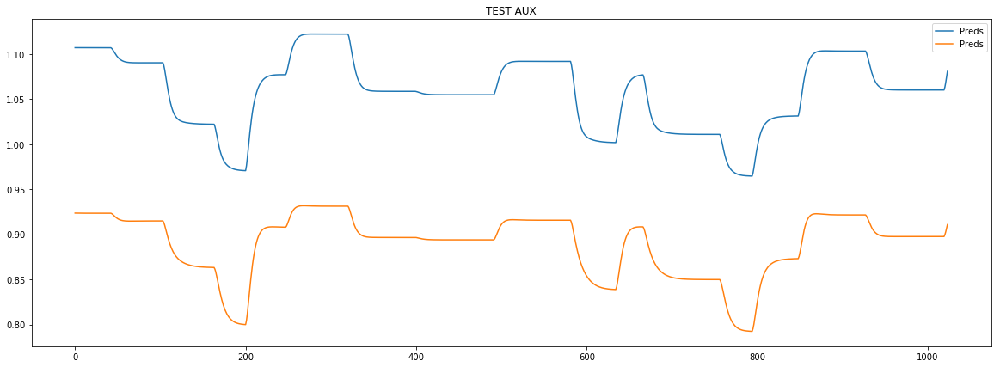

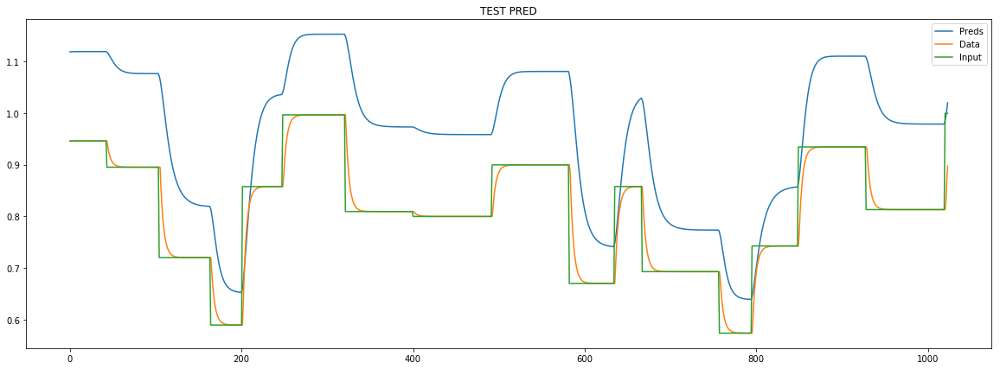

loss rate [0.14989802760437954]
Epoch [17] 
     train_loss[296.91446287815387] 
     eval_train[284.0278787796314] 
     eval_test[304.74093275720423]



aux preds: 1.014378547668457 0.87994784116745
main loss 0.0
aux loss 270.26132451570953
const loss 3.4969840233142557
combined loss 273.7583085390238 


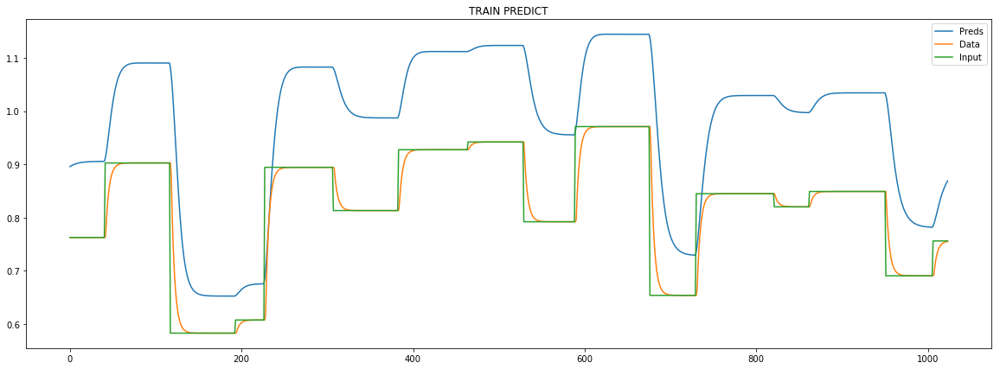

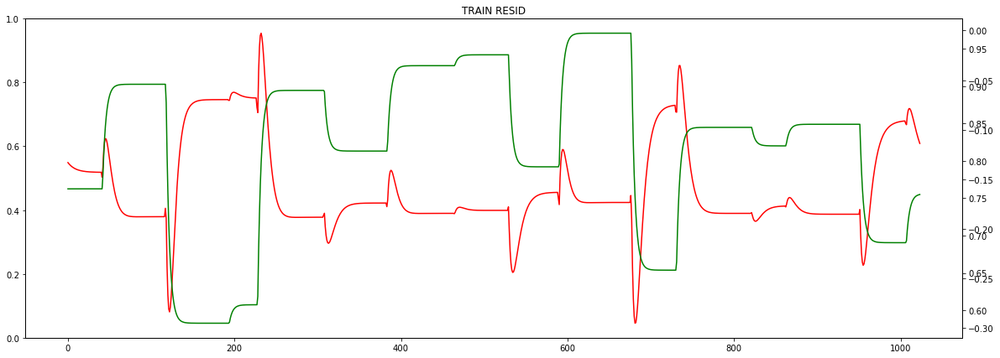

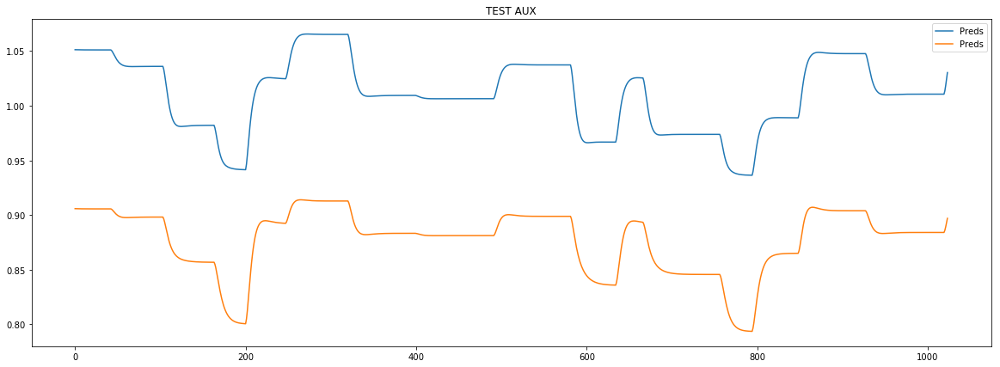

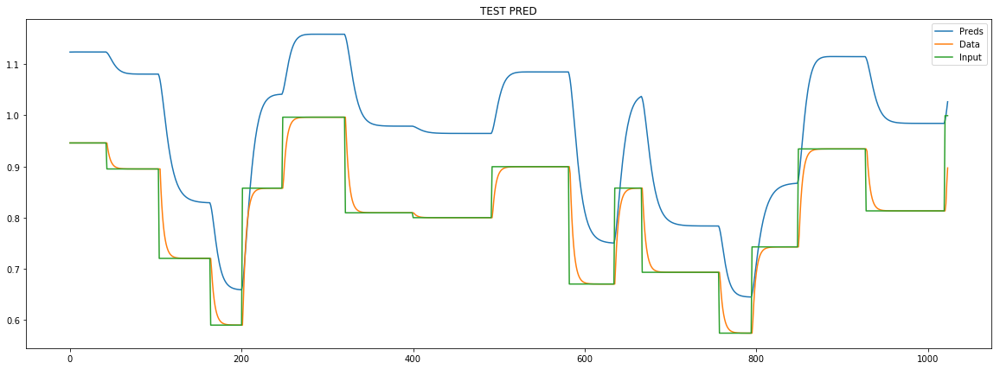

loss rate [0.15460305988814593]
Epoch [18] 
     train_loss[273.7583085390238] 
     eval_train[260.6986862673209] 
     eval_test[279.79666629162705]



aux preds: 0.9646466970443726 0.8685210943222046
main loss 0.0
aux loss 248.85173738919772
const loss 2.3853354385265937
combined loss 251.23707282772432 


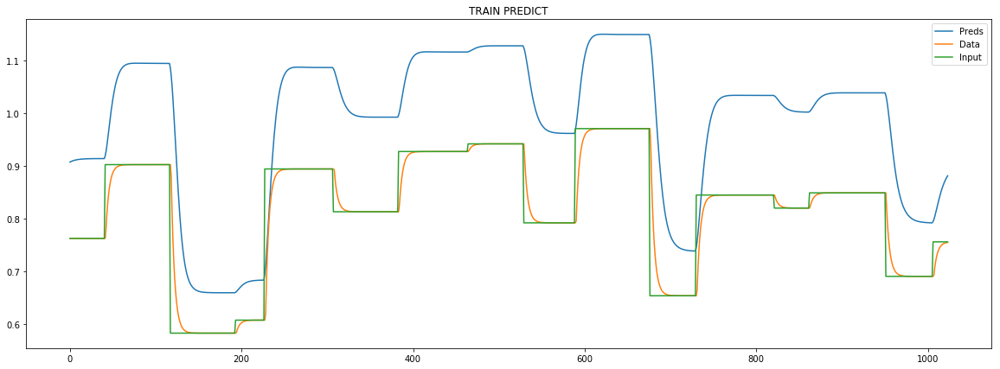

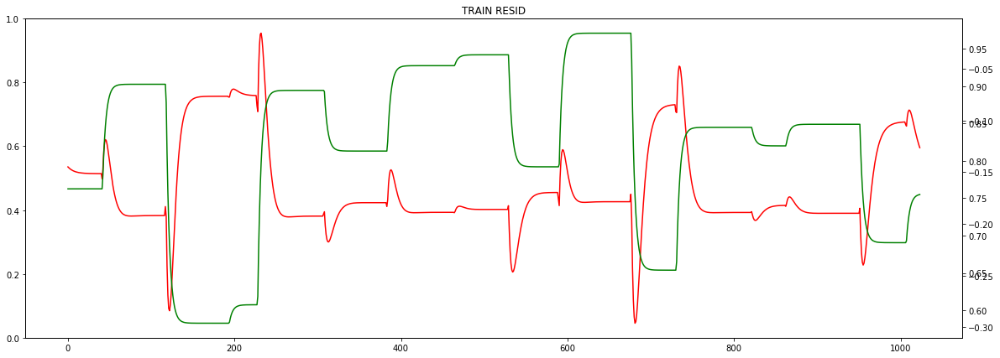

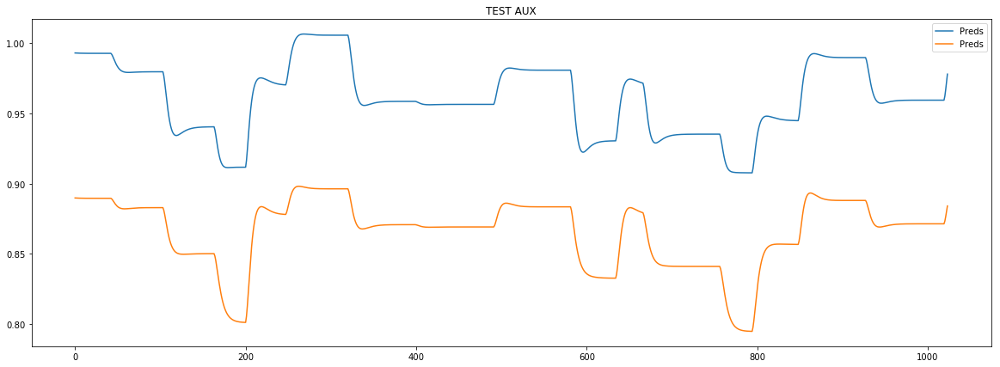

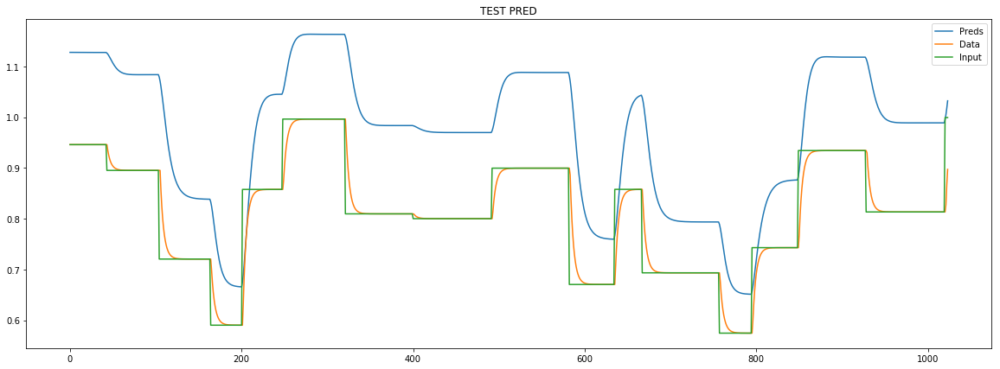

loss rate [0.16421204602518436]
Epoch [19] 
     train_loss[251.23707282772432] 
     eval_train[237.34976288676262] 
     eval_test[254.909410005266]



aux preds: 0.9090734720230103 0.8574573993682861
main loss 0.0
aux loss 227.10421958336462
const loss 1.5024574811641986
combined loss 228.6066770645288 


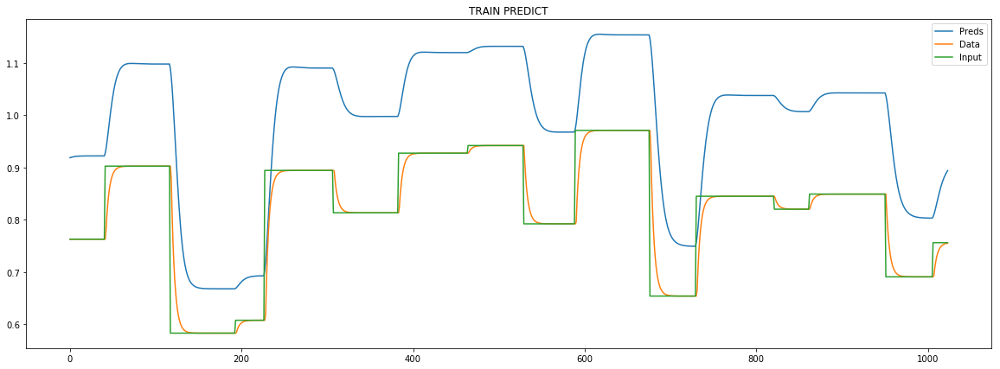

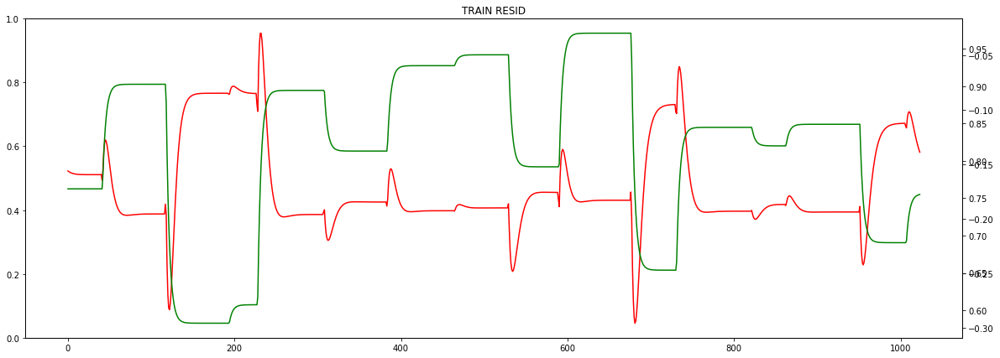

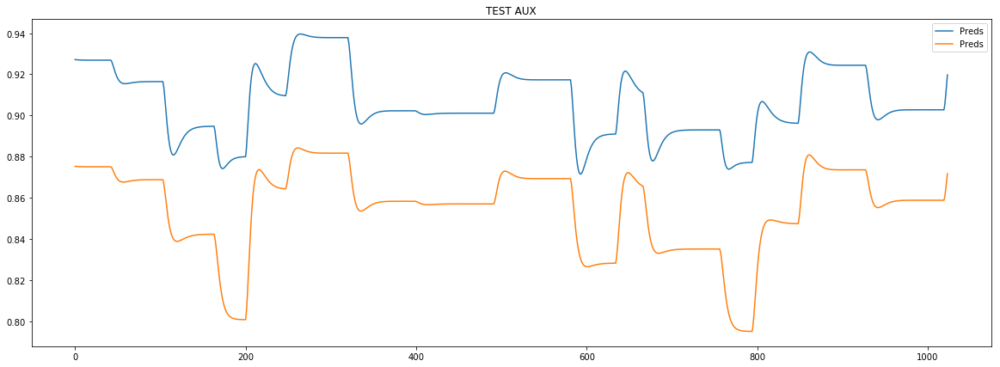

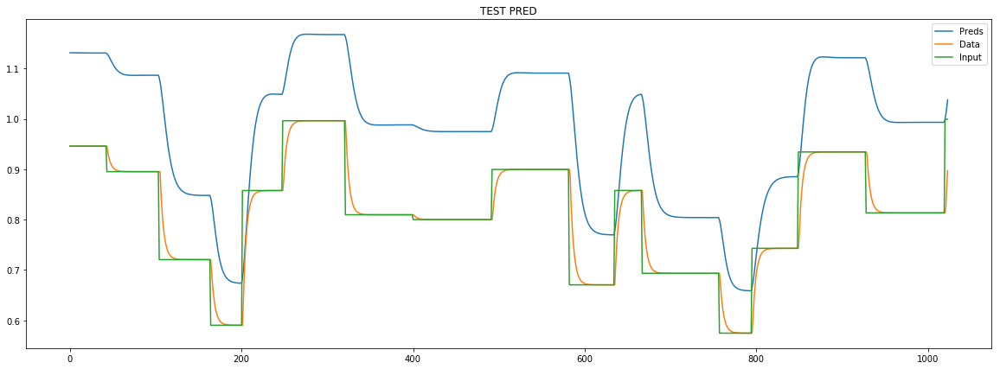

loss rate [0.18156830286186498]
Epoch [20] 
     train_loss[228.6066770645288] 
     eval_train[213.04150587263018] 
     eval_test[229.01001342589205]



aux preds: 0.8363540768623352 0.8458860516548157
main loss 0.0
aux loss 203.11412268418533
const loss 0.881167464531385
combined loss 203.99529014871672 


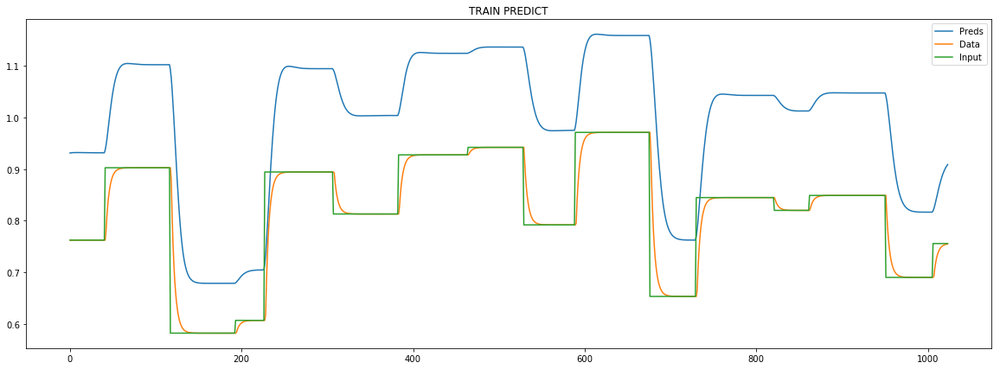

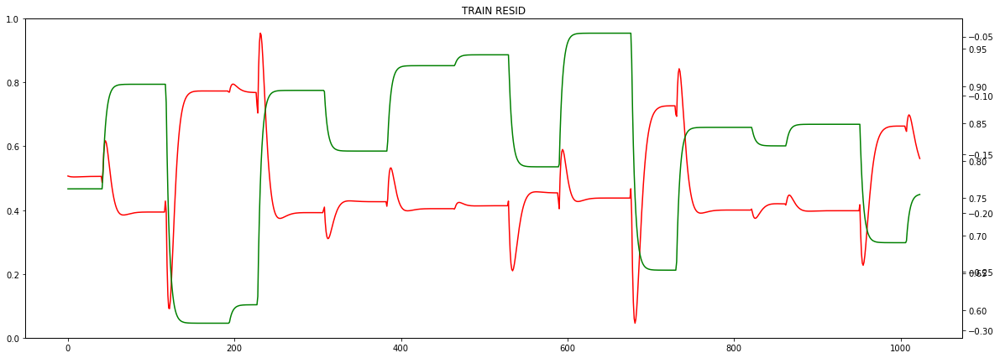

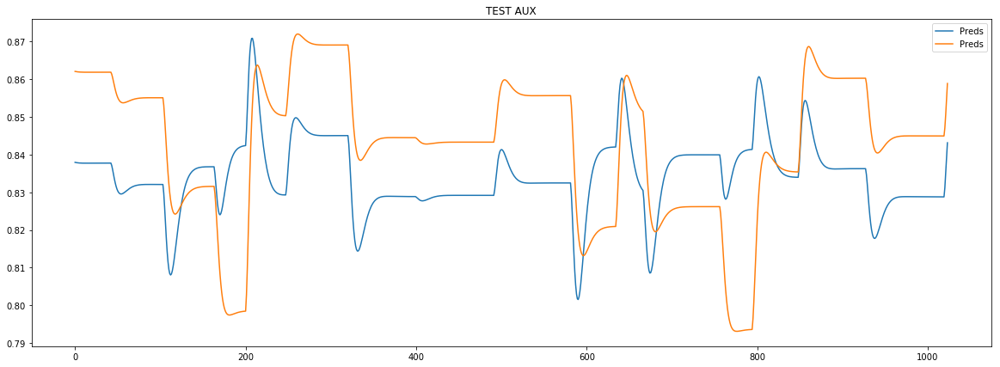

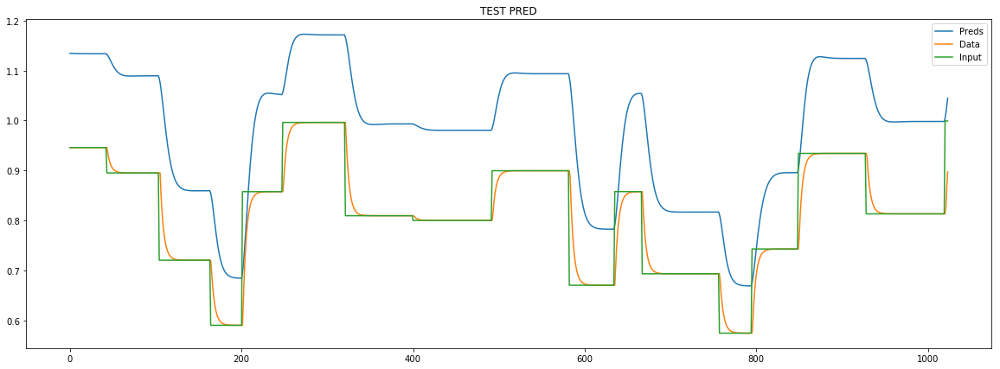

loss rate [0.21944297106244237]
Epoch [21] 
     train_loss[203.99529014871672] 
     eval_train[184.66580748328795] 
     eval_test[198.70798731527546]



aux preds: 0.7341787219047546 0.8307976722717285
main loss 0.0
aux loss 173.0690767581646
const loss 0.9549294618459848
combined loss 174.0240062200106 


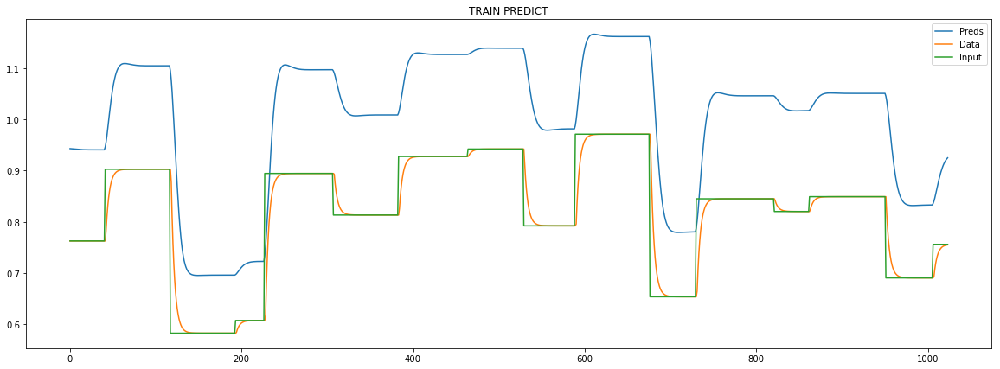

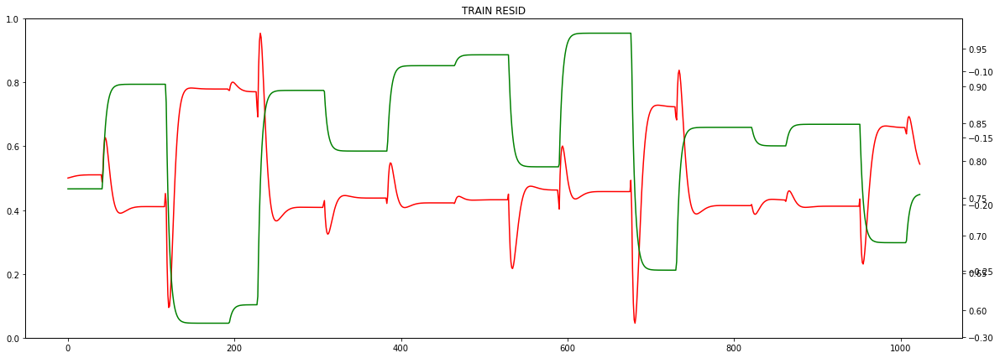

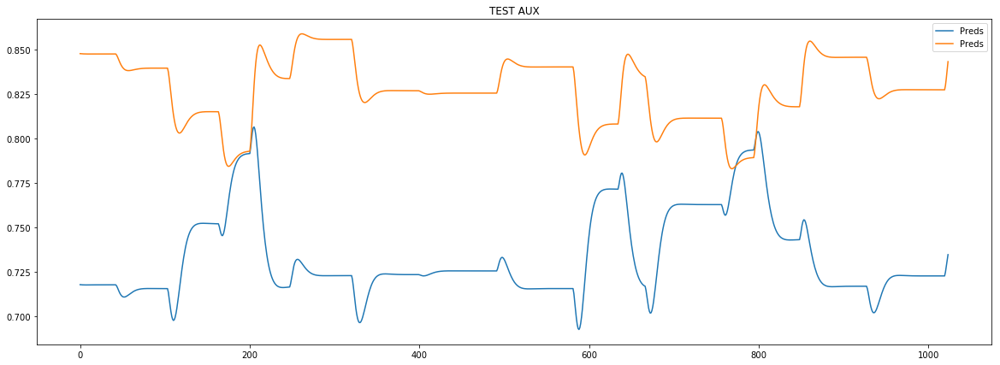

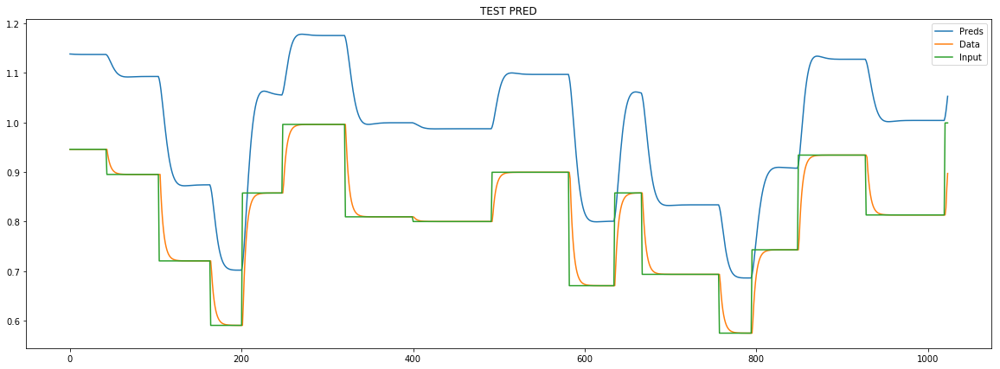

loss rate [0.2800389060431061]
Epoch [22] 
     train_loss[174.0240062200106] 
     eval_train[151.7335517360614] 
     eval_test[163.82172580198807]



aux preds: 0.6687525510787964 0.8239732980728149
main loss 0.0
aux loss 148.07152410653921
const loss 1.7422695687183967
combined loss 149.8137936752576 


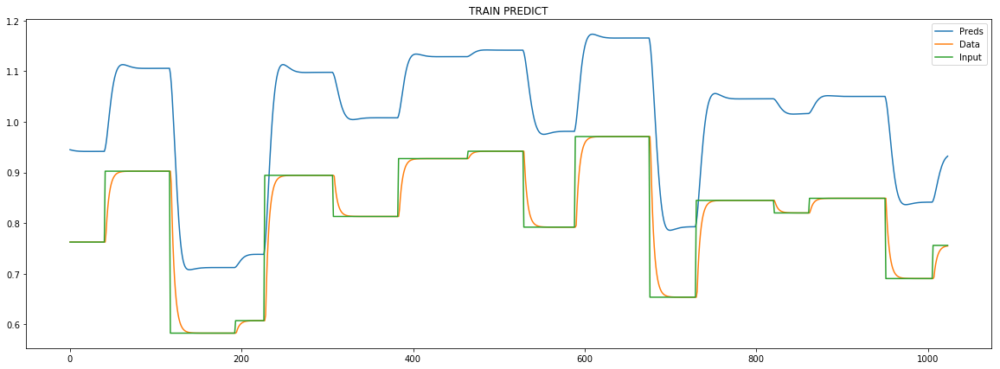

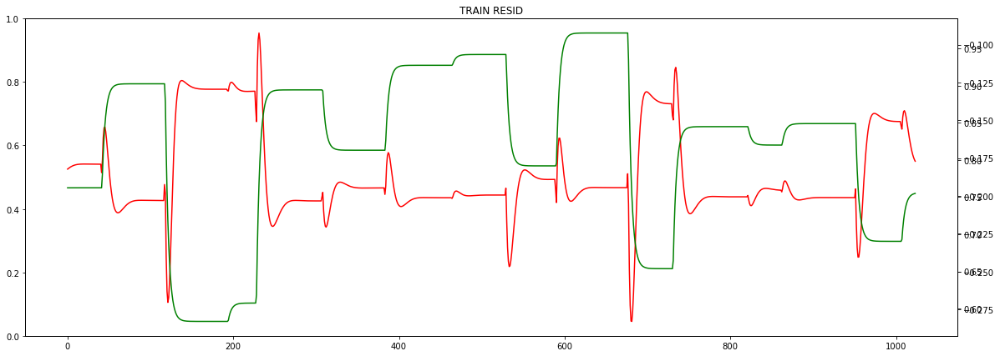

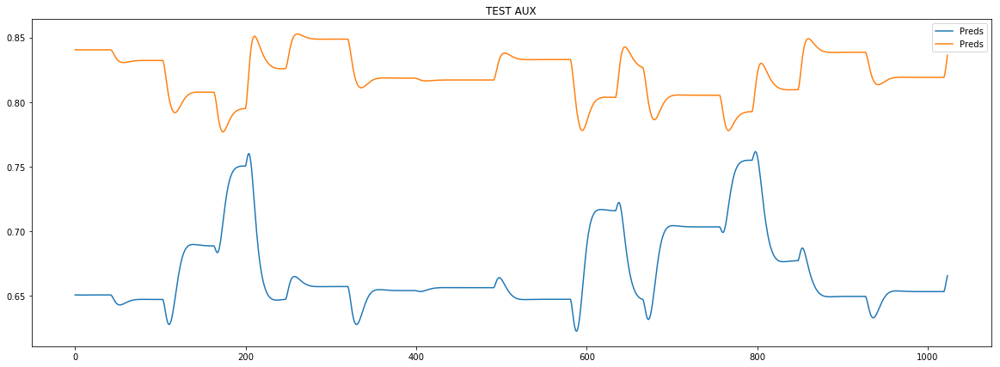

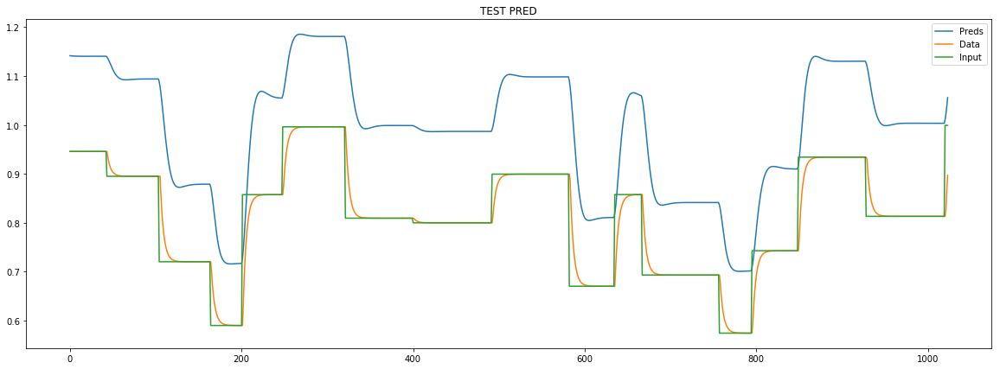

loss rate [0.2727004100027046]
Epoch [23] 
     train_loss[149.8137936752576] 
     eval_train[133.0341182213563] 
     eval_test[143.4088668606498]



aux preds: 0.638210117816925 0.8218796849250793
main loss 0.0
aux loss 134.4613841863779
const loss 2.1129604153908215
combined loss 136.57434460176873 


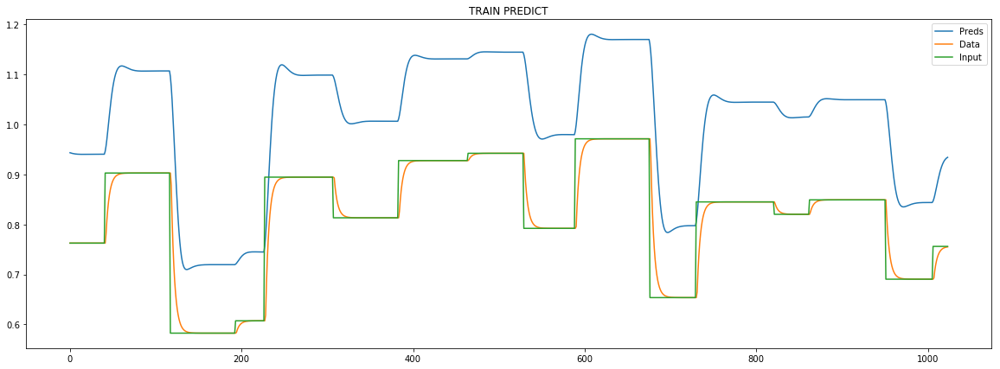

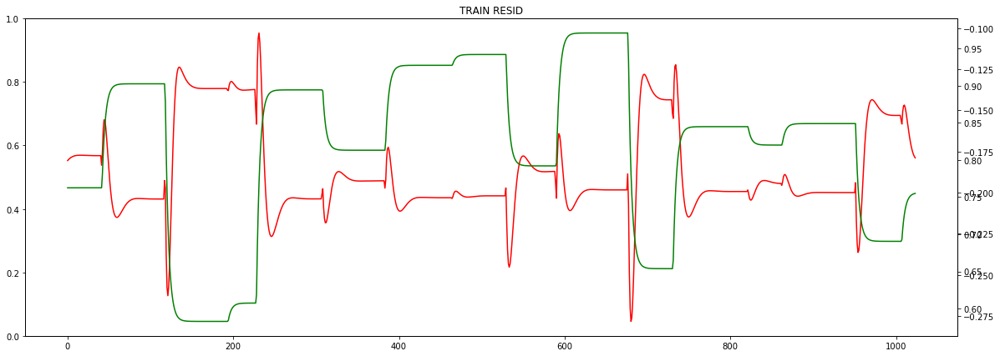

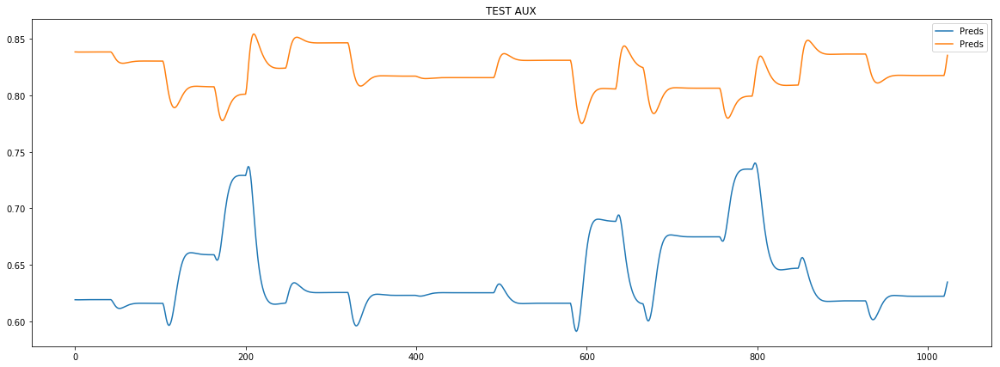

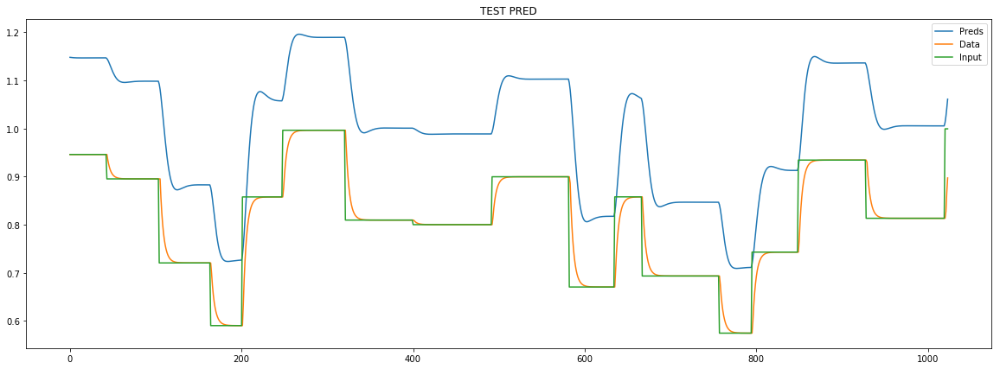

loss rate [0.21089691016179934]
Epoch [24] 
     train_loss[136.57434460176873] 
     eval_train[124.10559230584364] 
     eval_test[133.07923224297434]



aux preds: 0.6187487840652466 0.8201804161071777
main loss 0.0
aux loss 125.25999663426326
const loss 2.310712084174156
combined loss 127.57070871843742 


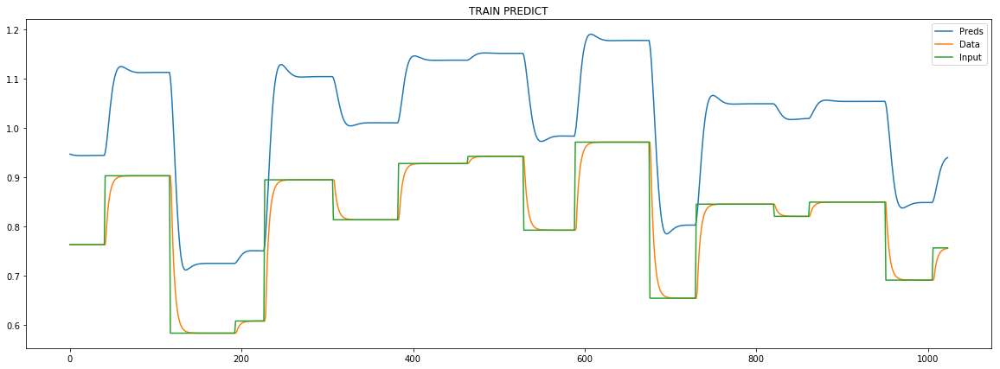

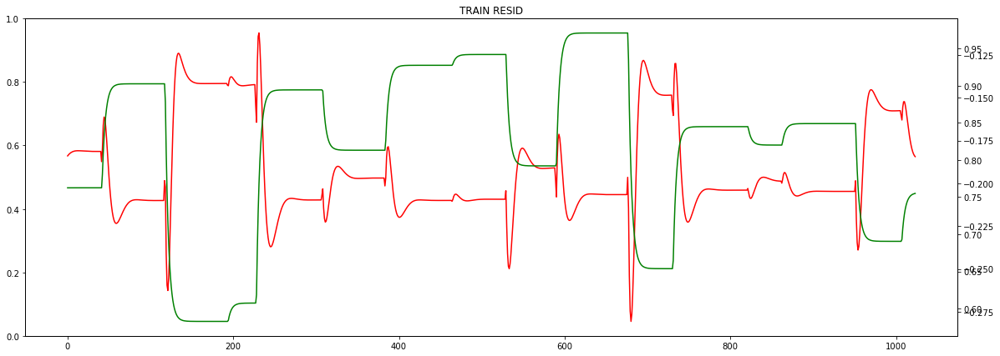

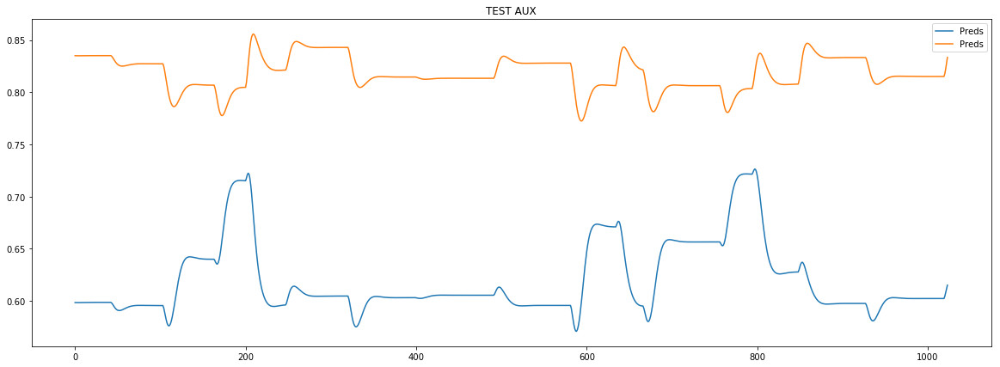

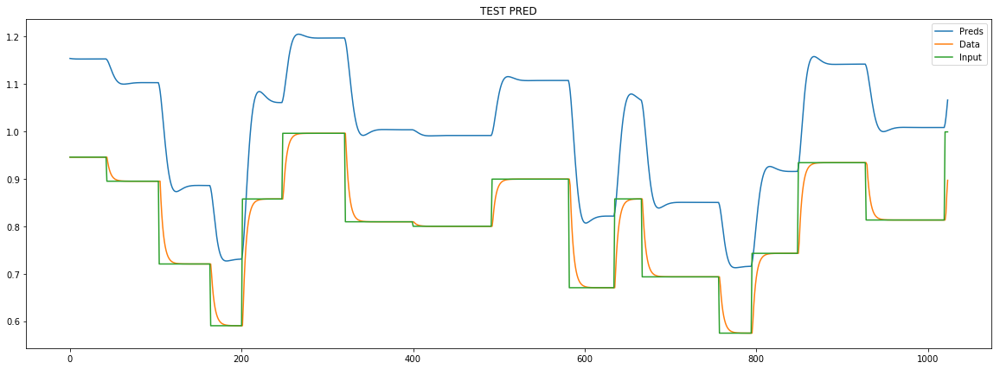

loss rate [0.12207877682202872]
Epoch [25] 
     train_loss[127.57070871843742] 
     eval_train[120.55633134337573] 
     eval_test[128.8524466861378]



aux preds: 0.6063530445098877 0.8185502290725708
main loss 0.0
aux loss 120.76746522463284
const loss 2.461446585563513
combined loss 123.22891181019635 


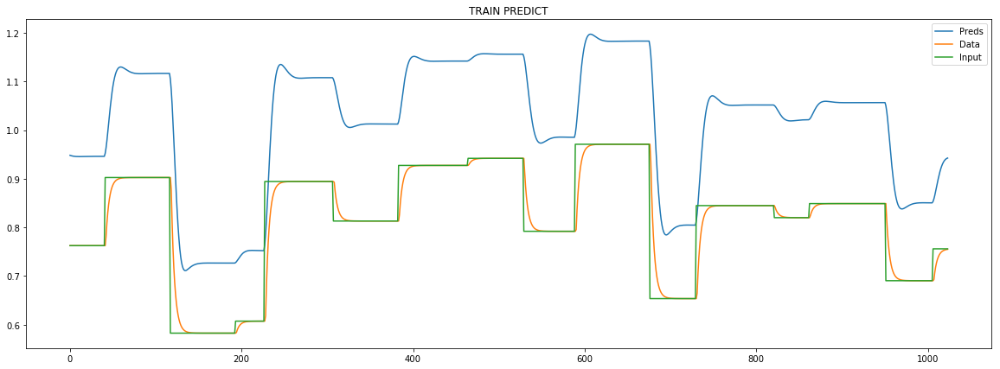

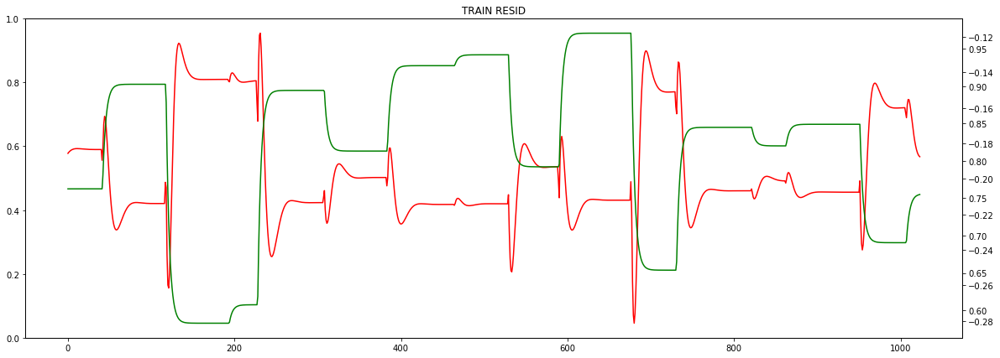

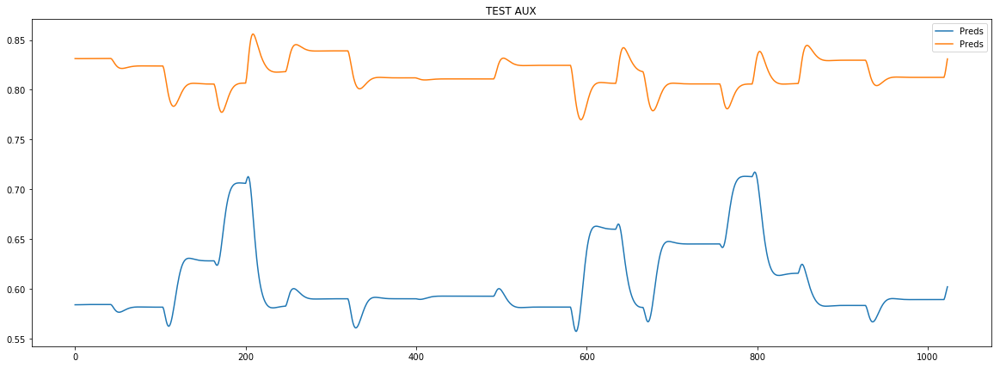

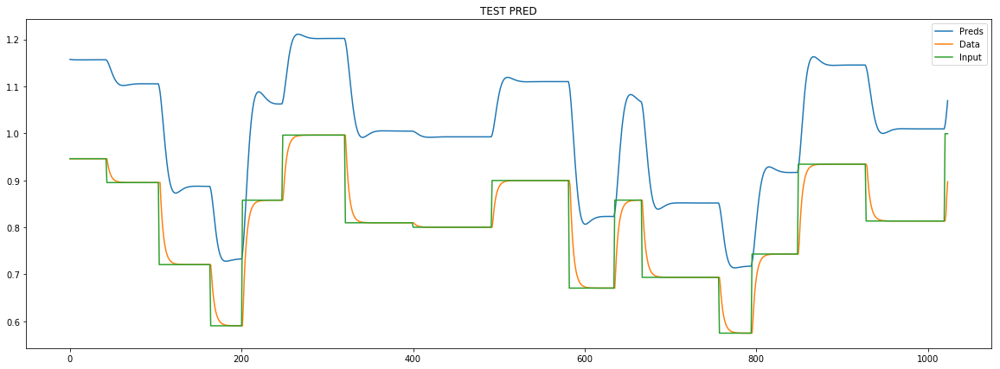

loss rate [0.06727424588344255]
Epoch [26] 
     train_loss[123.22891181019635] 
     eval_train[118.10285576146383] 
     eval_test[126.02385541525754]



aux preds: 0.5980839133262634 0.8174616098403931
main loss 0.0
aux loss 118.01657449282132
const loss 2.5584618793084073
combined loss 120.57503637212973 


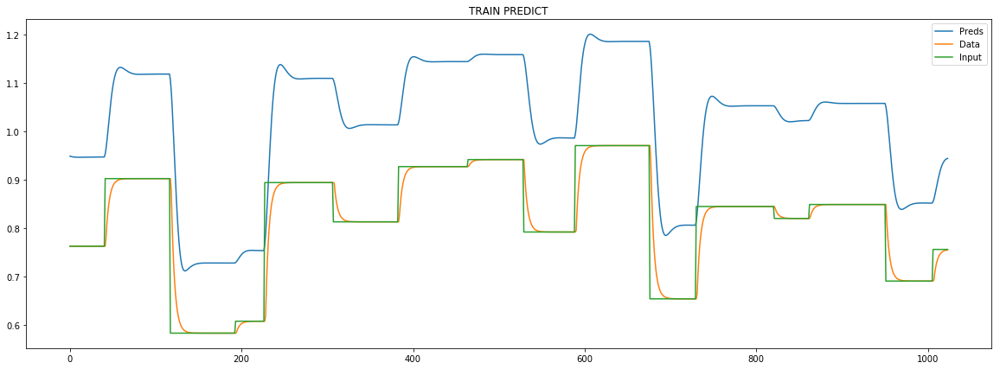

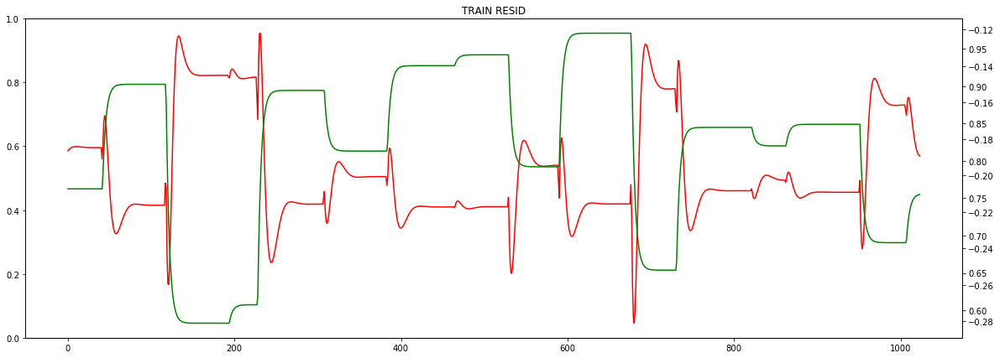

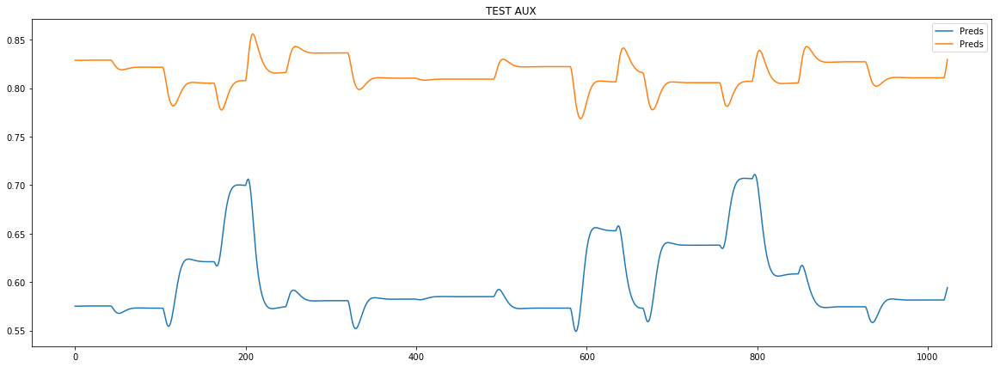

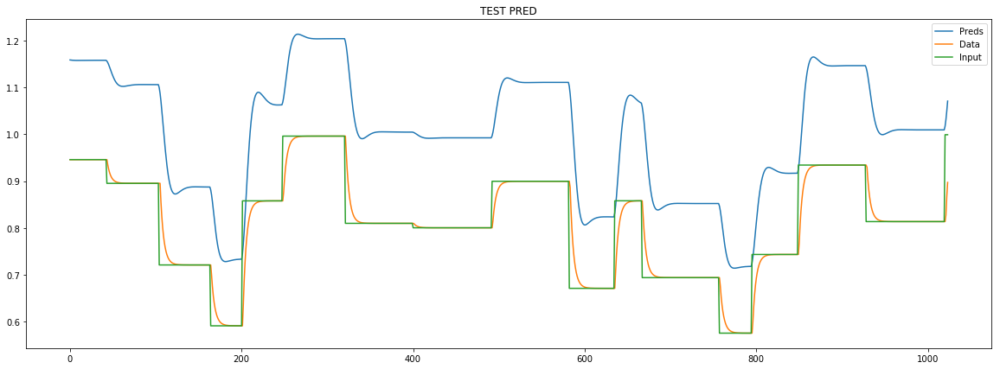

loss rate [0.042429282749031905]
Epoch [27] 
     train_loss[120.57503637212973] 
     eval_train[116.16583331043903] 
     eval_test[123.83161976120688]



aux preds: 0.5925782322883606 0.8168398141860962
main loss 0.0
aux loss 116.38013891073373
const loss 2.5984683220203104
combined loss 118.97860723275404 


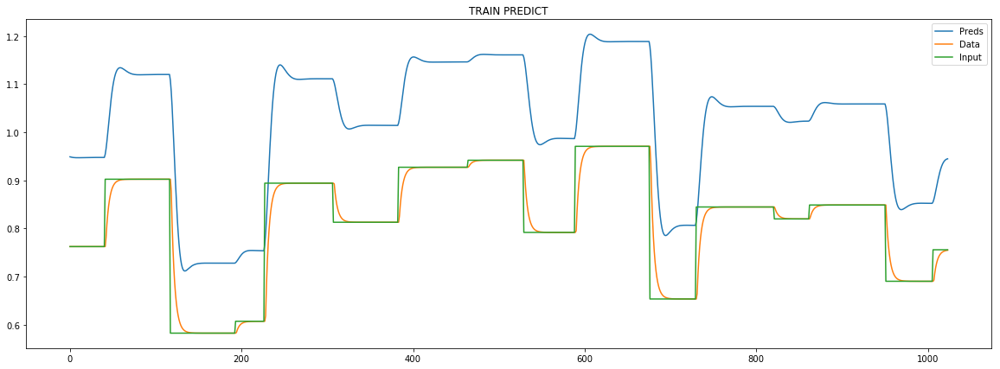

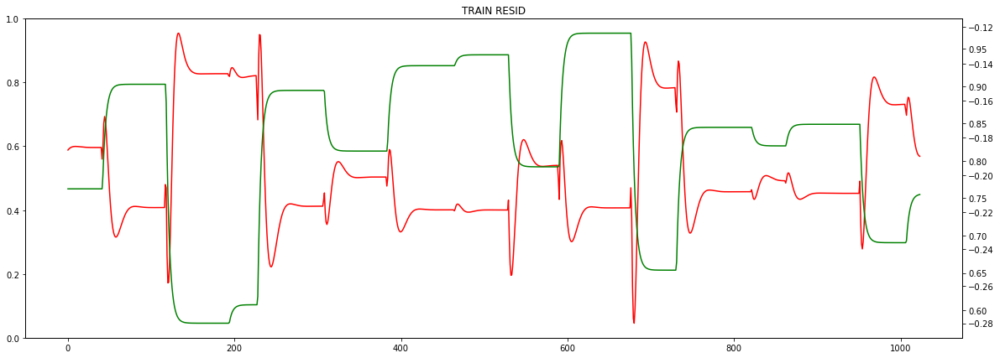

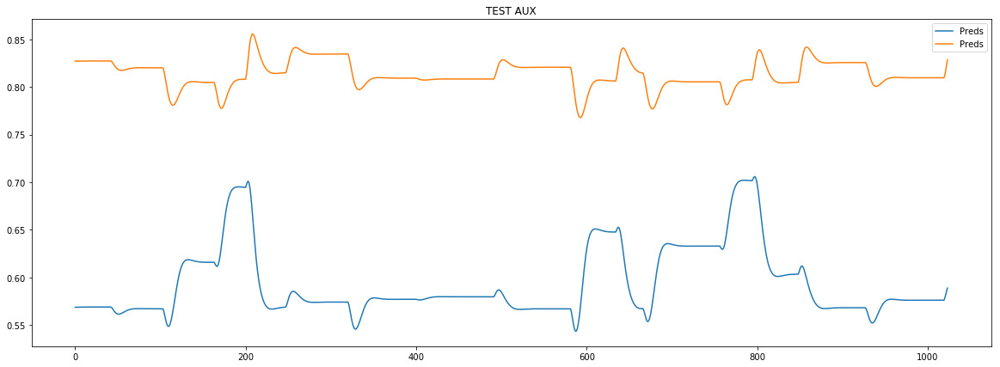

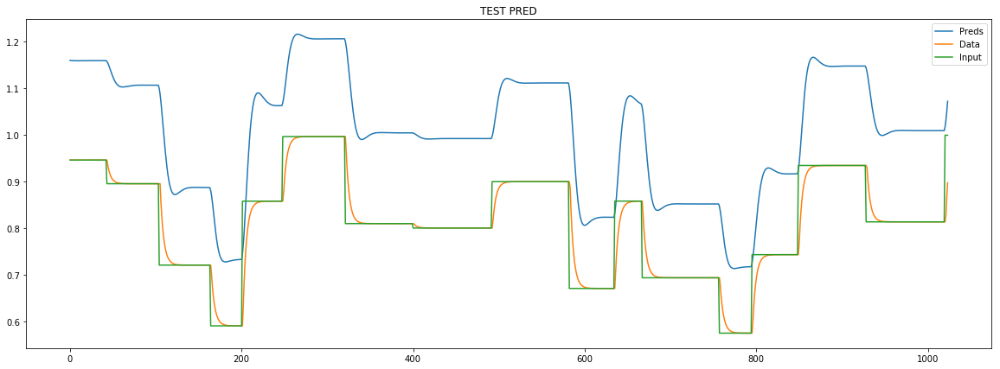

loss rate [0.03324025728118807]
Epoch [28] 
     train_loss[118.97860723275404] 
     eval_train[114.57382993400097] 
     eval_test[122.03985770182176]



aux preds: 0.5888263583183289 0.8164675831794739
main loss 0.0
aux loss 115.30071764725905
const loss 2.5944744039040346
combined loss 117.89519205116308 


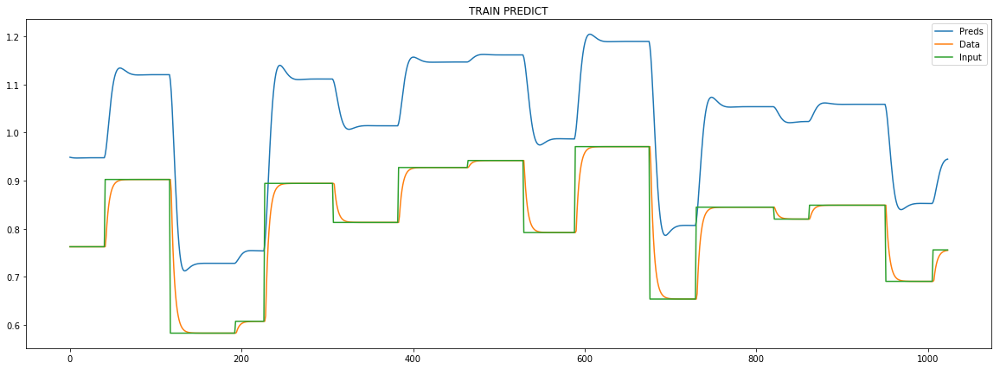

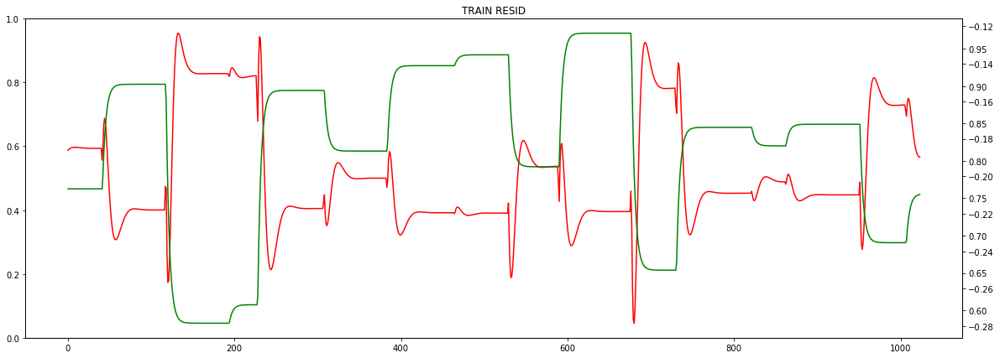

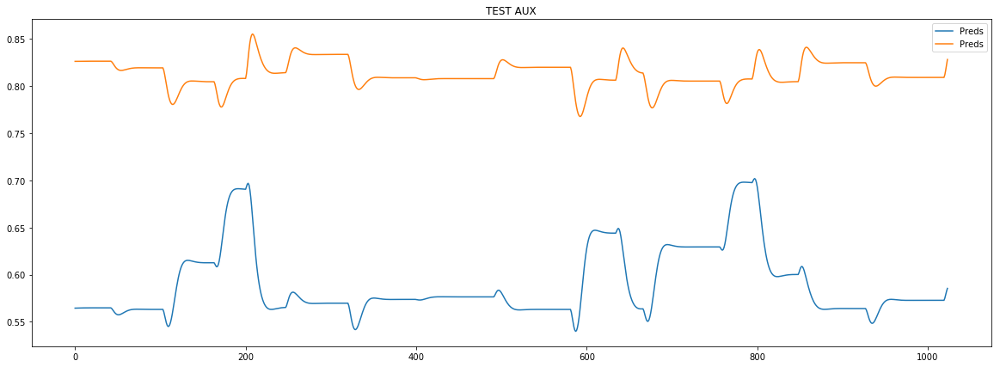

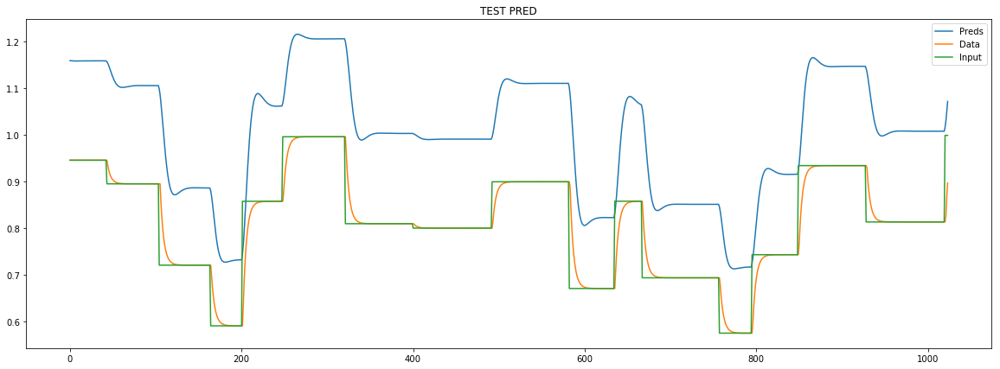

loss rate [0.027037410900424663]
Epoch [29] 
     train_loss[117.89519205116308] 
     eval_train[113.31063137490015] 
     eval_test[120.61341531710191]



aux preds: 0.5861565470695496 0.8161906003952026
main loss 0.0
aux loss 114.4661833689763
const loss 2.5629387440589757
combined loss 117.02912211303529 


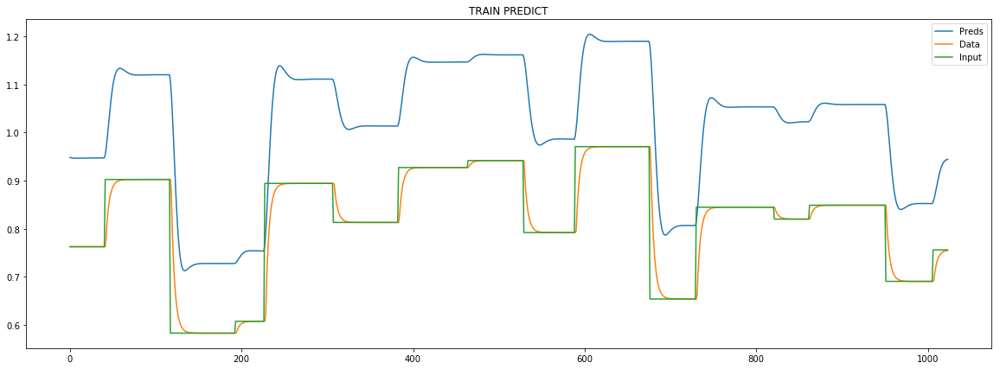

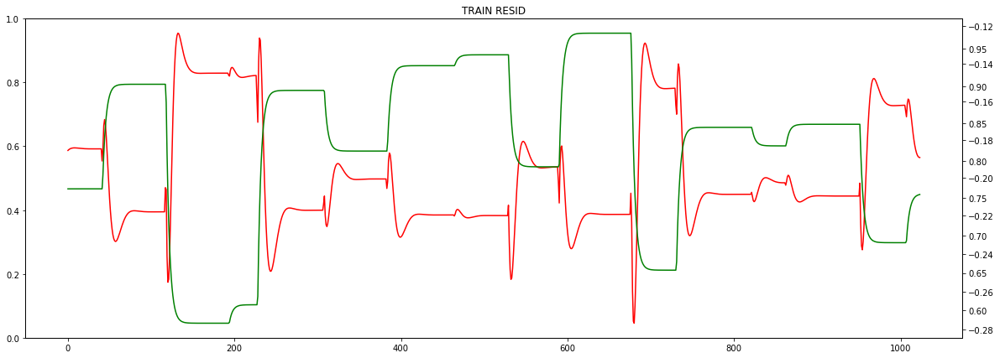

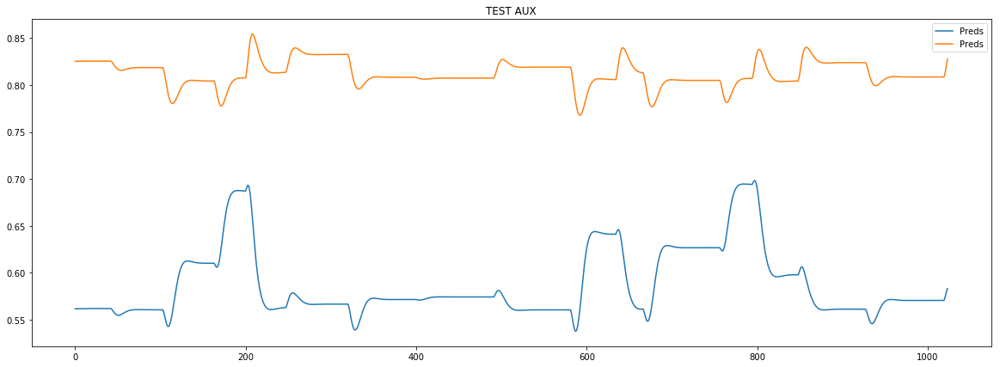

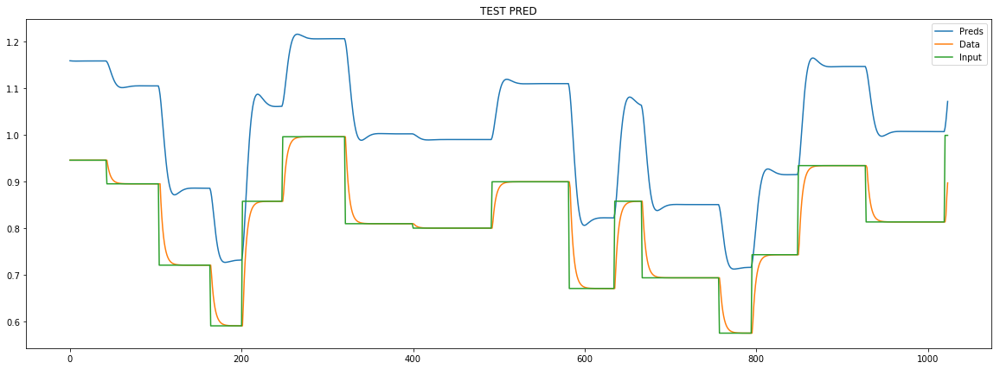

loss rate [0.02174582947667303]
Epoch [30] 
     train_loss[117.02912211303529] 
     eval_train[112.33765887984863] 
     eval_test[119.50512493198568]



aux preds: 0.5841414928436279 0.8158960938453674
main loss 0.0
aux loss 113.72829099801871
const loss 2.516696375149947
combined loss 116.24498737316866 


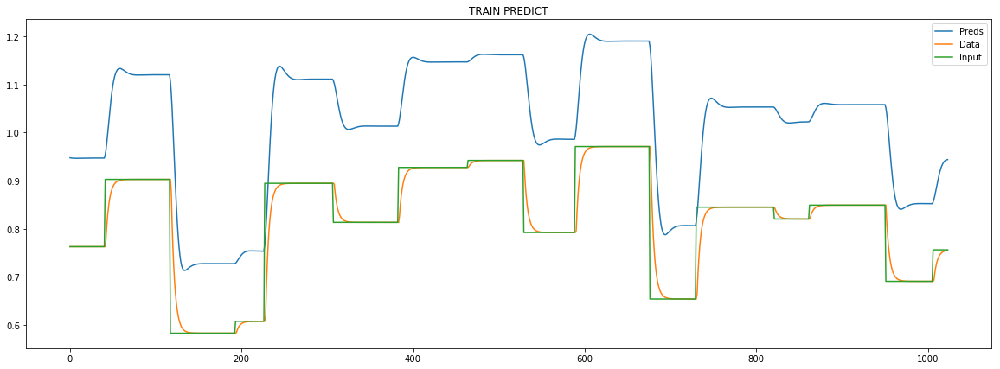

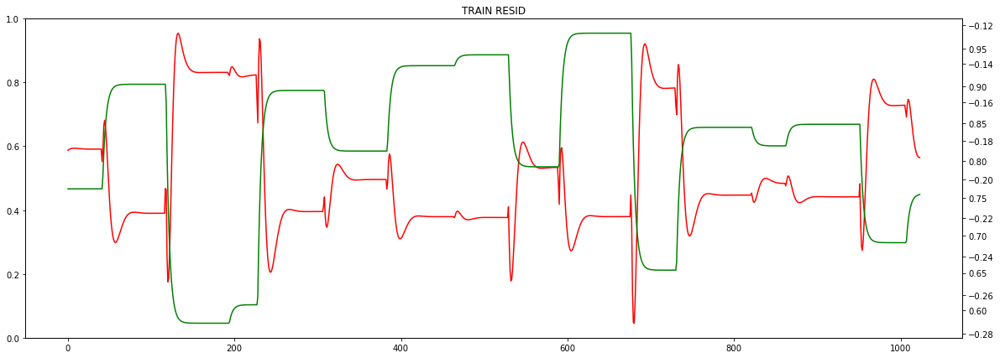

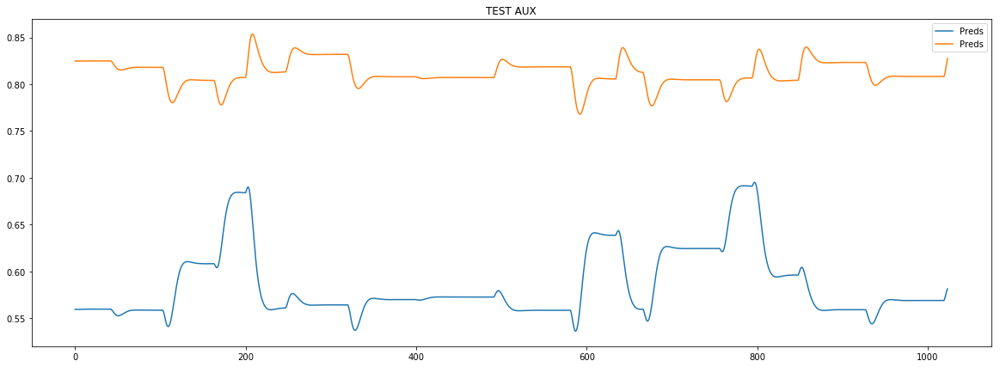

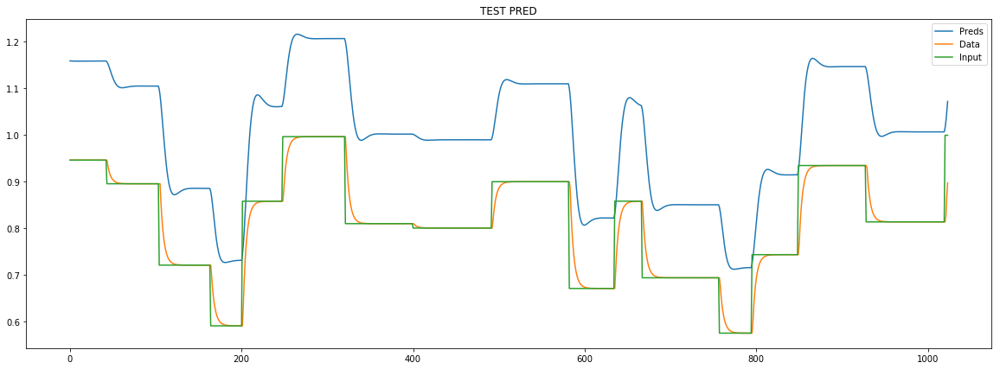

loss rate [0.017129642710169035]
Epoch [31] 
     train_loss[116.24498737316866] 
     eval_train[111.59803014191297] 
     eval_test[118.65158466317436]



aux preds: 0.5825302600860596 0.8155250549316406
main loss 0.0
aux loss 113.0187177658081
const loss 2.463486751684776
combined loss 115.48220451749287 


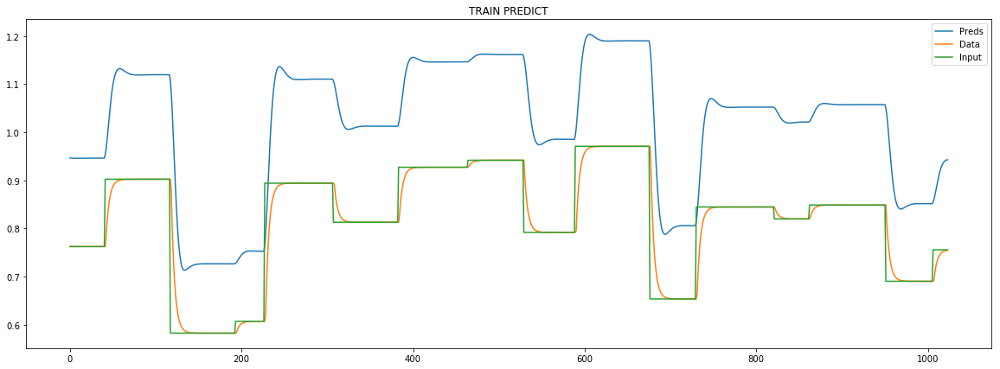

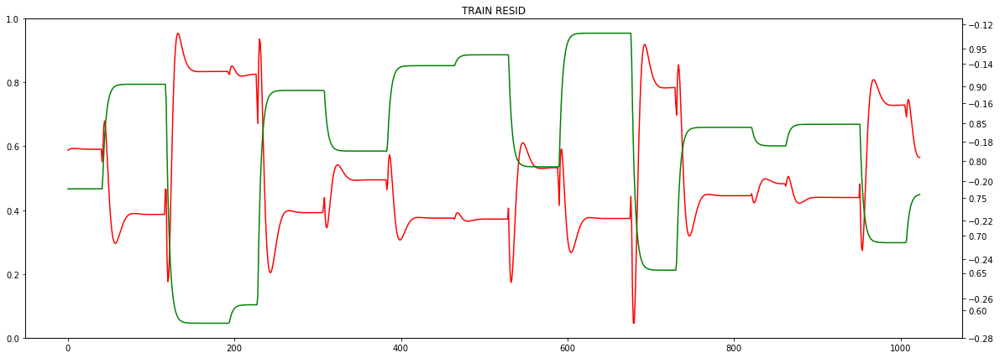

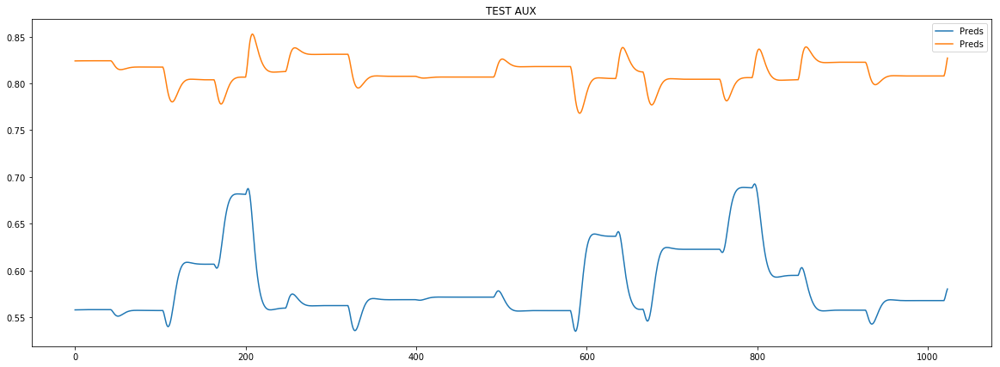

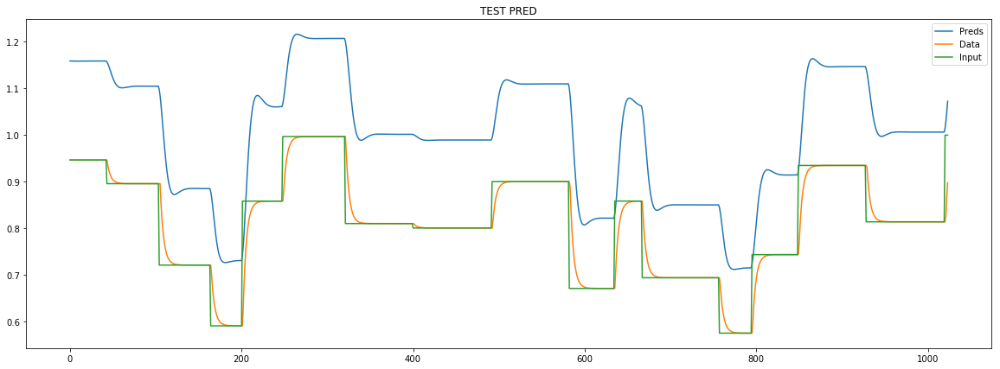

loss rate [0.01324391479194198]
Epoch [32] 
     train_loss[115.48220451749287] 
     eval_train[111.05022792059643] 
     eval_test[118.00620131600986]



aux preds: 0.5811771154403687 0.8150388598442078
main loss 0.0
aux loss 112.30685204726
const loss 2.407557731637588
combined loss 114.71440977889758 


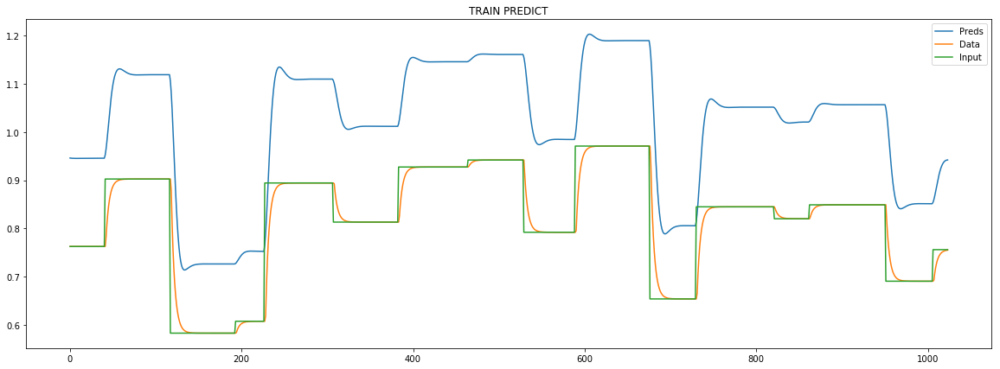

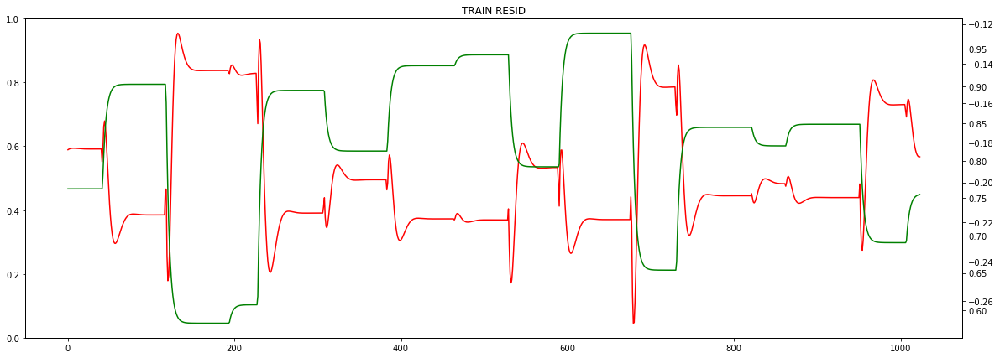

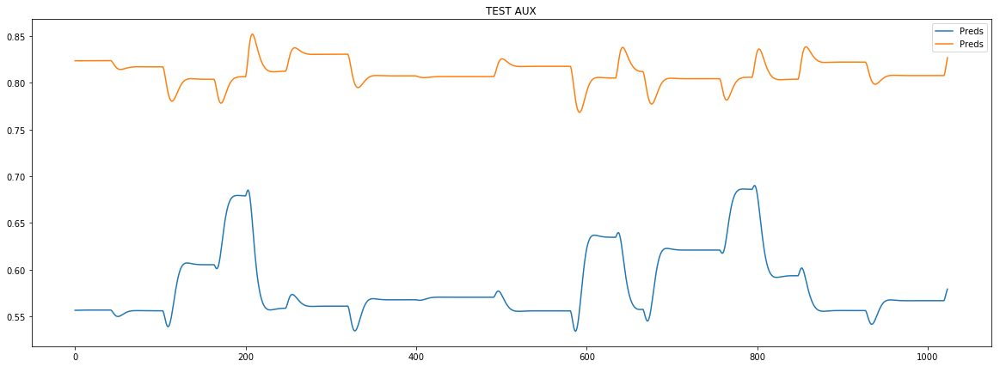

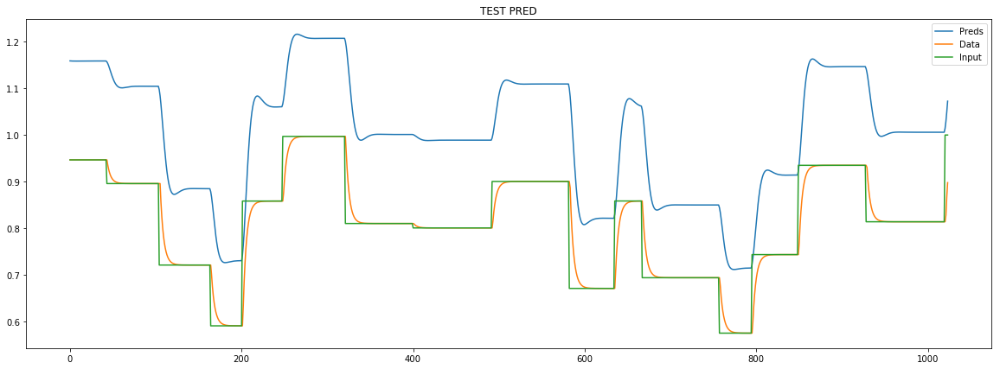

loss rate [0.009953846202516048]
Epoch [33] 
     train_loss[114.71440977889758] 
     eval_train[110.66791857205905] 
     eval_test[117.53924002430655]



aux preds: 0.5799911022186279 0.8144205808639526
main loss 0.0
aux loss 111.57209036900447
const loss 2.3511270639988093
combined loss 113.92321743300327 


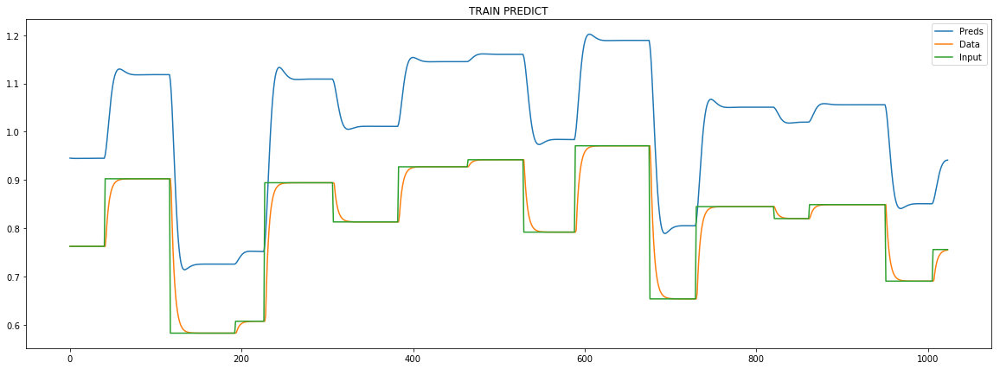

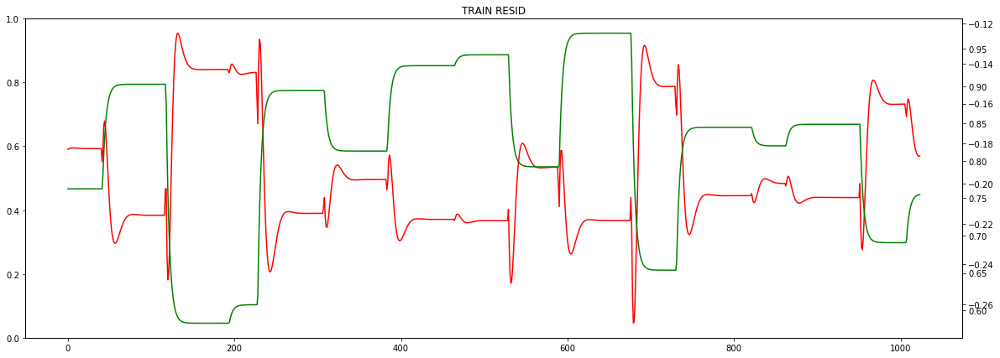

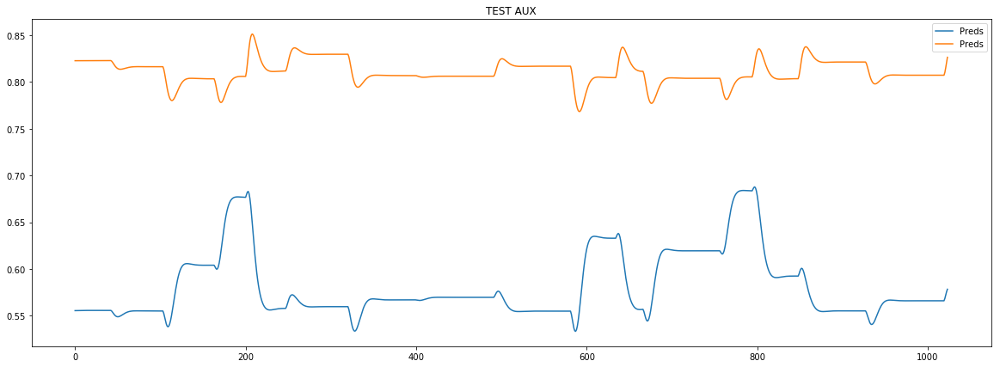

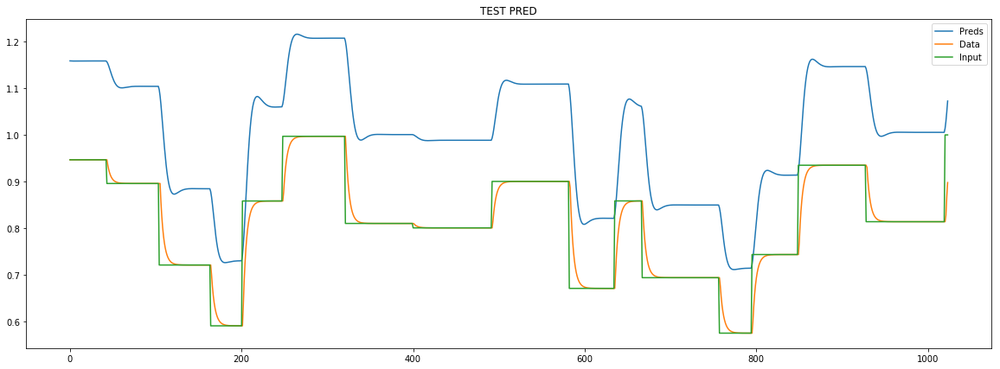

loss rate [0.007165970942888178]
Epoch [34] 
     train_loss[113.92321743300327] 
     eval_train[110.4202185261708] 
     eval_test[117.21962013569744]



aux preds: 0.5789321064949036 0.813666820526123
main loss 0.0
aux loss 110.81754699120155
const loss 2.295683264732361
combined loss 113.11323025593391 


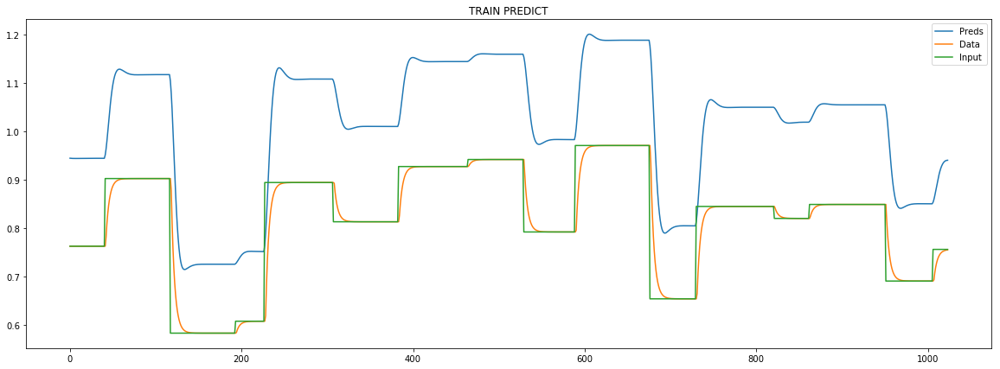

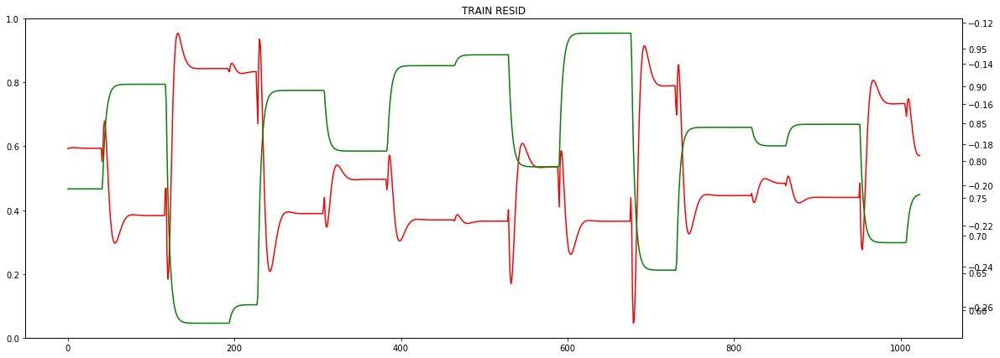

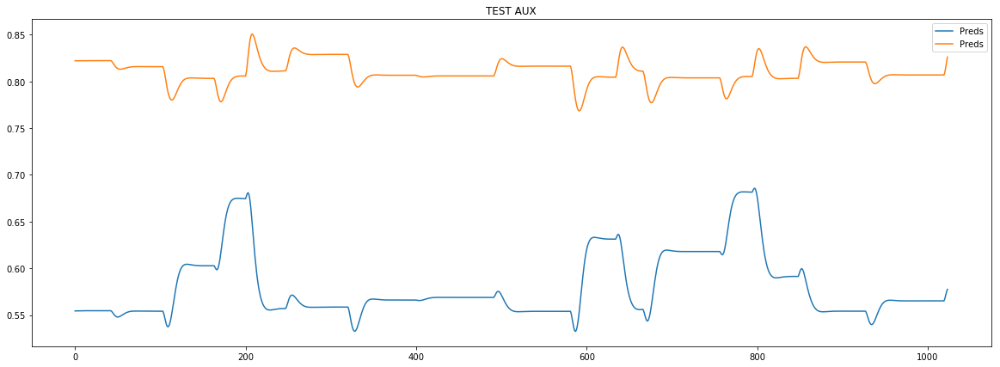

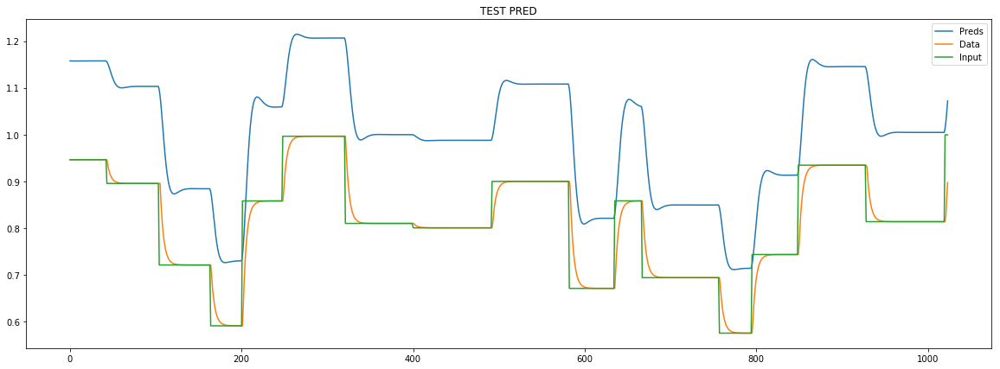

loss rate [0.0050064616210583335]
Epoch [35] 
     train_loss[113.11323025593391] 
     eval_train[110.25907882704185] 
     eval_test[116.99965224482797]



aux preds: 0.5779873728752136 0.8128084540367126
main loss 0.0
aux loss 110.05990717961238
const loss 2.2422151290453396
combined loss 112.30212230865772 


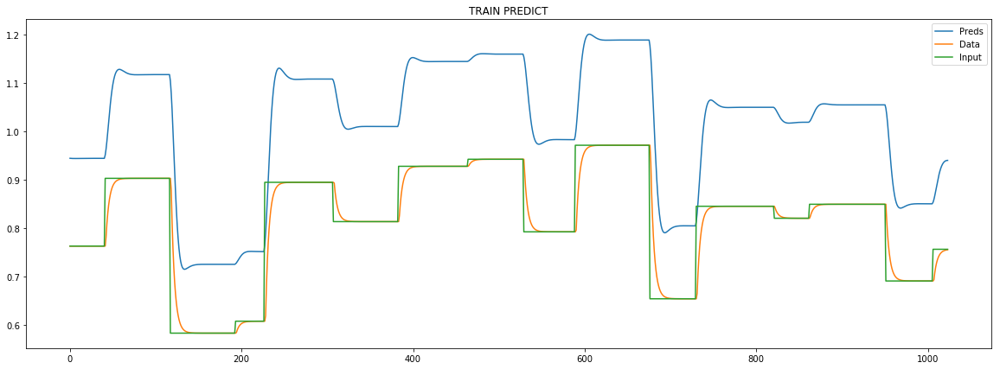

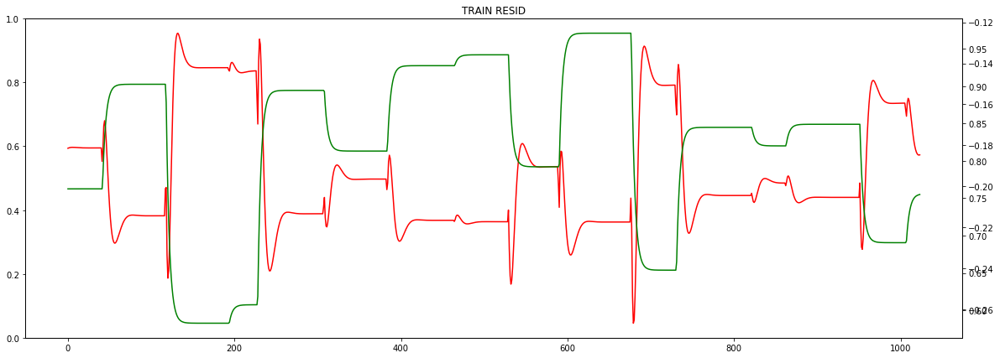

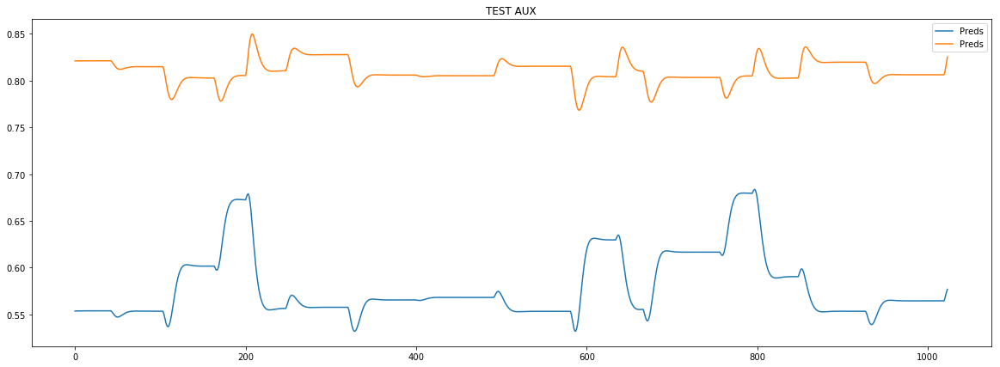

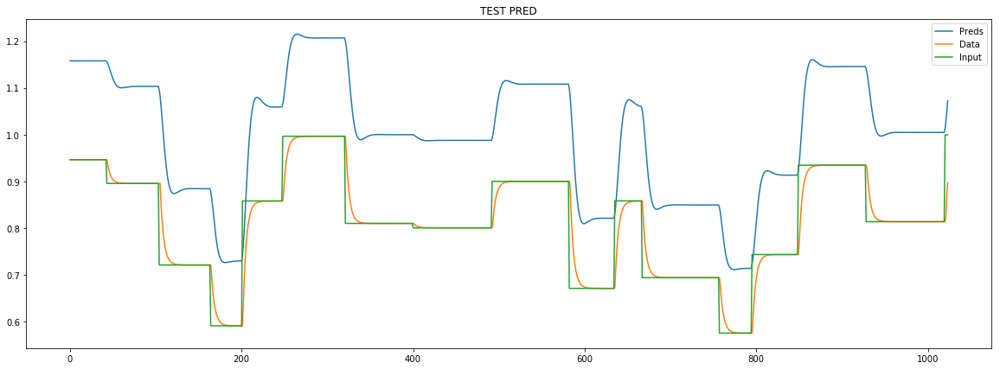

loss rate [0.003761104128186532]
Epoch [36] 
     train_loss[112.30212230865772] 
     eval_train[110.11702836362215] 
     eval_test[116.8118373372338]



aux preds: 0.5771646499633789 0.8118851780891418
main loss 0.0
aux loss 109.32490282792311
const loss 2.19131389604165
combined loss 111.51621672396476 


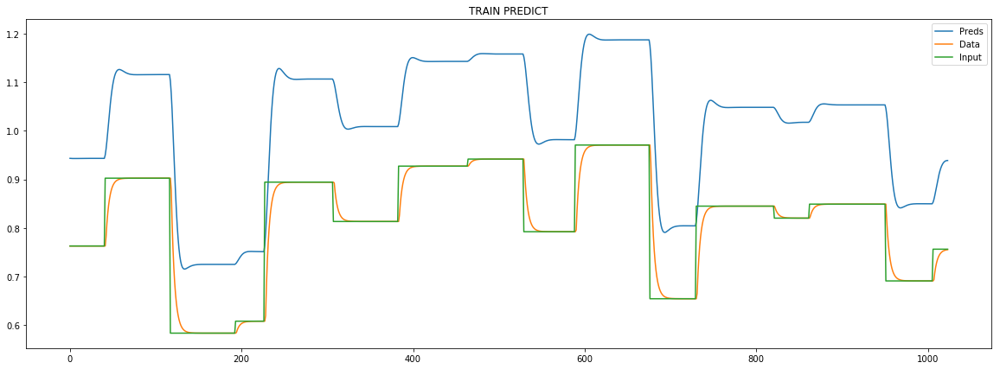

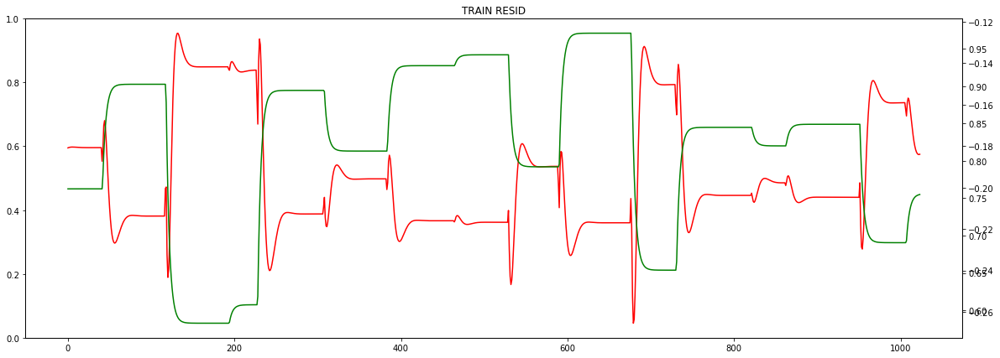

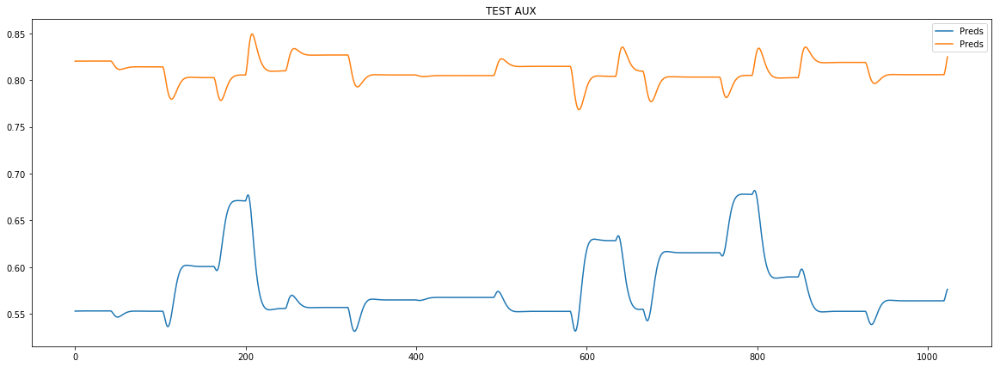

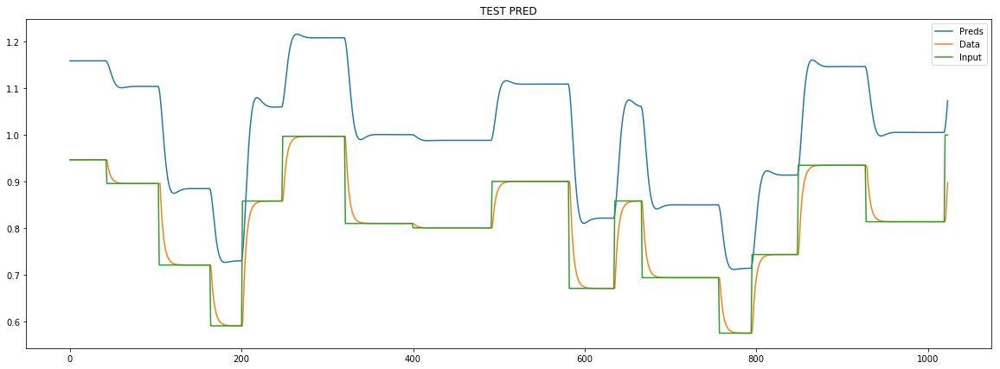

loss rate [0.0036091395395611015]
Epoch [37] 
     train_loss[111.51621672396476] 
     eval_train[109.92699283590684] 
     eval_test[116.5880631533536]



aux preds: 0.5764759182929993 0.8109326362609863
main loss 0.0
aux loss 108.64613349621112
const loss 2.143066489925751
combined loss 110.78919998613688 


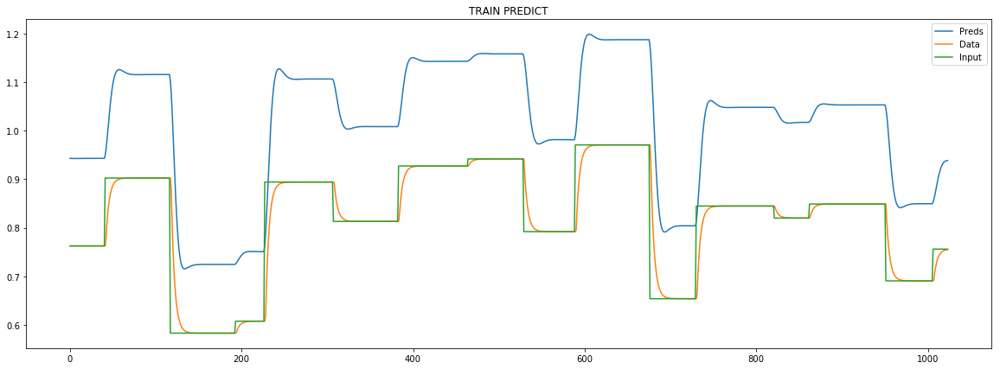

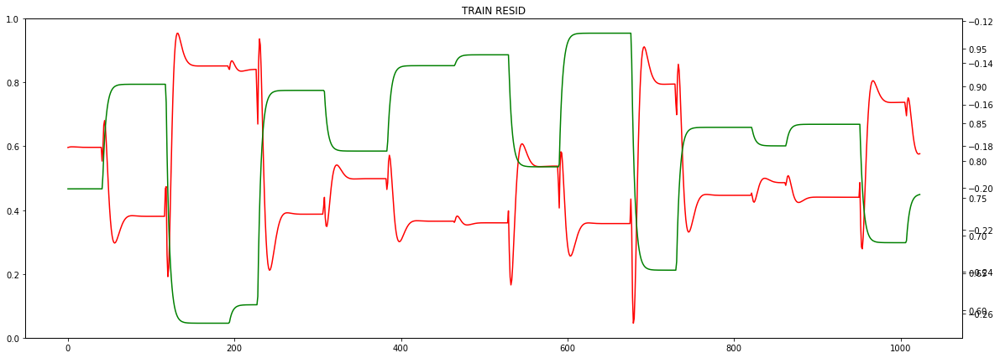

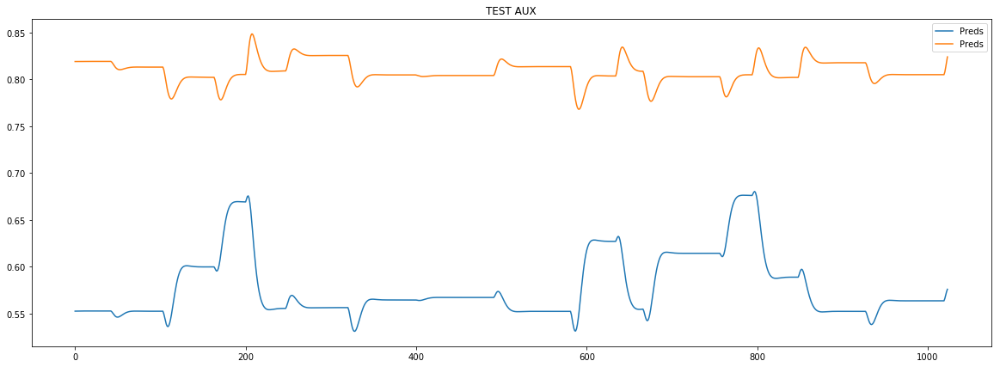

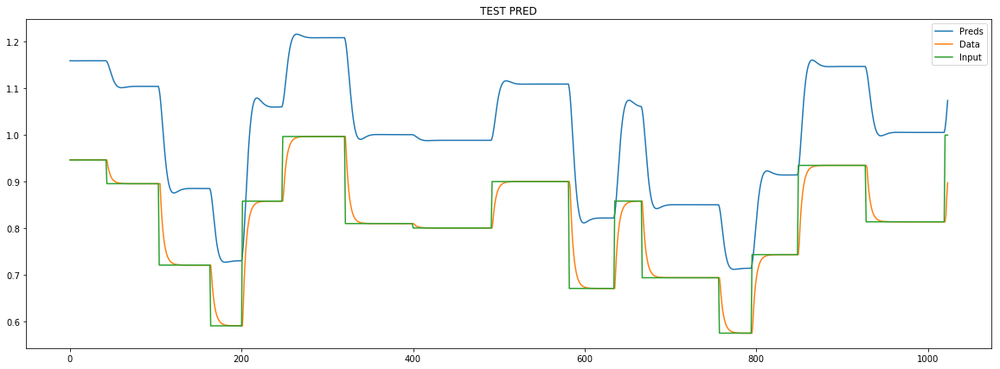

loss rate [0.004268450108542043]
Epoch [38] 
     train_loss[110.78919998613688] 
     eval_train[109.66481977701187] 
     eval_test[116.30129657550292]



aux preds: 0.5759252905845642 0.8099801540374756
main loss 0.0
aux loss 108.0364288183359
const loss 2.0969109730078626
combined loss 110.13333979134377 


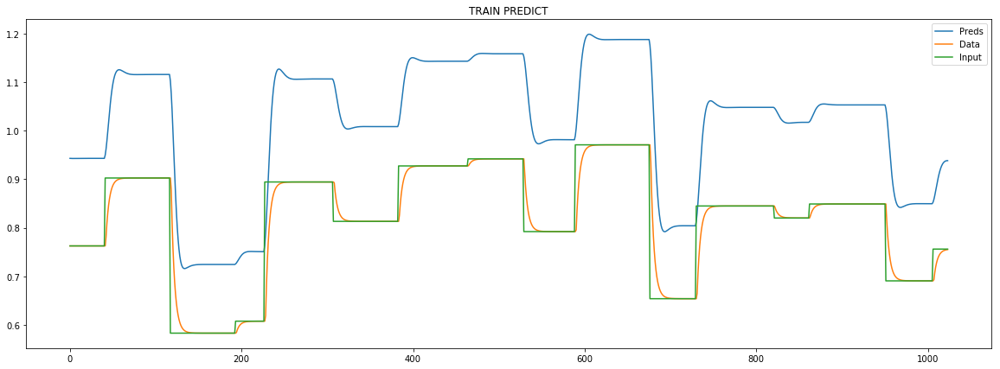

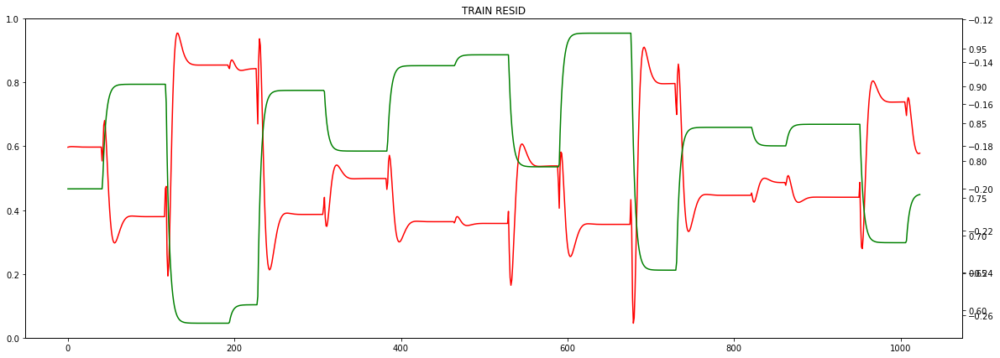

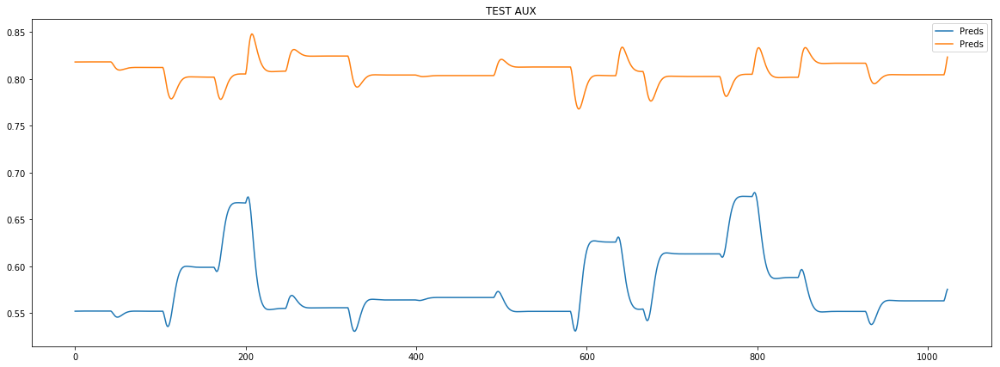

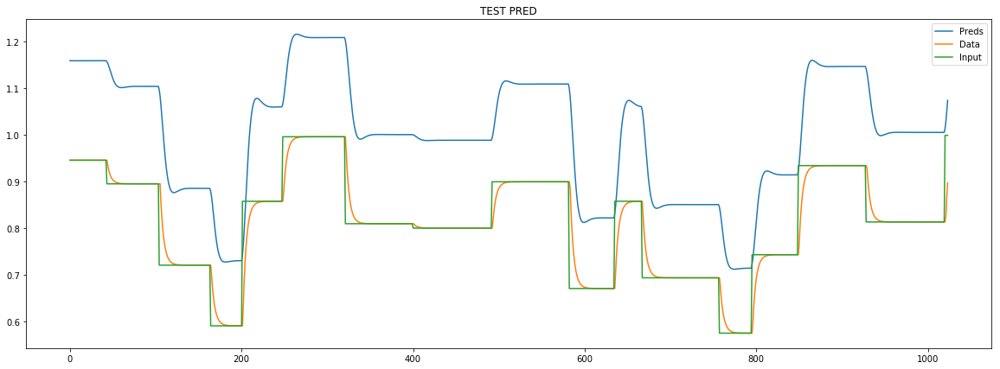

loss rate [0.00536845751641013]
Epoch [39] 
     train_loss[110.13333979134377] 
     eval_train[109.32366182024663] 
     eval_test[115.94128034873442]



aux preds: 0.5755115747451782 0.8090577125549316
main loss 0.0
aux loss 107.5031188084529
const loss 2.0519629613711285
combined loss 109.55508176982403 


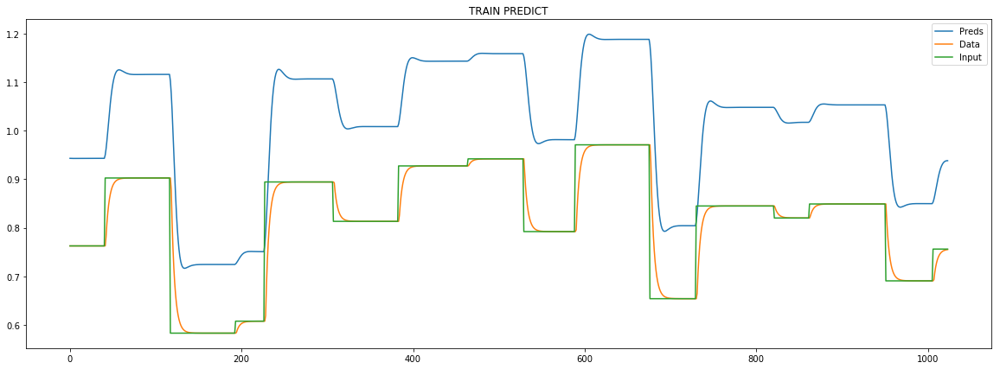

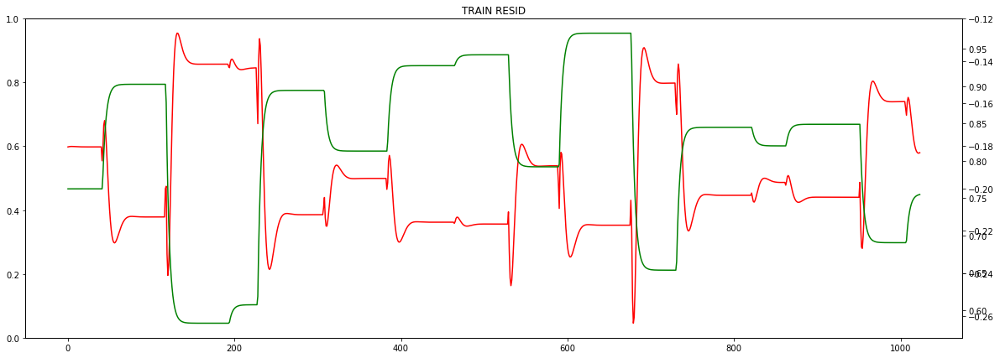

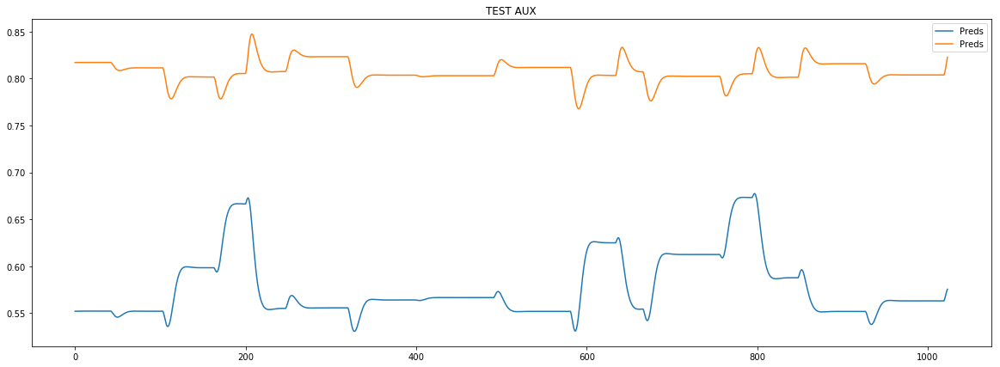

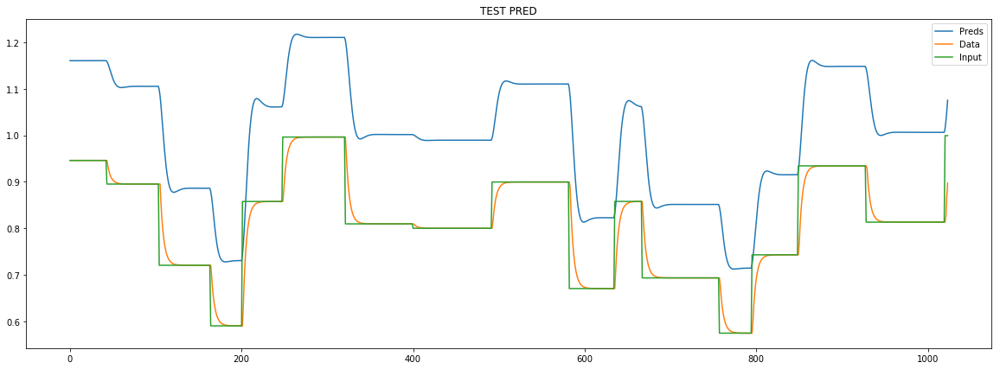

loss rate [0.006426626146111891]
Epoch [40] 
     train_loss[109.55508176982403] 
     eval_train[108.92698804690288] 
     eval_test[115.52961198850112]



aux preds: 0.5752263069152832 0.8081751465797424
main loss 0.0
aux loss 107.04181230985202
const loss 2.0074421029824476
combined loss 109.04925441283447 


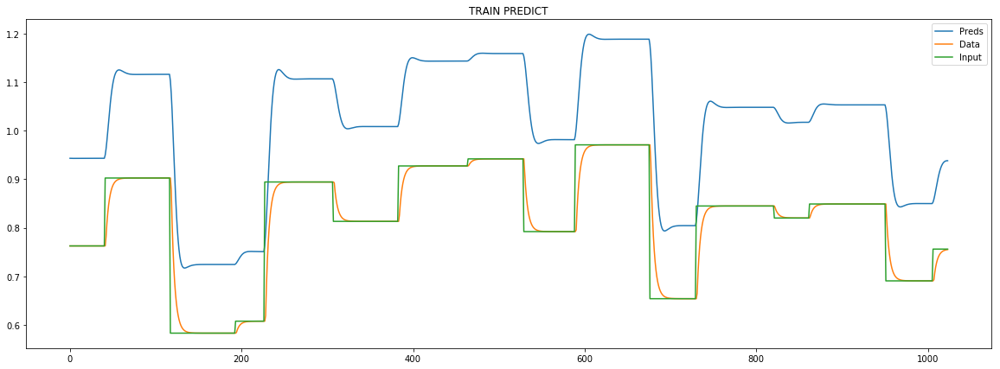

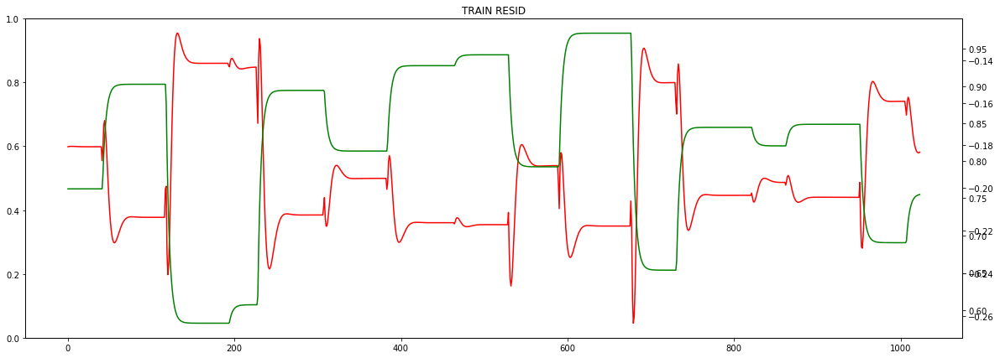

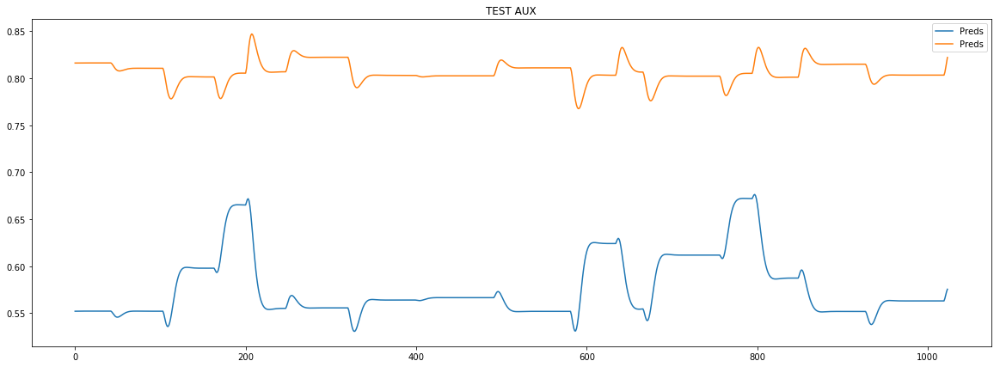

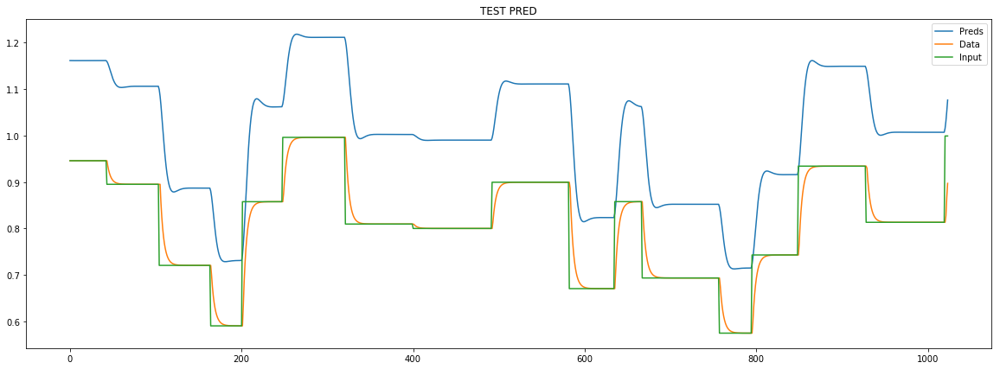

loss rate [0.007288002374081337]
Epoch [41] 
     train_loss[109.04925441283447] 
     eval_train[108.4888050109148] 
     eval_test[115.07920812476765]



aux preds: 0.5750576257705688 0.8073567748069763
main loss 0.0
aux loss 106.6413193482619
const loss 1.962741658091545
combined loss 108.60406100635345 


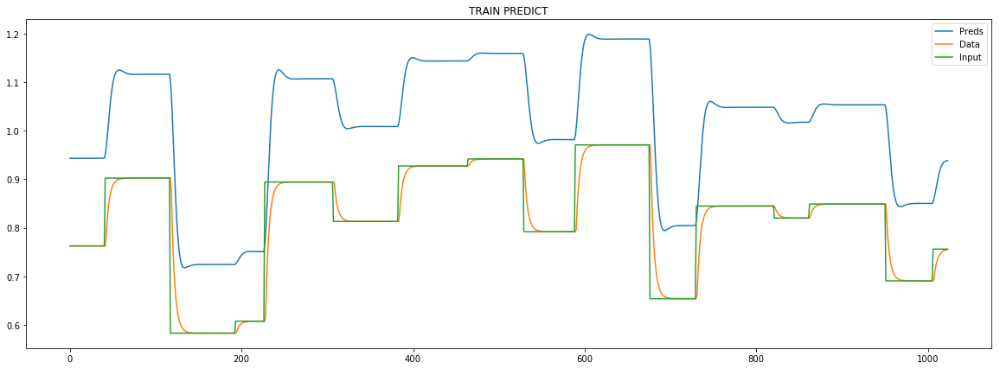

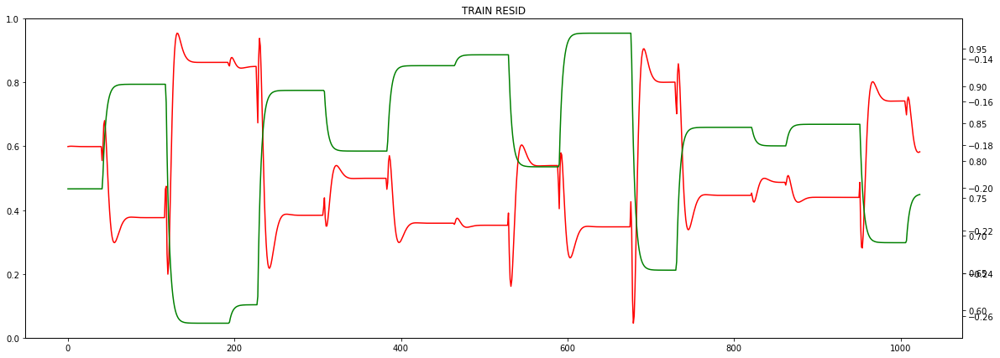

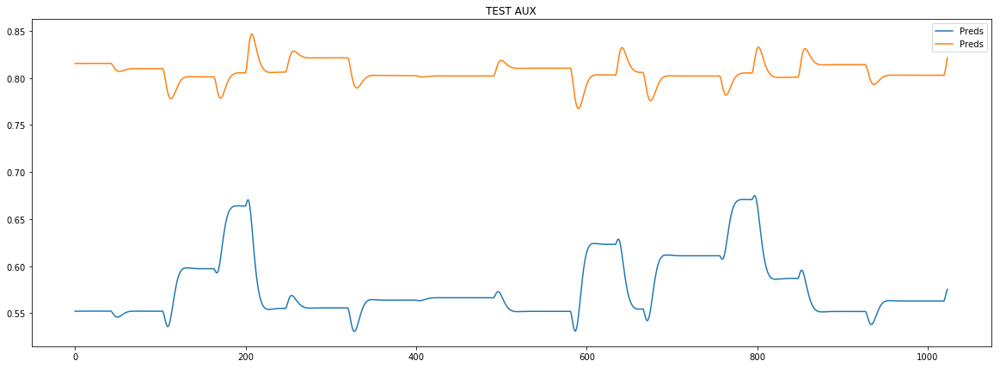

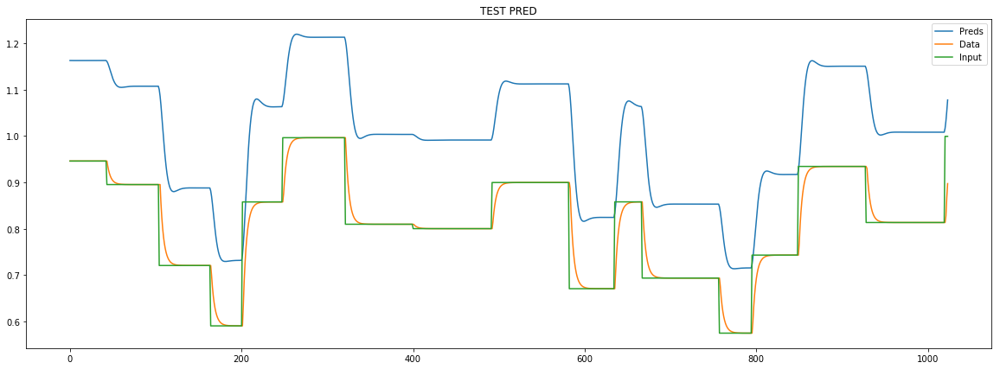

loss rate [0.007928960012829056]
Epoch [42] 
     train_loss[108.60406100635345] 
     eval_train[108.02019934929335] 
     eval_test[114.60077285766602]



aux preds: 0.5749930143356323 0.8066036105155945
main loss 0.0
aux loss 106.29810634026161
const loss 1.917890415741847
combined loss 108.21599675600346 


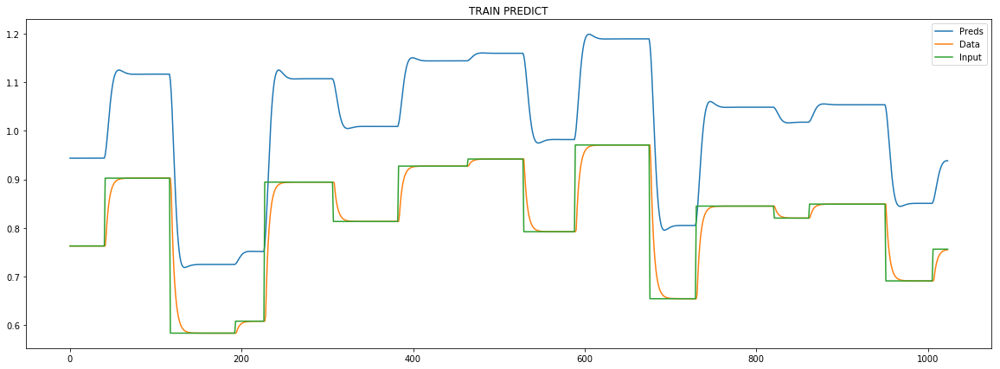

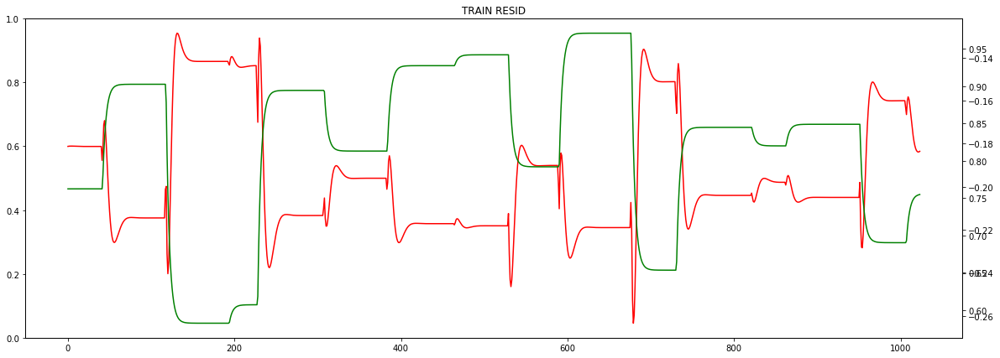

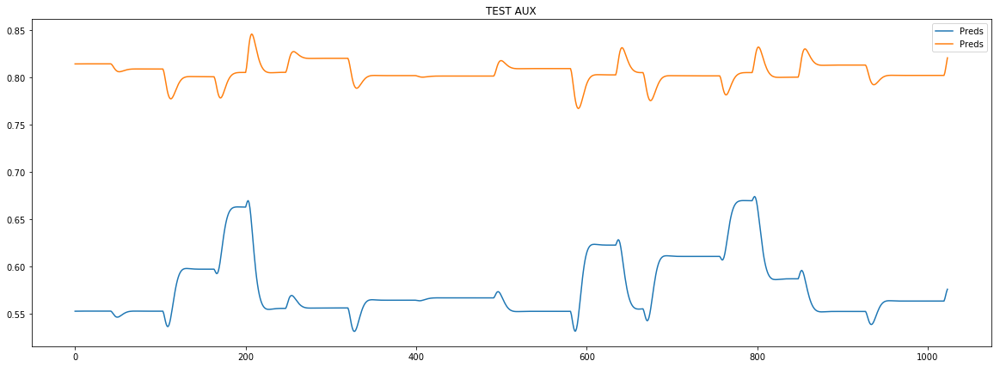

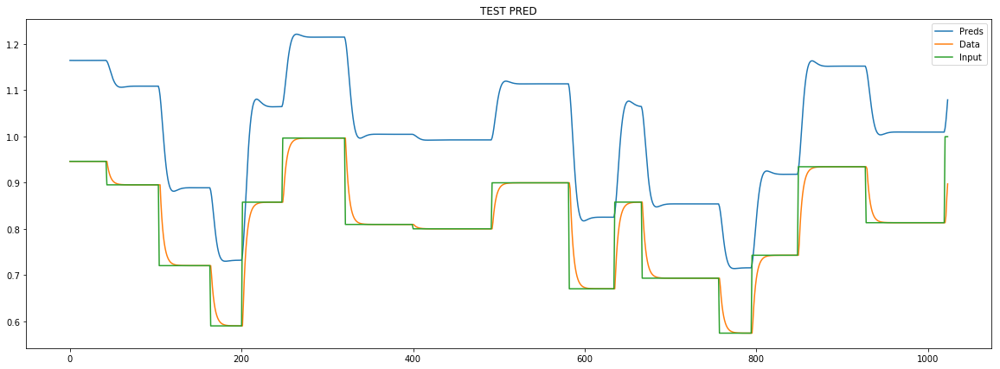

loss rate [0.008338856695851216]
Epoch [43] 
     train_loss[108.21599675600346] 
     eval_train[107.53606967971875] 
     eval_test[114.110313215039]



aux preds: 0.5750219821929932 0.805935800075531
main loss 0.0
aux loss 106.00217687166653
const loss 1.8732584118843079
combined loss 107.87543528355084 


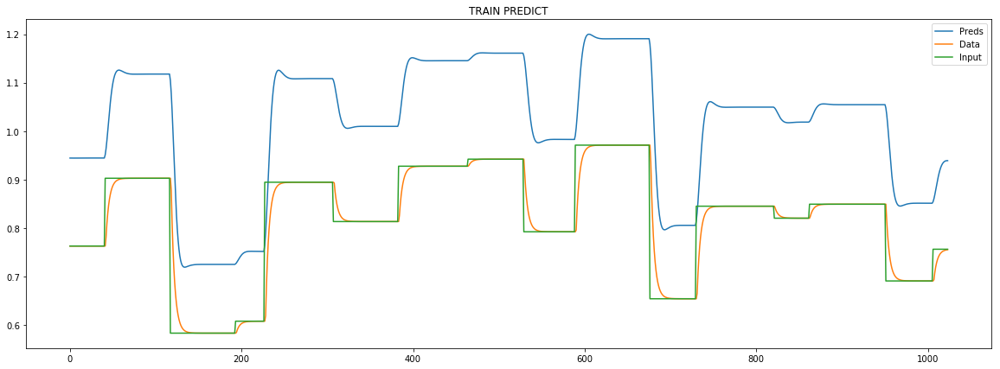

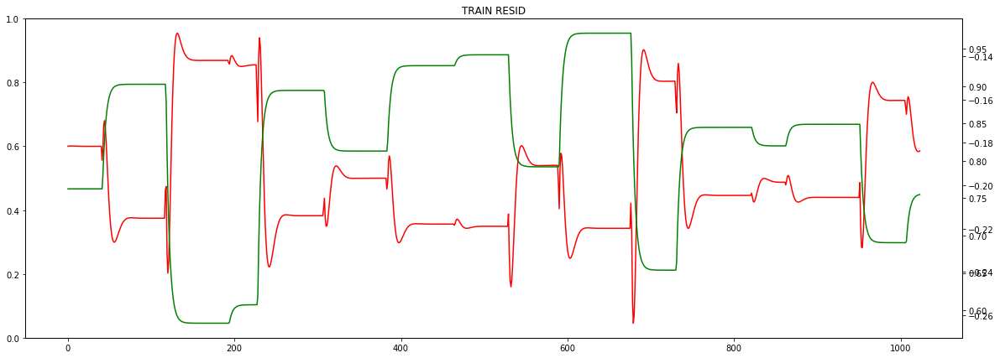

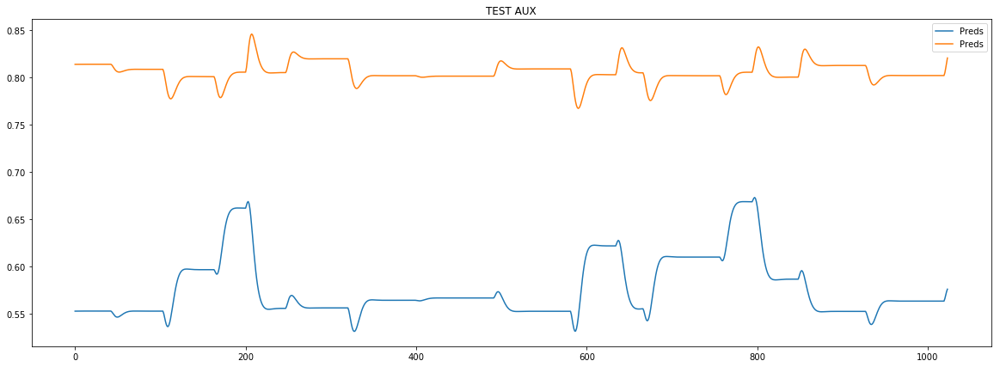

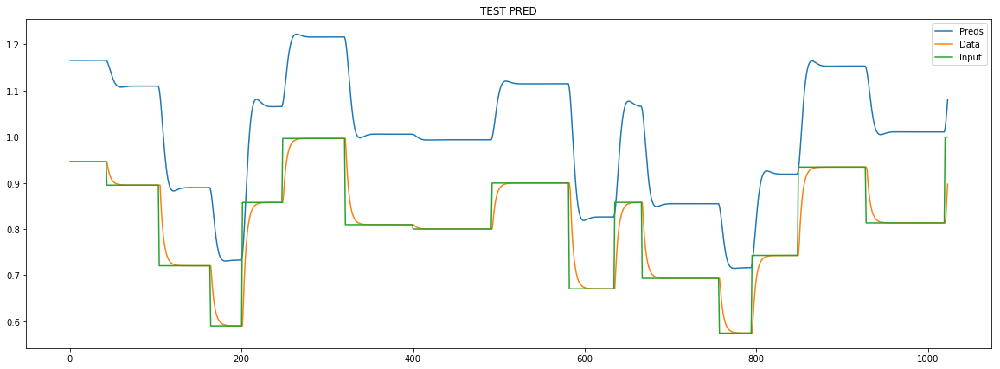

loss rate [0.008402571122048896]
Epoch [44] 
     train_loss[107.87543528355084] 
     eval_train[107.06241683318065] 
     eval_test[113.63385726646943]



aux preds: 0.5751217603683472 0.8053519129753113
main loss 0.0
aux loss 105.74549814370963
const loss 1.8294955709805856
combined loss 107.57499371469021 


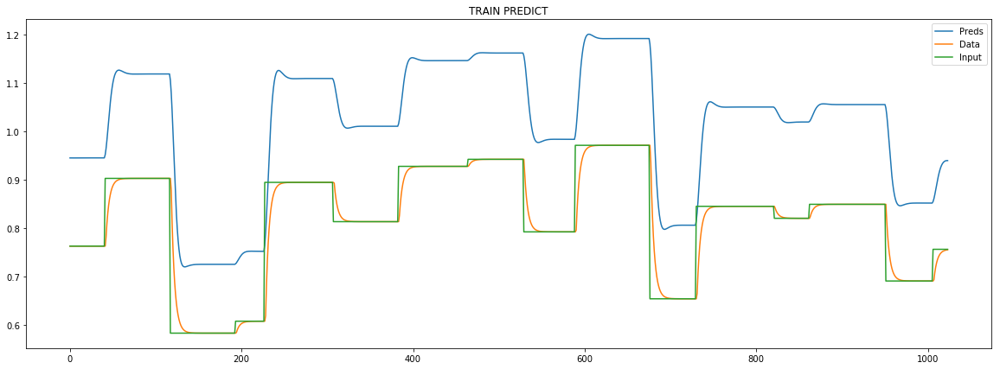

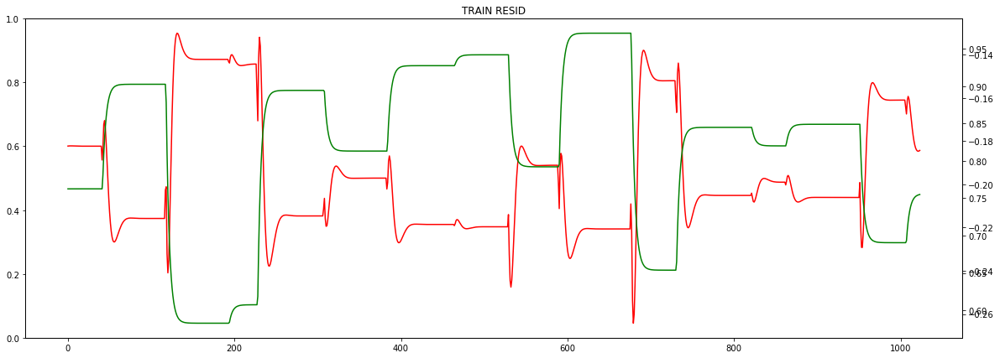

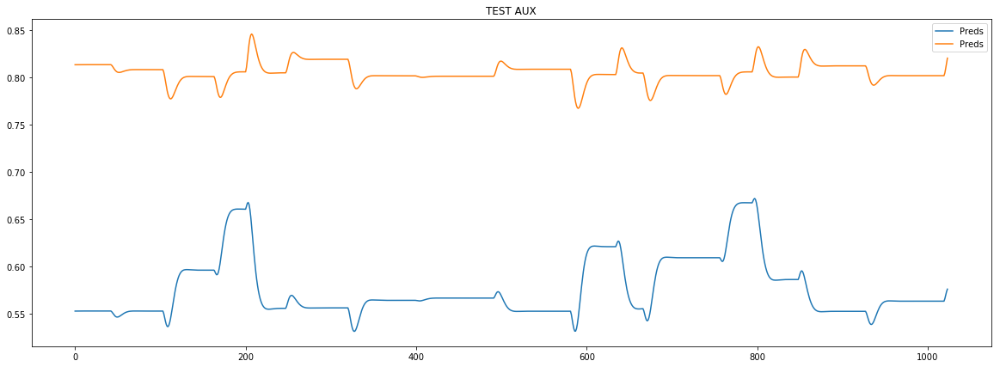

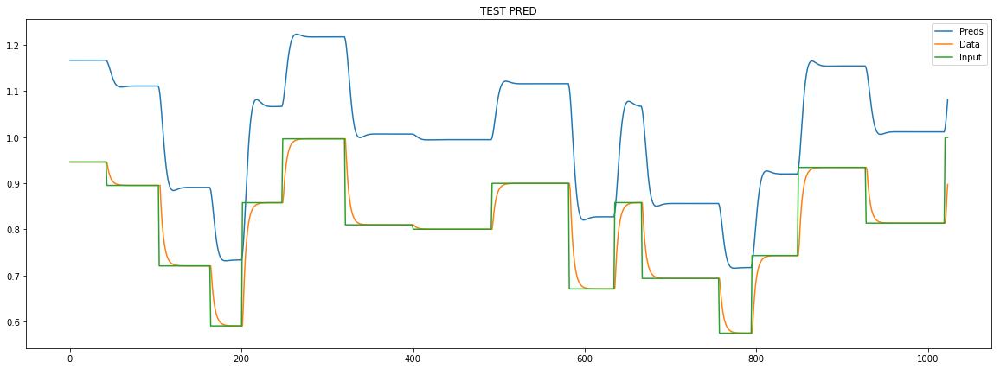

loss rate [0.008030105022437728]
Epoch [45] 
     train_loss[107.57499371469021] 
     eval_train[106.6281896348183] 
     eval_test[113.1986258300868]



aux preds: 0.5752886533737183 0.8048396110534668
main loss 0.0
aux loss 105.52099572695218
const loss 1.787040780370052
combined loss 107.30803650732223 


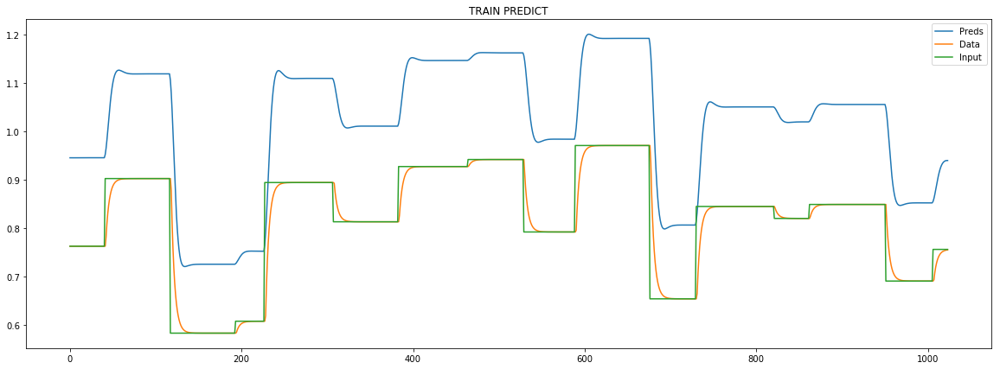

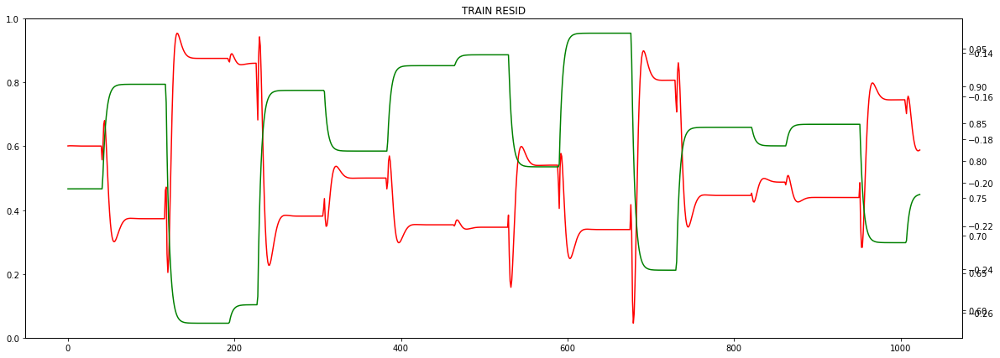

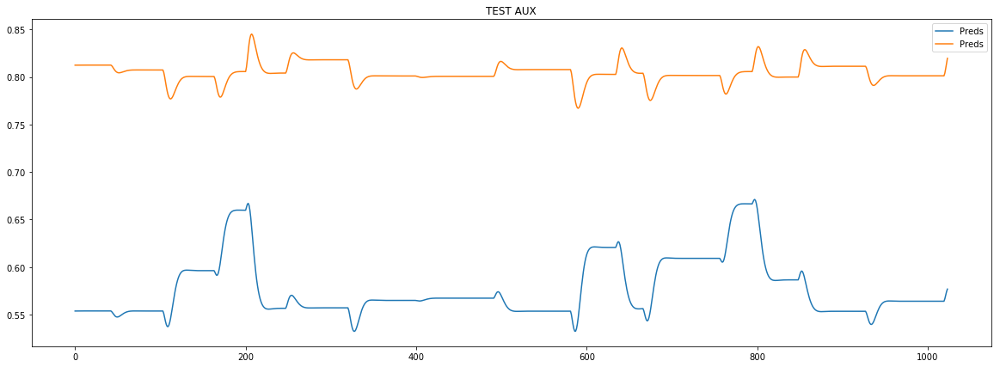

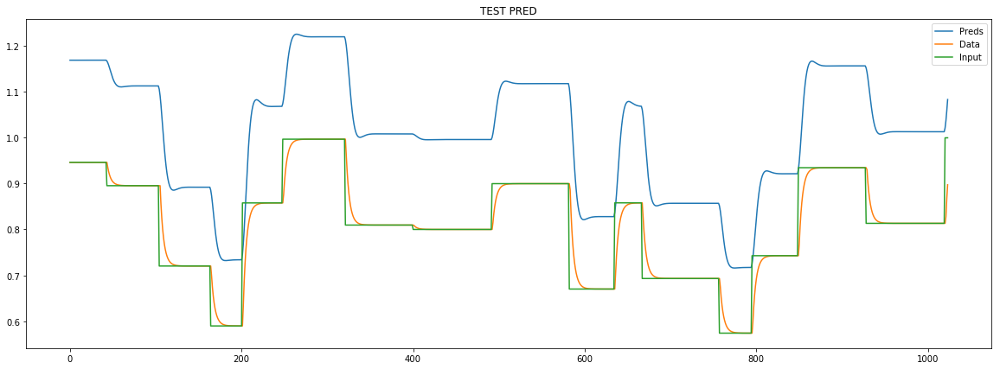

loss rate [0.007273729723914157]
Epoch [46] 
     train_loss[107.30803650732223] 
     eval_train[106.25095856648224] 
     eval_test[112.82095685330304]



aux preds: 0.5755196809768677 0.8044171333312988
main loss 0.0
aux loss 105.32355807377742
const loss 1.7458295168784947
combined loss 107.06938759065592 


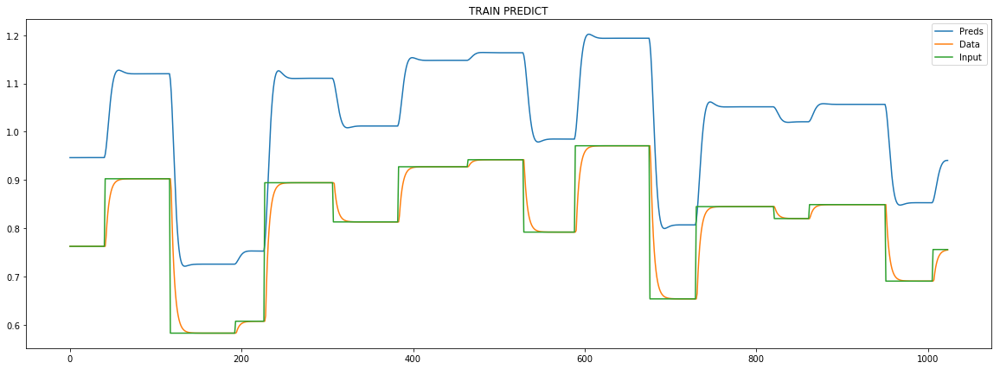

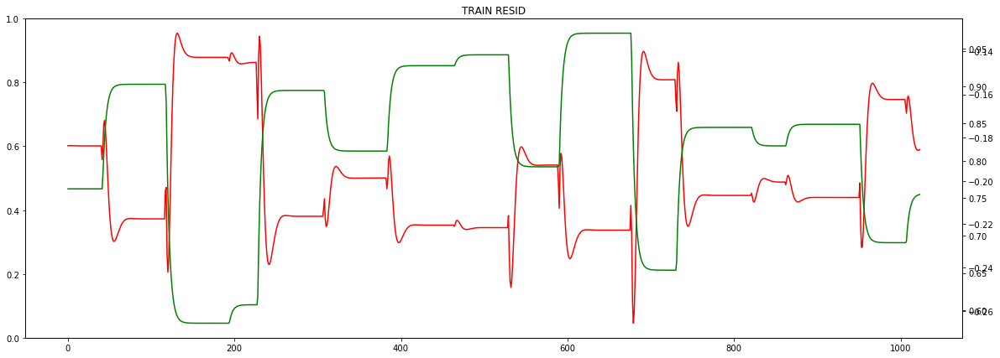

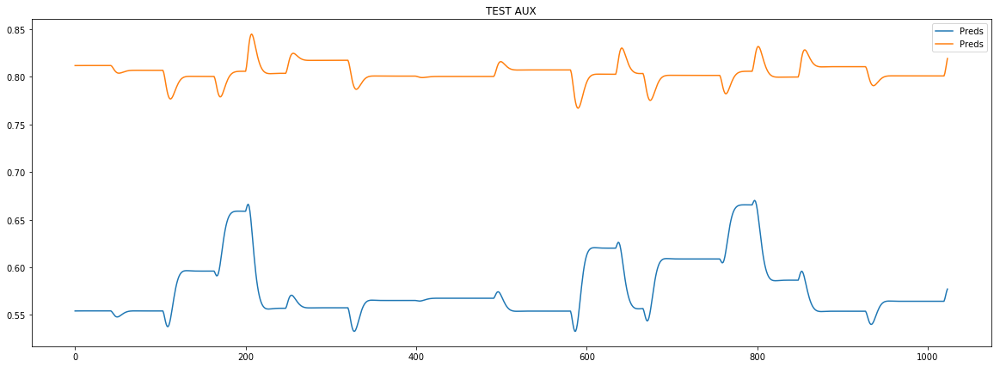

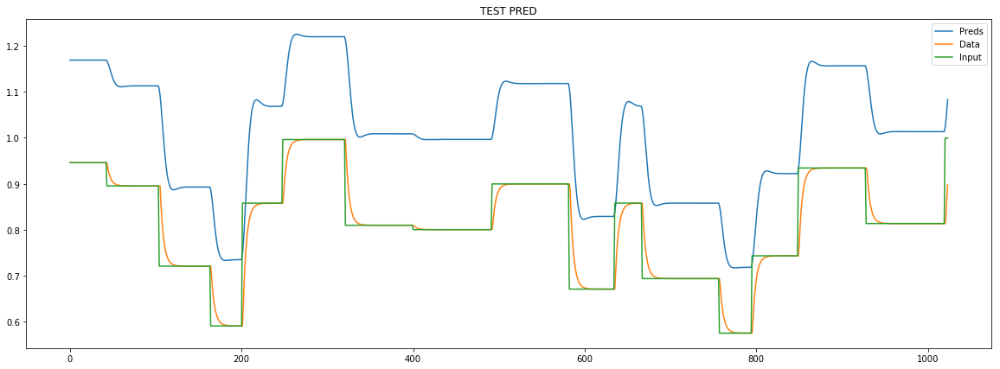

loss rate [0.006258632228359984]
Epoch [47] 
     train_loss[107.06938759065592] 
     eval_train[105.94118000108462] 
     eval_test[112.50922466137192]



aux preds: 0.5758125185966492 0.804091215133667
main loss 0.0
aux loss 105.15154662499062
const loss 1.705314503266261
combined loss 106.85686112825688 


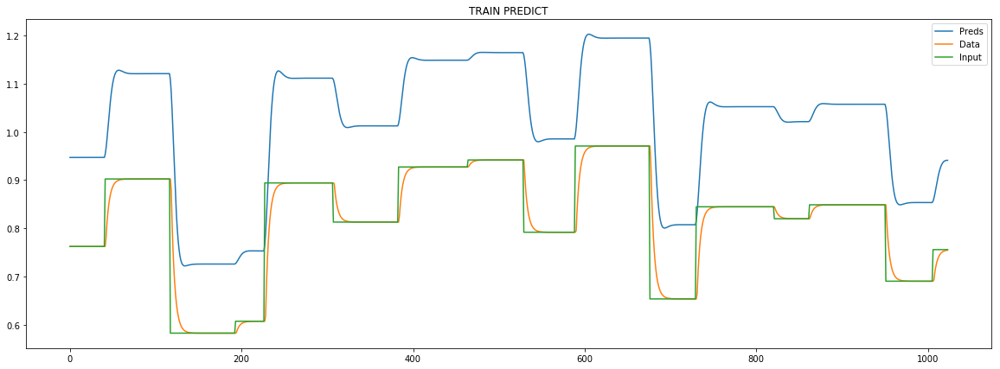

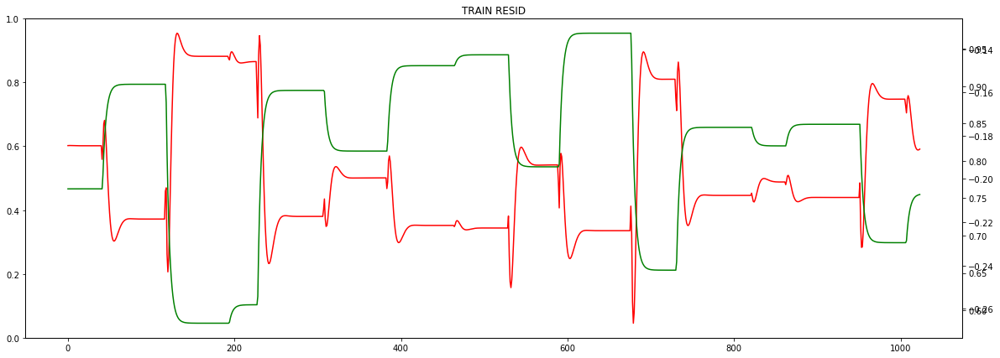

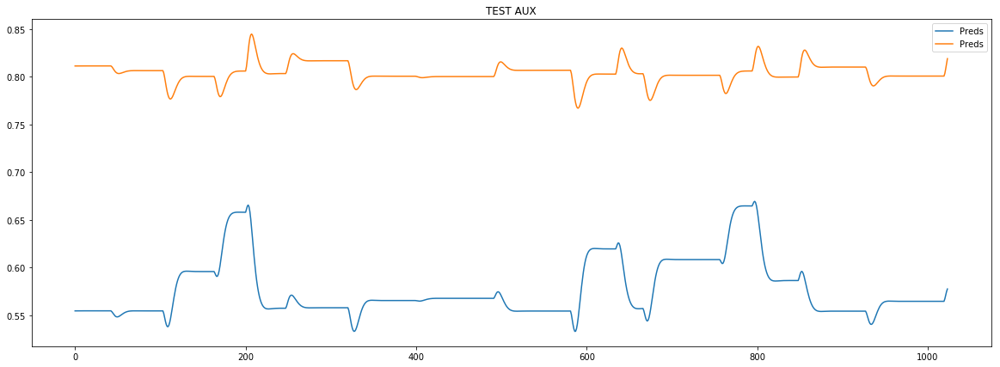

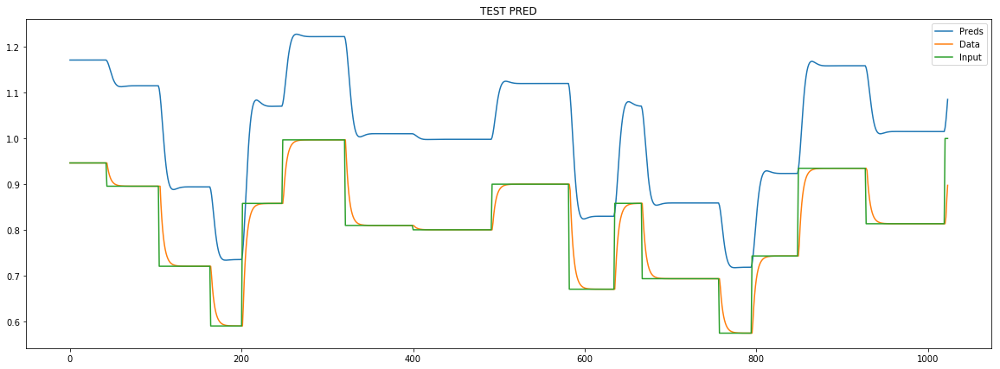

loss rate [0.005224906558209397]
Epoch [48] 
     train_loss[106.85686112825688] 
     eval_train[105.68979535767666] 
     eval_test[112.25334198637442]



aux preds: 0.5761808156967163 0.8038830161094666
main loss 0.0
aux loss 105.00716517521785
const loss 1.6647873692787611
combined loss 106.6719525444966 


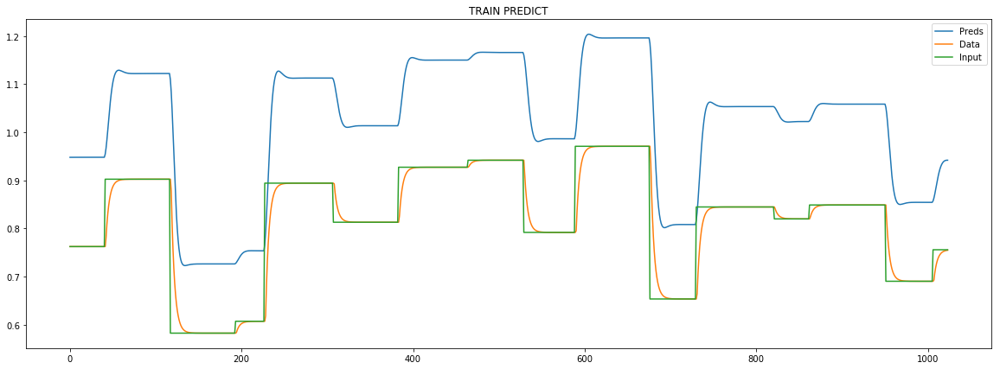

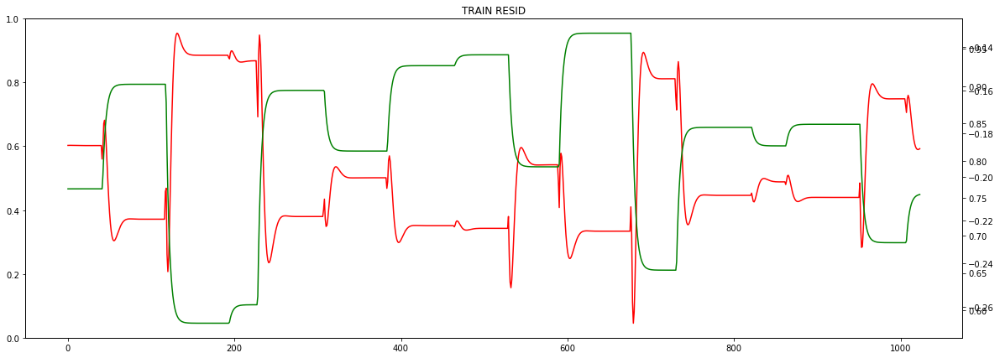

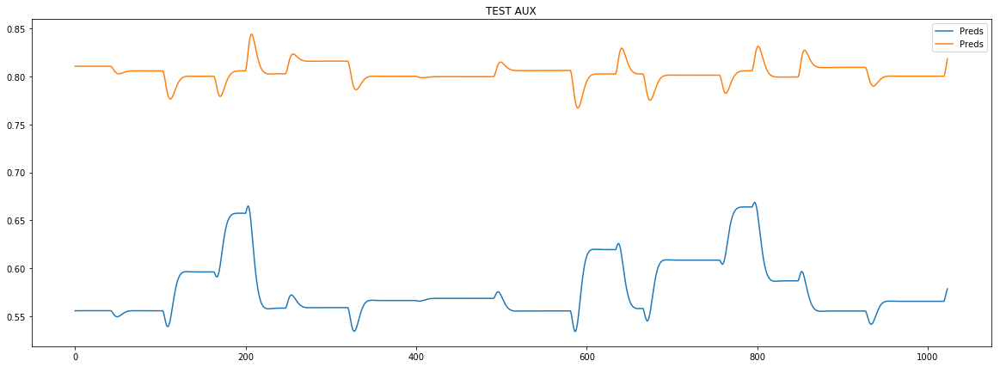

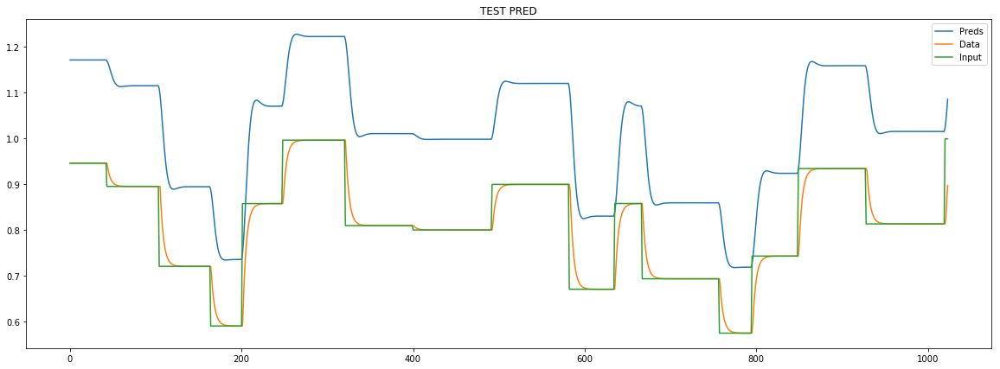

loss rate [0.004326324705683504]
Epoch [49] 
     train_loss[106.6719525444966] 
     eval_train[105.48461781728726] 
     eval_test[112.04100918769836]



aux preds: 0.5766326785087585 0.803816556930542
main loss 0.0
aux loss 104.89889761117789
const loss 1.6235353803405395
combined loss 106.52243299151843 


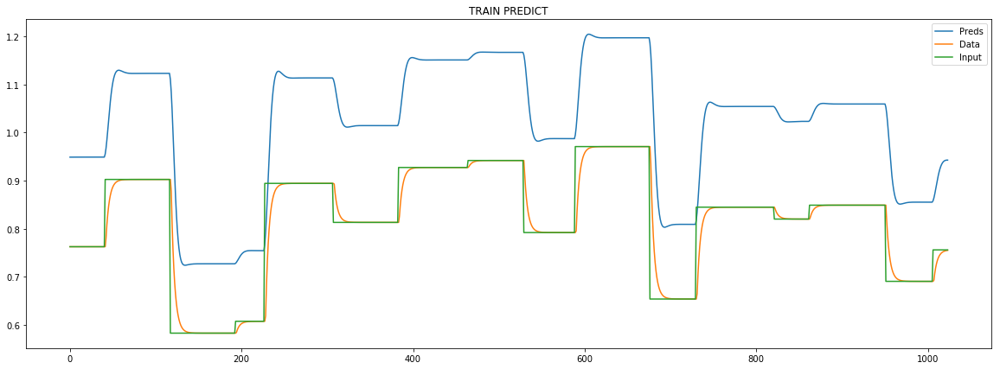

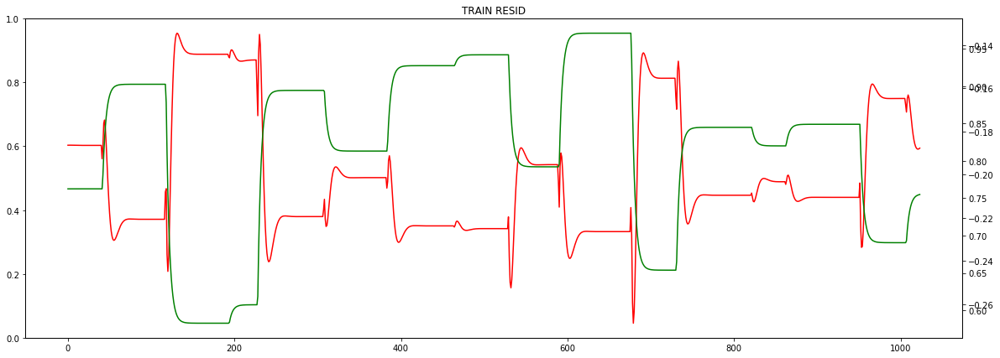

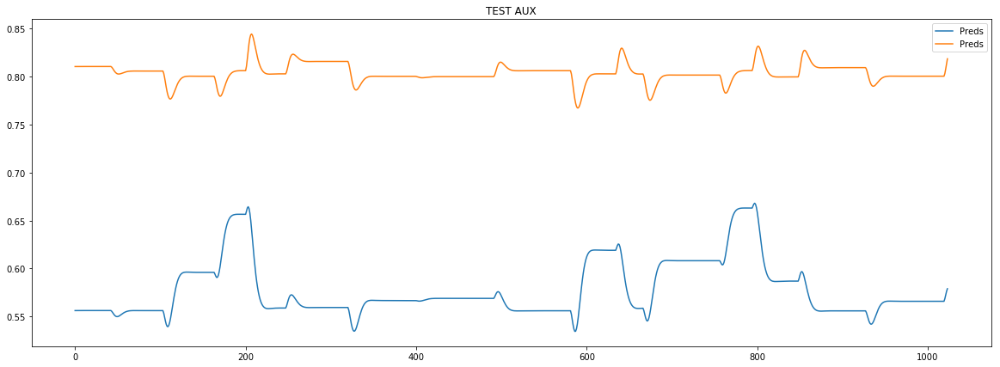

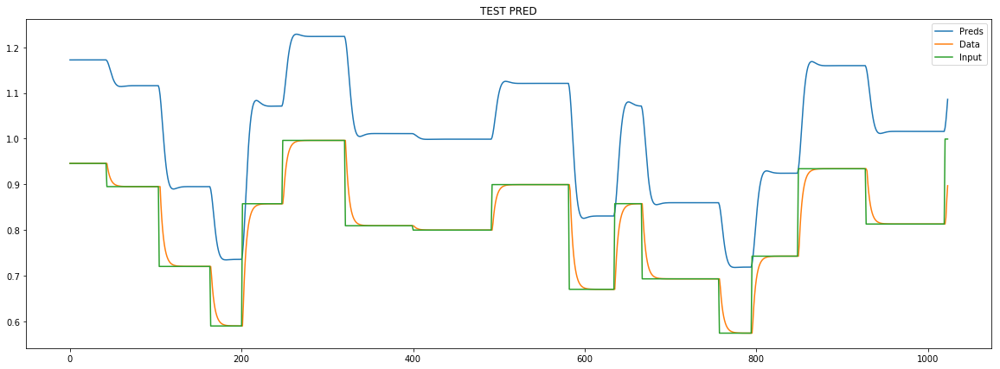

loss rate [0.0037078402878332195]
Epoch [50] 
     train_loss[106.52243299151843] 
     eval_train[105.30602980175843] 
     eval_test[111.85158732262525]



aux preds: 0.5771793723106384 0.8039042949676514
main loss 0.0
aux loss 104.84040473057674
const loss 1.581229490156357
combined loss 106.4216342207331 


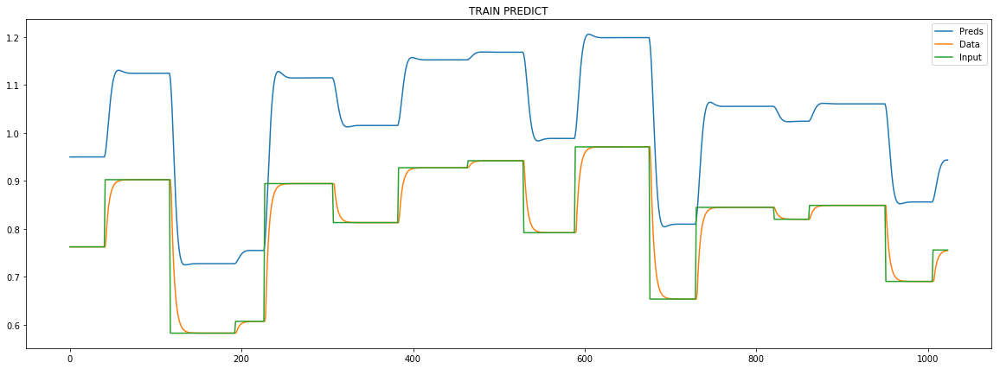

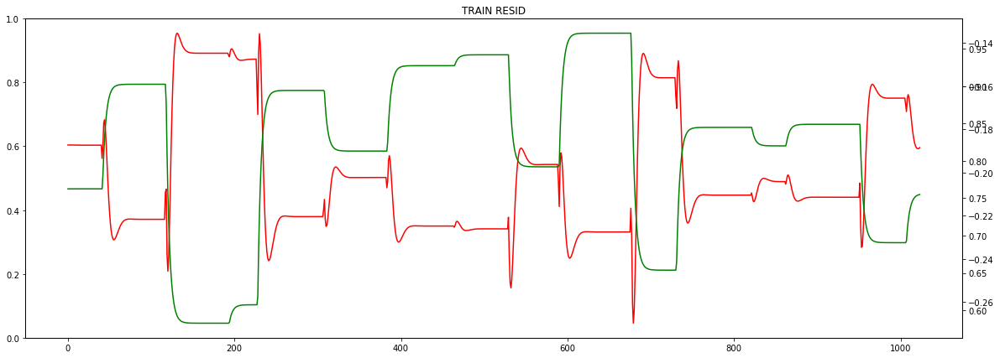

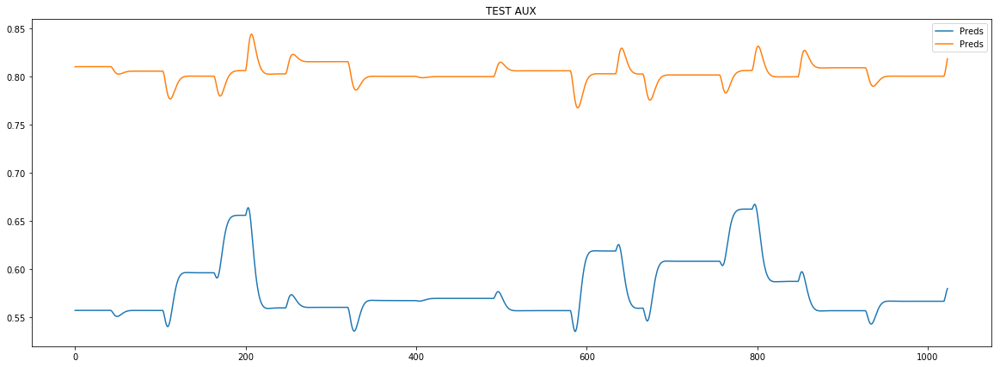

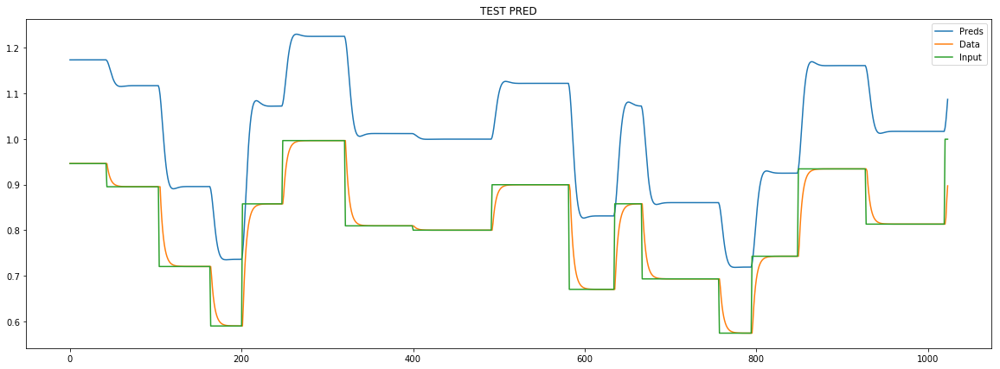

loss rate [0.003510776282439787]
Epoch [51] 
     train_loss[106.4216342207331] 
     eval_train[105.125579601297] 
     eval_test[111.65526843612845]



aux preds: 0.5778200030326843 0.8041124939918518
main loss 0.0
aux loss 104.83819059225229
const loss 1.5379078302245874
combined loss 106.37609842247687 


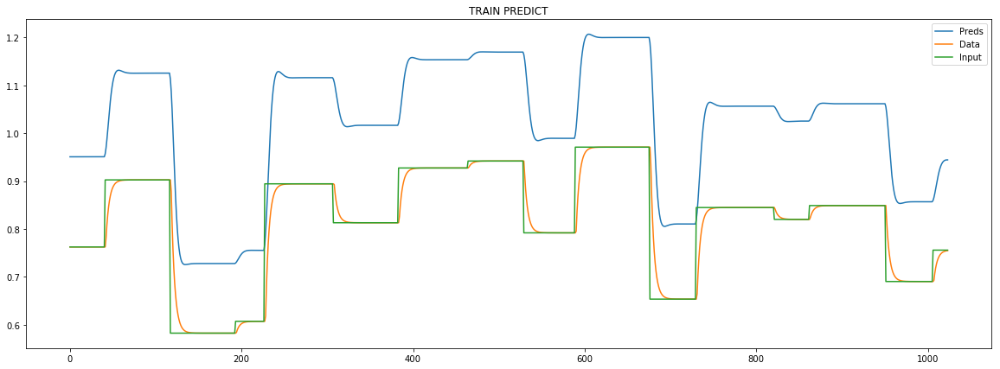

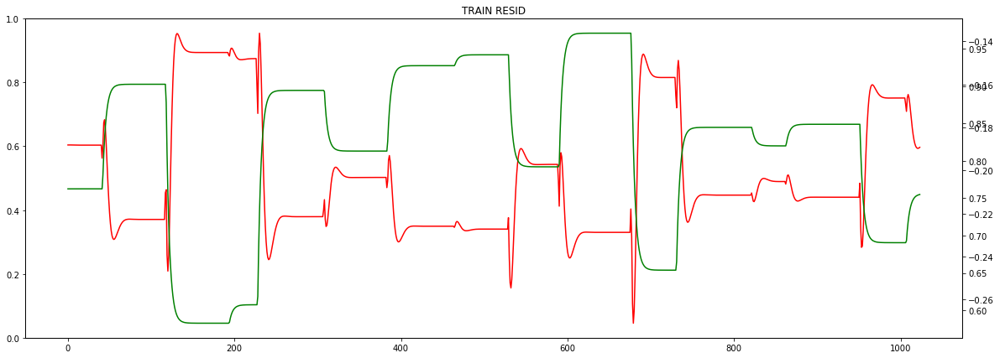

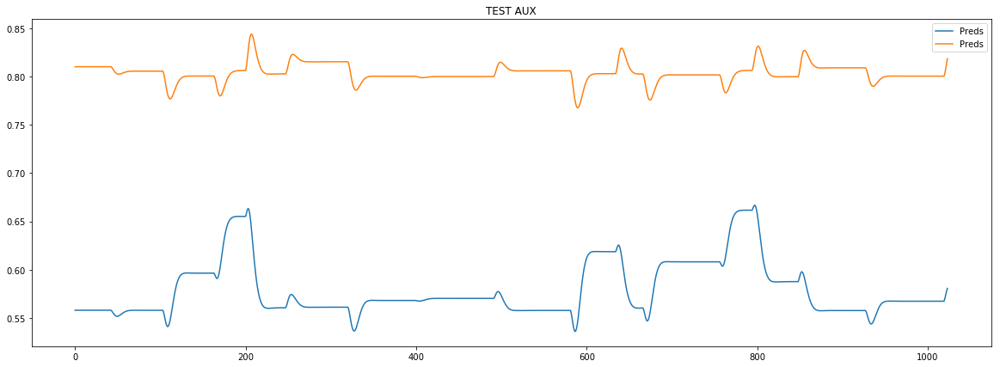

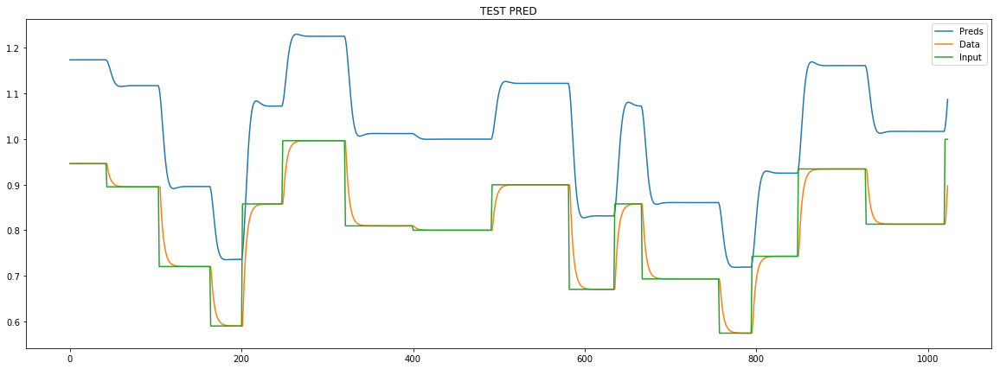

loss rate [0.003838077791936012]
Epoch [52] 
     train_loss[106.37609842247687] 
     eval_train[104.91191797531567] 
     eval_test[111.42000204595652]



aux preds: 0.5785230398178101 0.8044021129608154
main loss 0.0
aux loss 104.88156590094933
const loss 1.4940628117093673
combined loss 106.3756287126587 


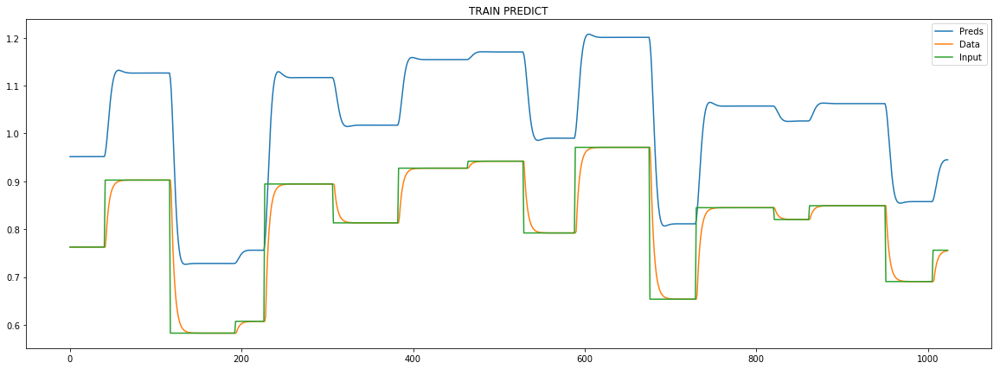

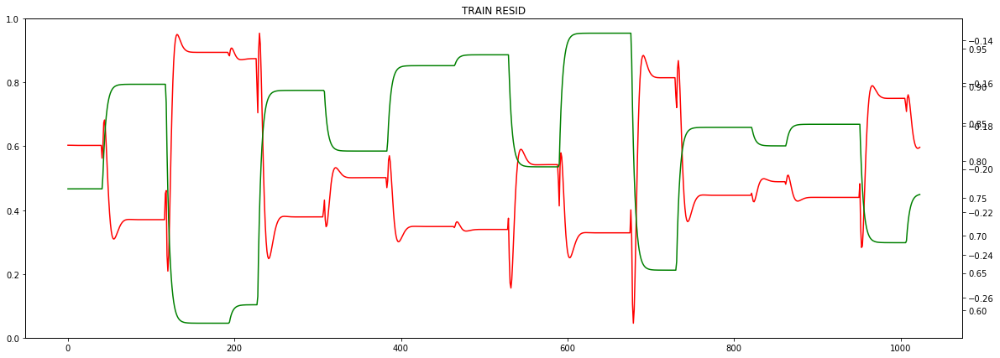

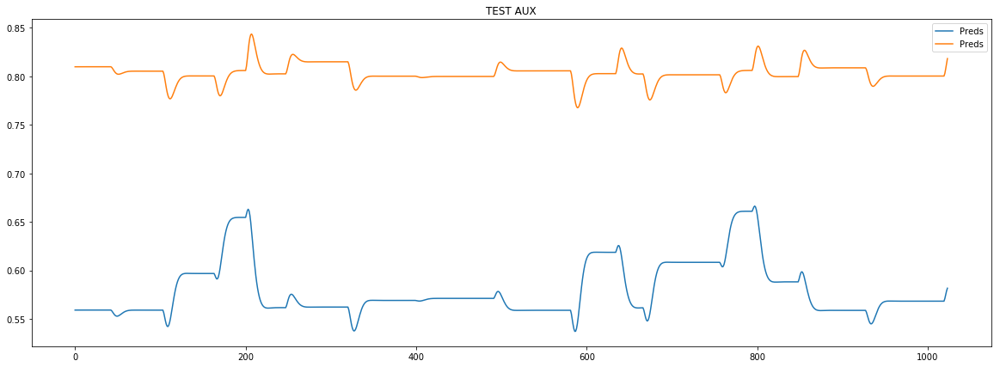

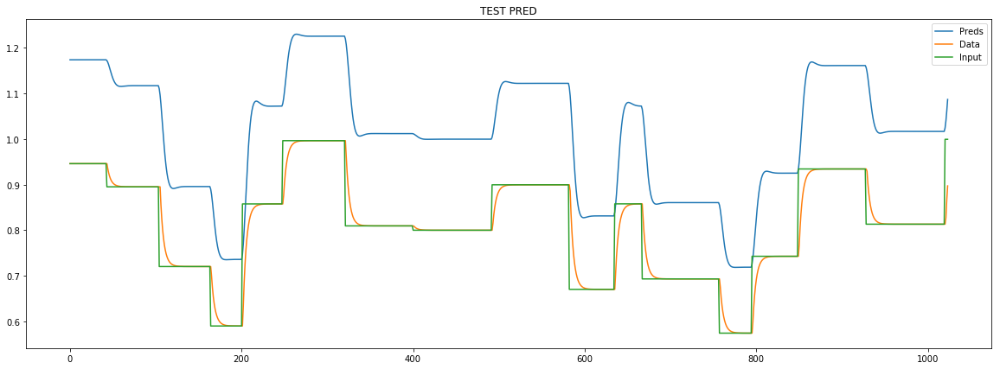

loss rate [0.0046337284772104415]
Epoch [53] 
     train_loss[106.3756287126587] 
     eval_train[104.64473220304801] 
     eval_test[111.12496589530599]



aux preds: 0.5792458057403564 0.8046896457672119
main loss 0.0
aux loss 104.9314374923706
const loss 1.4504275413659902
combined loss 106.3818650337366 


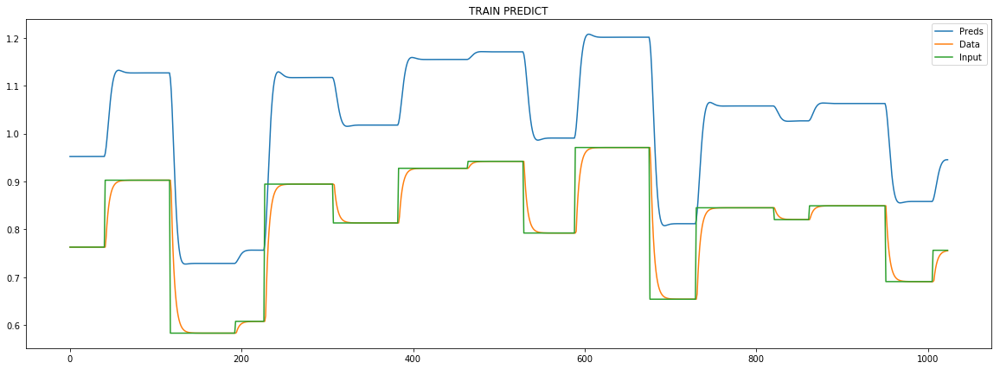

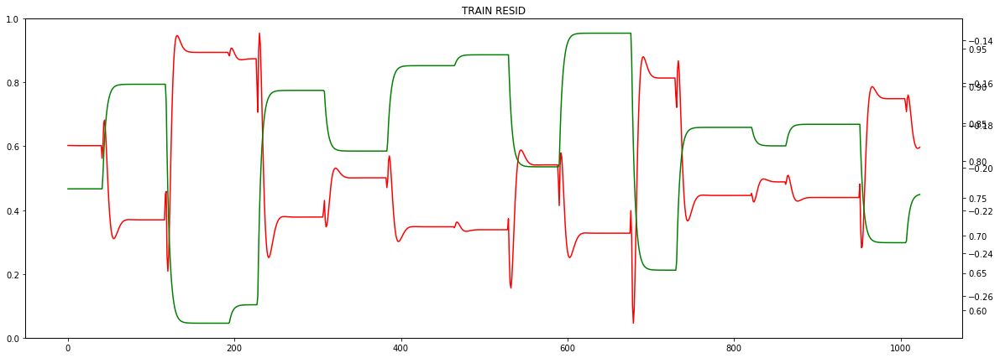

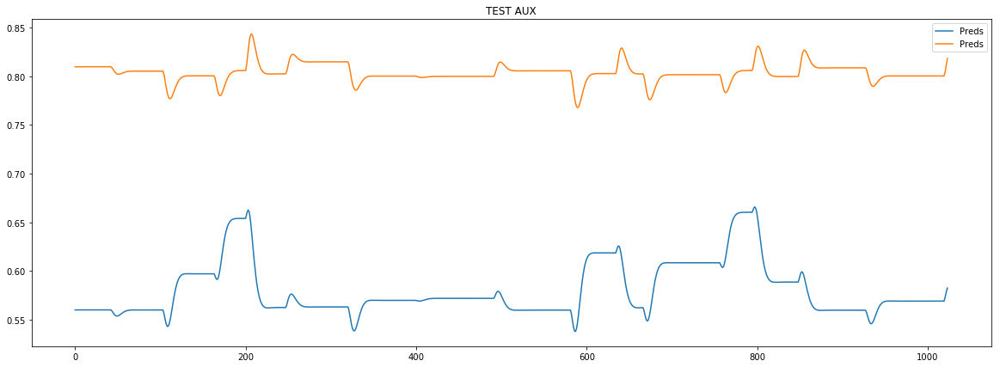

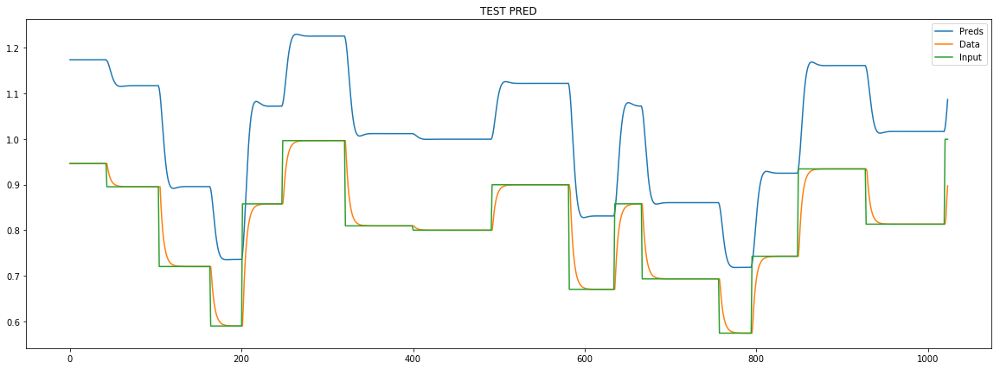

loss rate [0.005388709385818813]
Epoch [54] 
     train_loss[106.3818650337366] 
     eval_train[104.3510956810071] 
     eval_test[110.79977614229375]



aux preds: 0.5799461603164673 0.8049464821815491
main loss 0.0
aux loss 104.94516049898587
const loss 1.4079161561452425
combined loss 106.35307665513112 


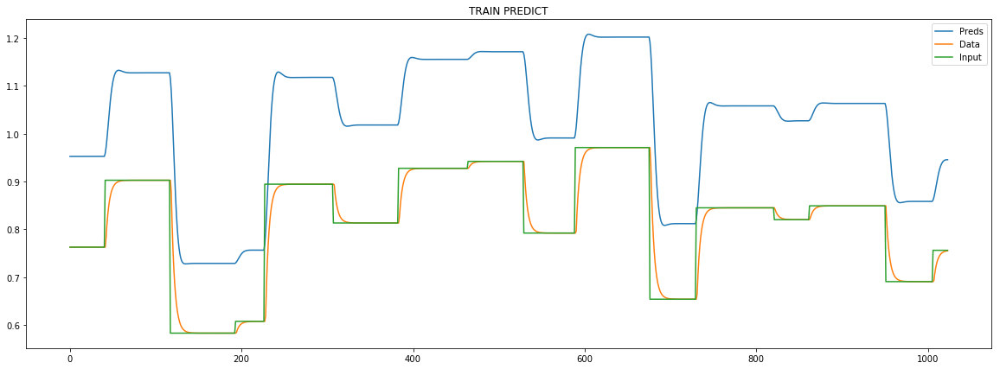

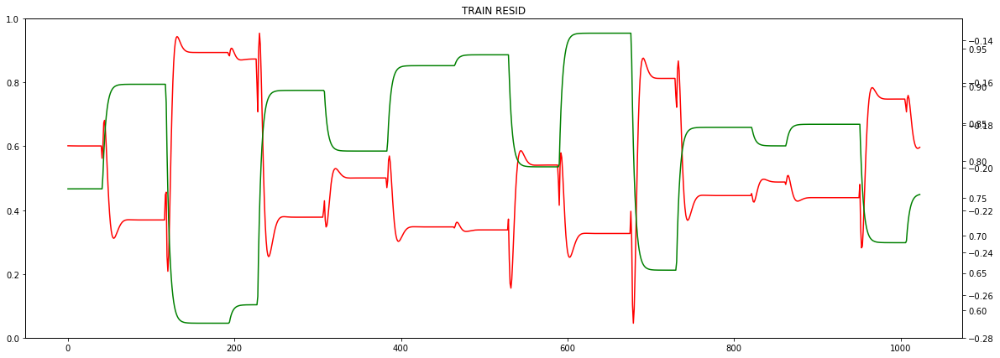

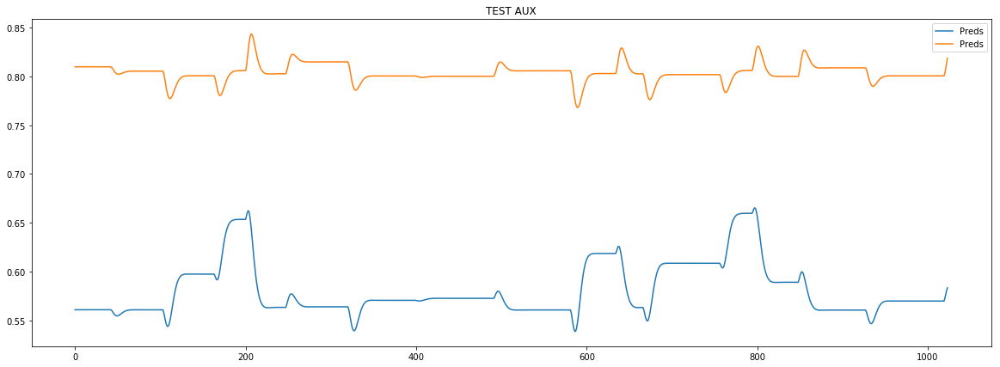

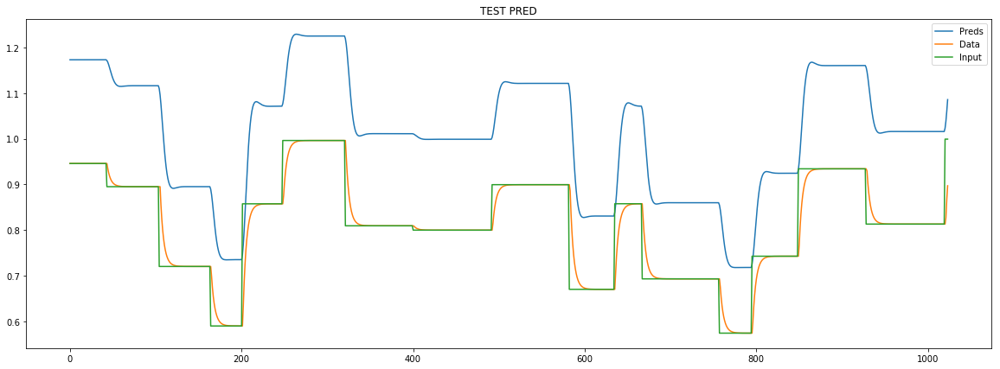

loss rate [0.0058398530807909355]
Epoch [55] 
     train_loss[106.35307665513112] 
     eval_train[104.04999263527301] 
     eval_test[110.46601991761815]



aux preds: 0.5805866122245789 0.8051323294639587
main loss 0.0
aux loss 104.88603151761569
const loss 1.3671376212285116
combined loss 106.2531691388442 


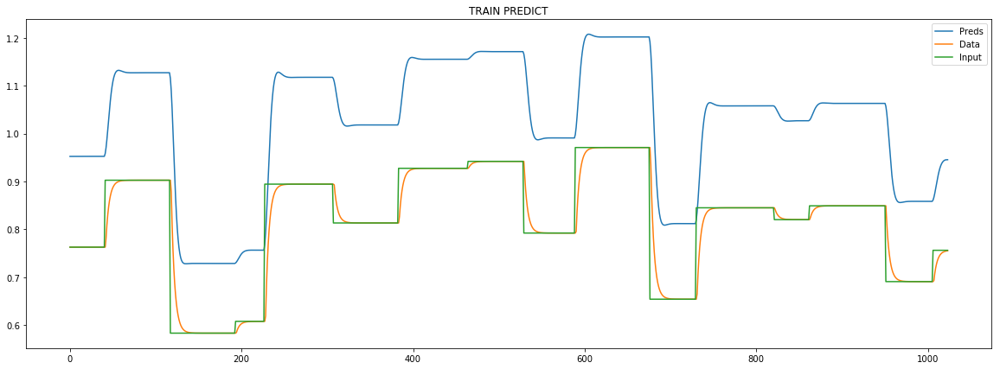

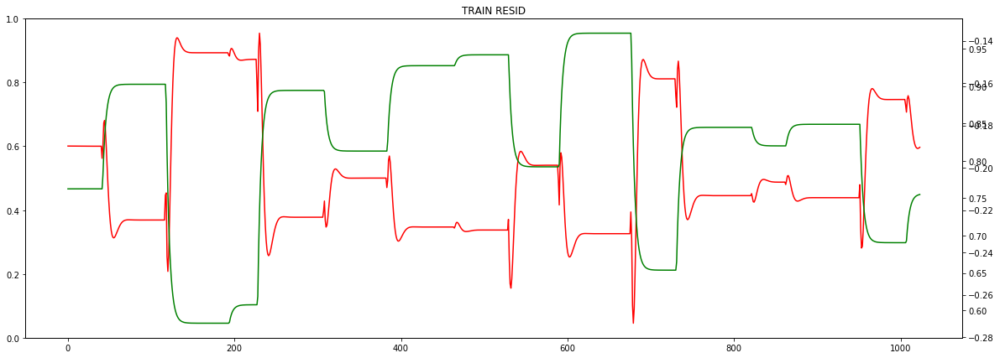

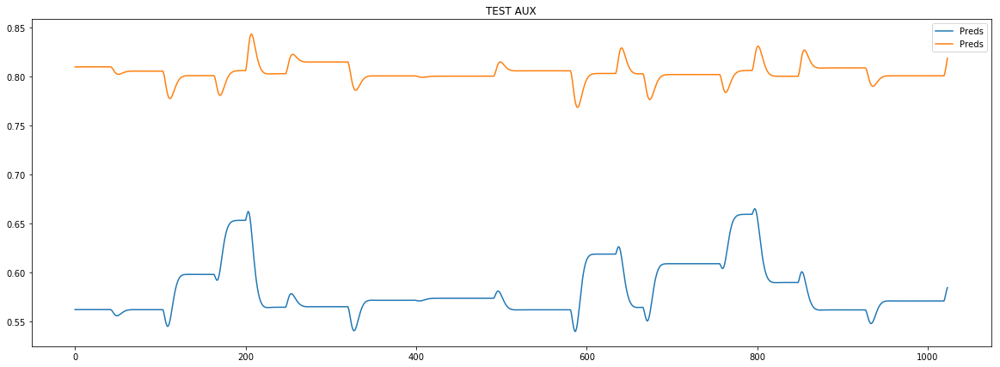

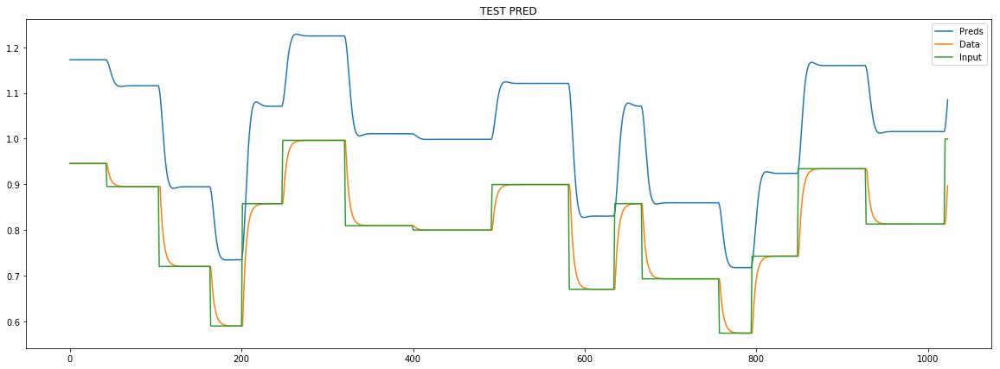

loss rate [0.005859142753288249]
Epoch [56] 
     train_loss[106.2531691388442] 
     eval_train[103.76355317578867] 
     eval_test[110.147745677016]



aux preds: 0.5811839699745178 0.8052833080291748
main loss 0.0
aux loss 104.75030018733098
const loss 1.3283101136867816
combined loss 106.07861030101776 


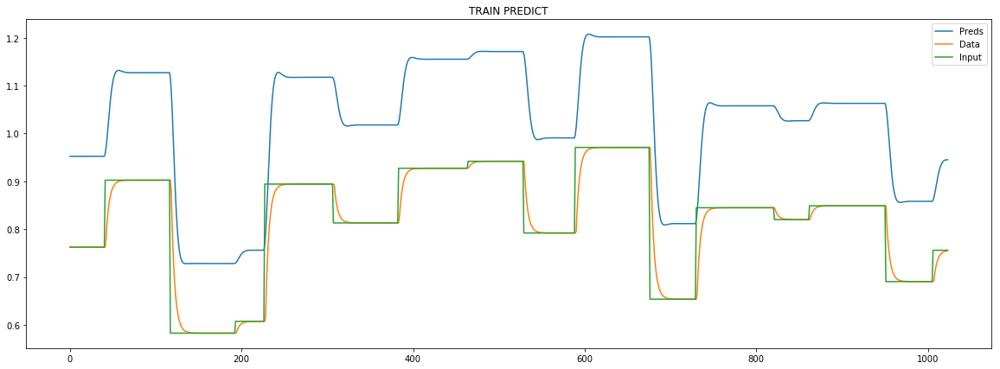

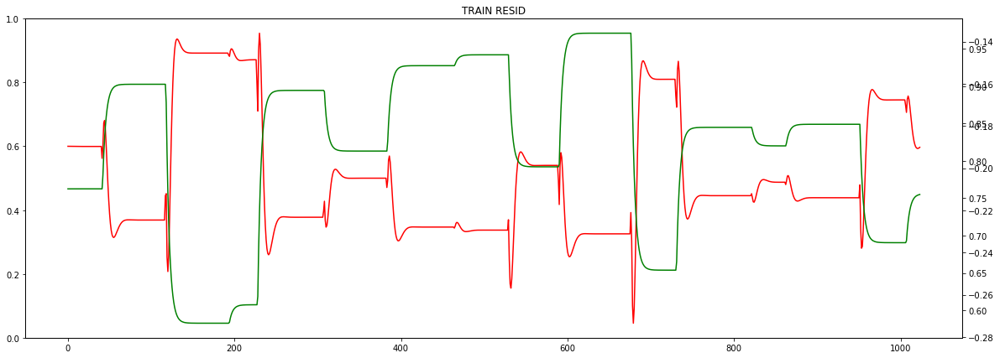

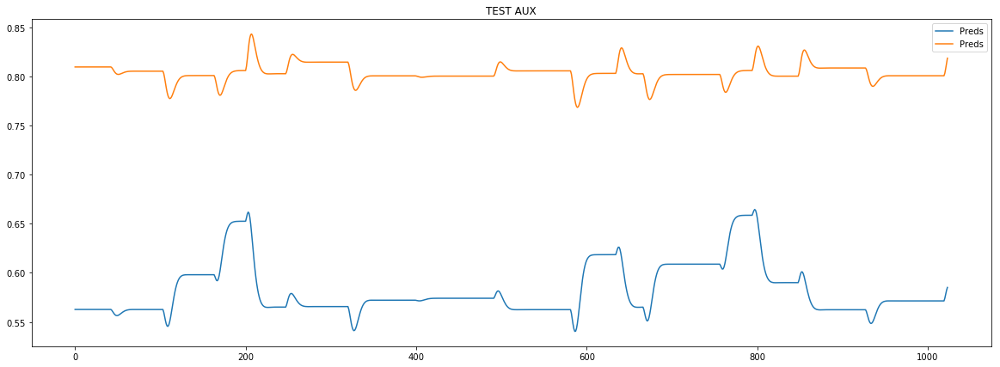

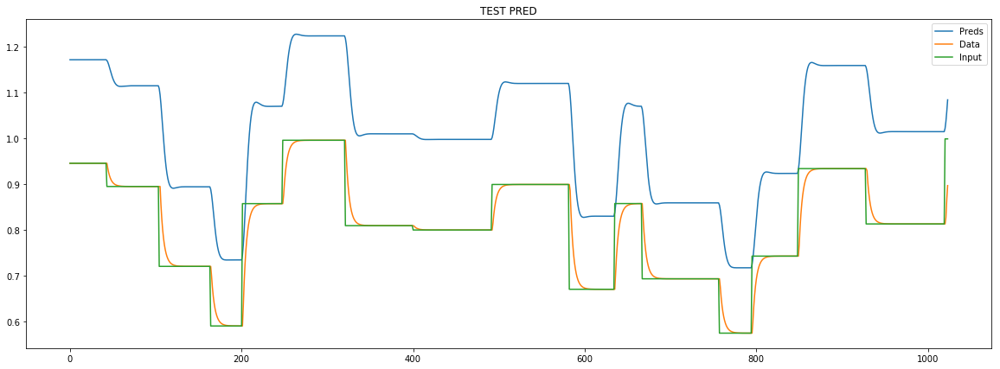

loss rate [0.005661635026197098]
Epoch [57] 
     train_loss[106.07861030101776] 
     eval_train[103.49278477063547] 
     eval_test[109.8457330736247]



aux preds: 0.5817404389381409 0.805393636226654
main loss 0.0
aux loss 104.54913997650146
const loss 1.2913414004903574
combined loss 105.84048137699182 


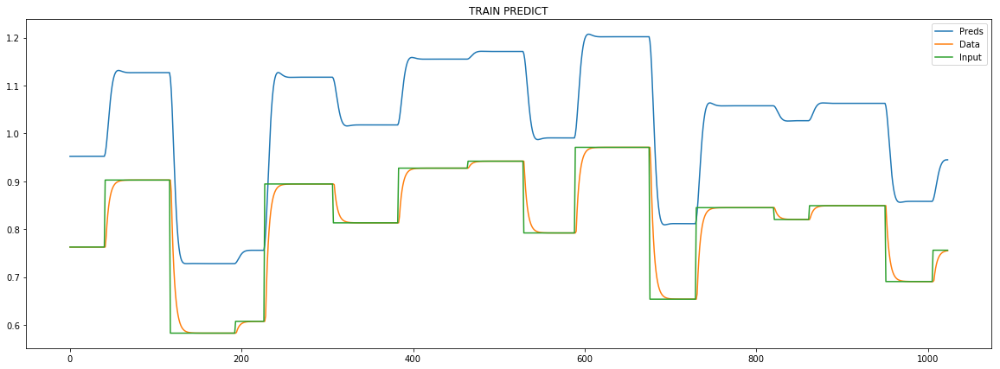

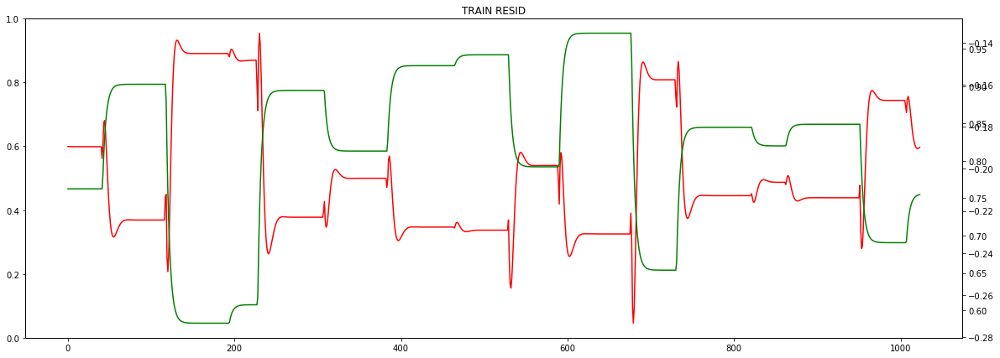

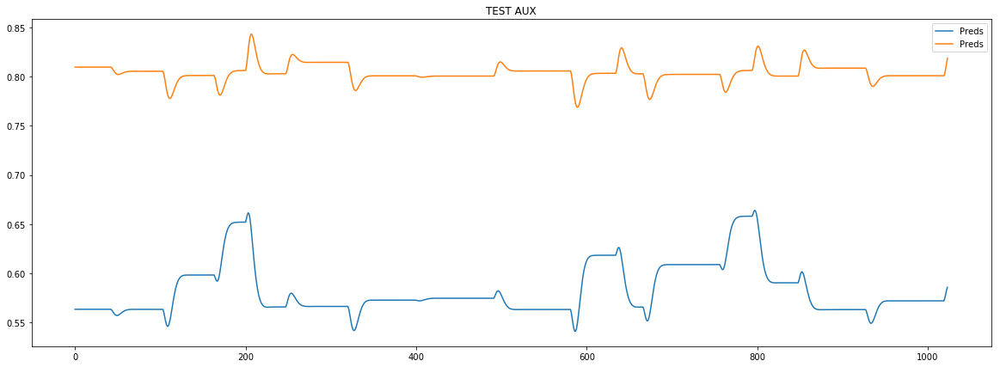

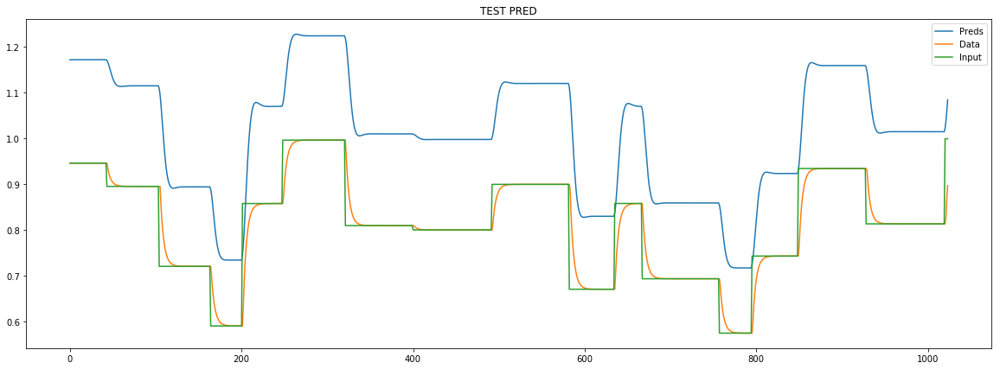

loss rate [0.005366568131705884]
Epoch [58] 
     train_loss[105.84048137699182] 
     eval_train[103.23832841217518] 
     eval_test[109.56202175129545]



aux preds: 0.5822723507881165 0.8054597973823547
main loss 0.0
aux loss 104.29805740943321
const loss 1.2560978892904062
combined loss 105.55415529872361 


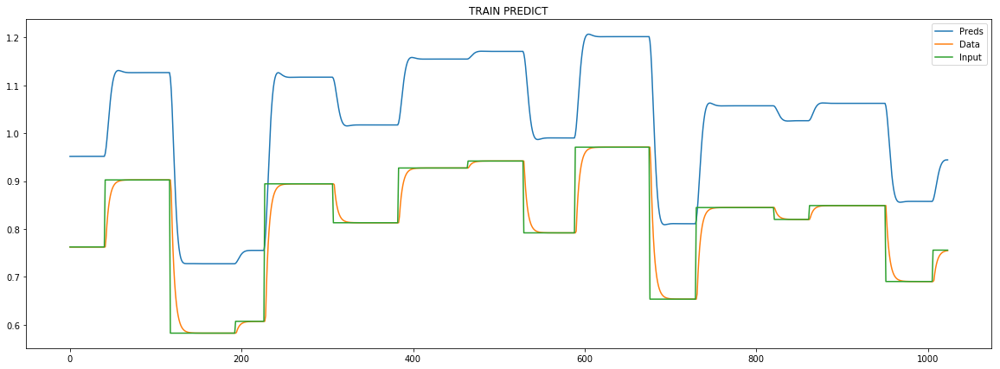

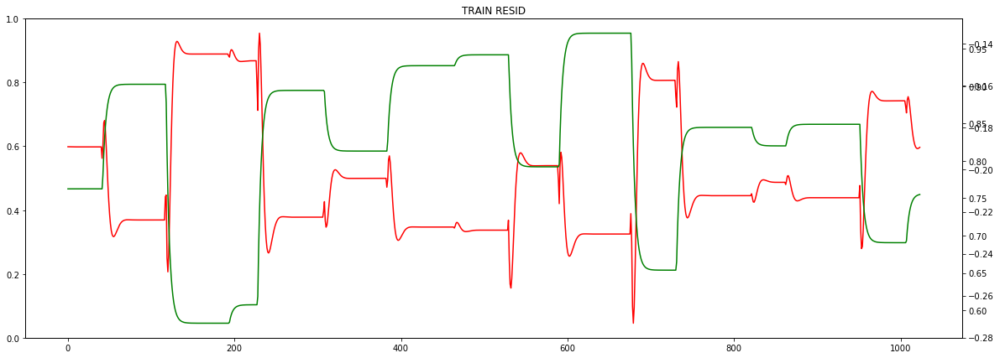

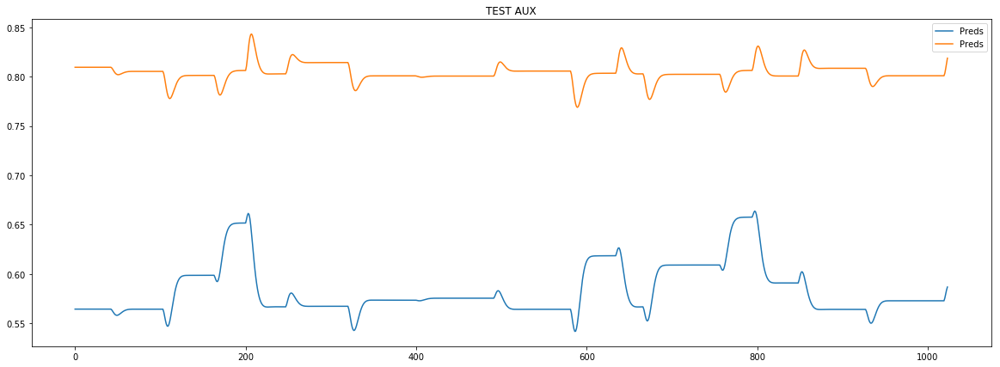

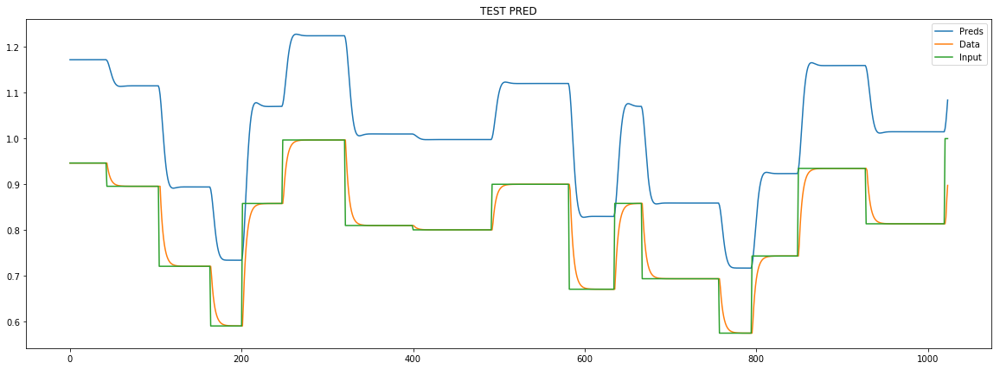

loss rate [0.005102099021319195]
Epoch [59] 
     train_loss[105.55415529872361] 
     eval_train[102.99637088466149] 
     eval_test[109.29135856845163]


KeyboardInterrupt: 

In [14]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()
# todo try init hidden each batch
    

for t in range(num_epochs):
            
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        y_pred = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = y_pred[:, 1].mean()
    hist['mean_params_sample']['2'][t] = y_pred[:, 2].mean()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} {hist['mean_params_sample']['2'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_const = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"const loss {mean_const}")
    print(f"combined loss {mean_main + mean_aux + mean_const} ")
    
    # VISUALISE TRAINING PROGRESS
    x_batch, y_batch, indexes = data
    plot_shared_scale([
        (y_pred[:, 0].detach().numpy(),"Preds" ),
         (y_batch[:, 0].detach().numpy(), "Data"),
         (x_batch[-1].detach().numpy(), "Input")
        ],
        title="TRAIN PREDICT")
          
    residuals = y_batch[:, 0] - y_pred[:, 0]
    plot_multiscale([
        (residuals.detach().numpy(), "Red"),
        (y_batch[:, 0].detach().numpy(), "Green")
    ],
        title="TRAIN RESID"
    ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    plot_shared_scale([
            (y_pred_test[:, 1].detach().numpy(),"Preds" ),
            (y_pred_test[:, 2].detach().numpy(),"Preds" ),
    ],
        title = 'TEST AUX'
    )
          
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(),"Preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    # /VISUALISE ITERATION PRED
    
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
    if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
          print("Loss critically low, EARLY STOPPING")
          break
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")

    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [15]:
hist['lr'][t-1] <= 10**p_sched['early_stop_order'] * 1.0001

False

In [16]:
hist['lr'][t-1] 

0.001

In [17]:
s, e = 0, t

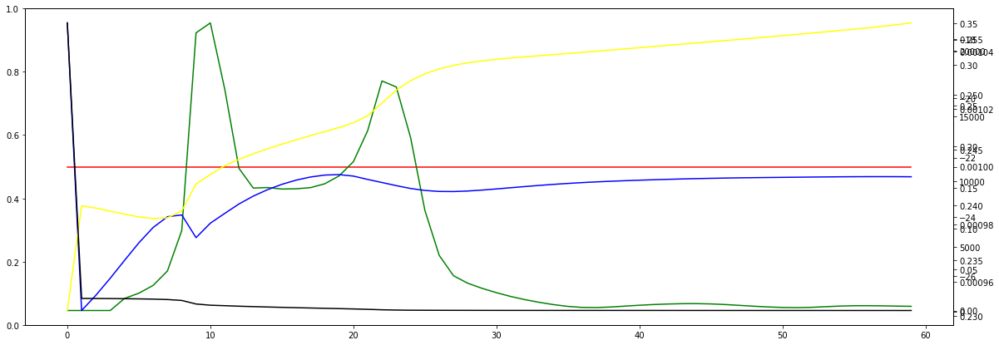

In [18]:
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']["epochs"]['aux'][s:e], "Black")
])

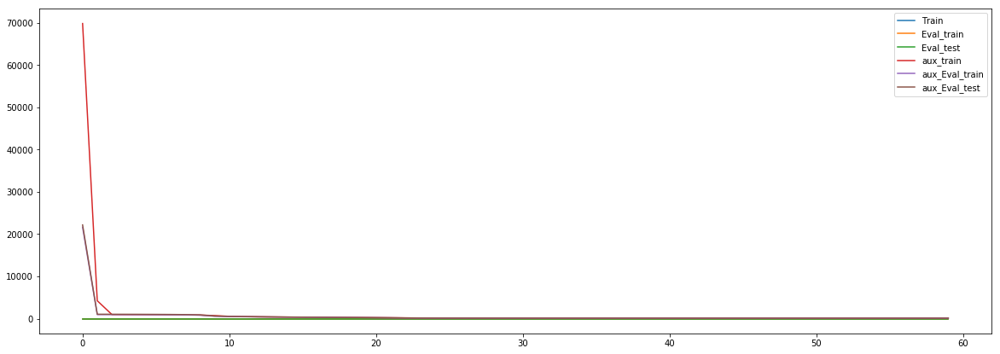

In [19]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

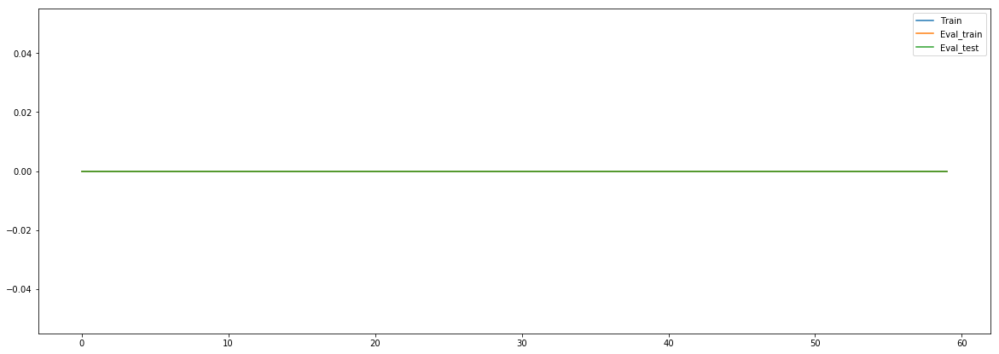

In [20]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

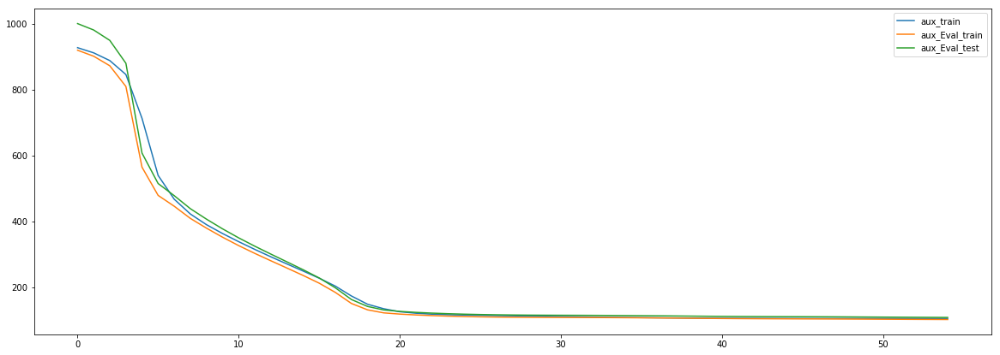

In [23]:
s = 5
plot_shared_scale([
#     (hist['train']["epochs"]['main'][s:e],"Train" ),
#     (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
#     (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

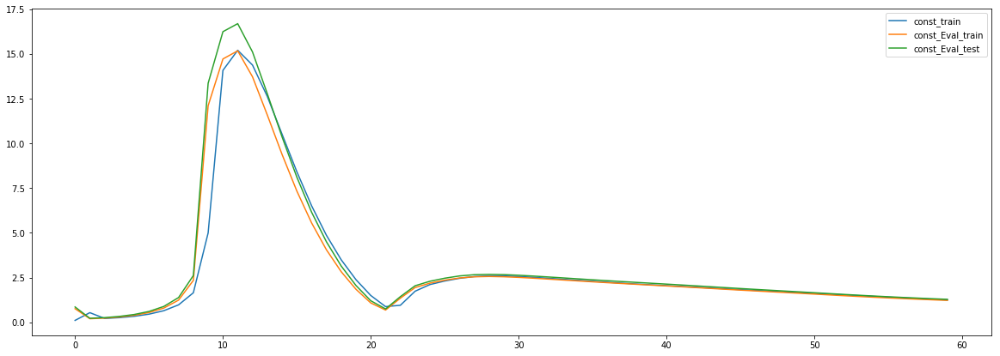

In [22]:
plot_shared_scale([
    (hist['train']["epochs"]['const'][s:e], "const_train"),
    (hist['eval_train']['epochs']['const'][s:e], "const_Eval_train"),
    (hist['eval_test']['epochs']['const'][s:e], "const_Eval_test")
])

In [ ]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
])

In [ ]:
model.buffers

In [ ]:
logging.info("Training process END")